<a href="https://colab.research.google.com/github/argatf05/Olist-SellerRetention/blob/main/Analyzing%20Olist%20Seller%20Retention.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <p style="text-align:center;"> **Brazilian E-Commerce Olist: Customer Segmentation**</p>
### <p style="text-align:center;"> **Final Project**</p>
---
<p style="text-align:center;"> By Alpha Group JCDS015-1-online</p>

In [ ]:
!pip install category_encoders
!pip install xgboost
!pip install scikit-learn
!pip install plotly

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.0/82.0 kB 2.4 MB/s eta 0:00:00


In [ ]:
import missingno as msno
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go
import plotly.graph_objs as go
import plotly.io as pio
import plotly as py
import json
import folium
import plotly.express as px
from scipy.stats import linregress
from plotly.subplots import make_subplots

from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

# Business Understanding

Olist is a service provider for businesses, Brazilian e-commerce platform that helps small and medium-sized businesses sell their products on major online marketplaces. It acts as an intermediary, allowing these businesses to reach a wider audience by listing their products on multiple e-commerce platforms, including some of the big names in Brazil. Olist takes care of the logistics, customer service, and other aspects, making it easier for businesses to sell online (B2B2C). The primary goals of this platform is to simplify the e-commerse process, enabling business to focus on growth and customer engagement.

There are 5 products and services by Olist, namely:
1. Olist Store:  A platform that enables sellers to list and sell their products across multiple major Brazilian marketplaces, providing centralized management and logistics support.
2. Olist Hub: A service that manages seller accounts across sales channels, optimizing product listings and pricing for marketplace fulfillment.
3. Olist Envios (Olist Shipping): A logistics service integrated into the Olist platform, facilitating product delivery through Olist's logistics partners.
4. Olist Tiny: An ERP system that simplifies business operations and automates workflows, supporting growth across various business sizes and sectors.
5. Olist Vnda: An omnichannel e-commerce platform offering advanced technology and integrated resources to boost business growth.

One of article in 2021 explain that the company wants to go beyond marketplaces, and the new capital will enable it to offer a fulfillment operation, set to open early in 2022, as well as financial services. Retailers on Olist already have access to credit lines for working capital, but the company plans to expand that technology to include risk management, accelerated sales and internal credit models for merchants

Source:
1. https://pitchbook.com/profiles/company/102473-65#overview
2. https://techcrunch.com/2021/12/15/brazils-olist-gets-its-horn-with-new-186m-funding-round/
3. https://www.crunchbase.com/organization/olist


# Problem Statement

Olist, a Brazilian e-commerce platform that supports small and medium-sized businesses by facilitating sales through major online marketplaces, faces a significant challenge in seller retention. Despite its role in simplifying e-commerce processes and enabling sellers to focus on growth, recent trends indicate a decline in seller retention. This issue threatens the sustainability of Olist's business model, as retaining active and high-performing sellers is critical to maintaining platform engagement and revenue.

To address this, Olist has implemented a rule-based RFM (Recency, Frequency, Monetary) clustering approach to segment sellers based on their transaction behaviors. However, this static method may not fully capture the dynamic nature of seller performance and market trends, raising the question of whether machine learning-based clustering could provide a more accurate and actionable segmentation.

The primary objective of this project is to explore how sellers can be **clustered using RFM analysis** to determine which clusters they belong to in terms of their activity and total transaction value, which can act as a base for us to analyze ways to minimize **churn rates**. This involves **evaluating the effectiveness of machine learning (ML)-based clustering** compared to the existing rule-based approach, identifying meaningful patterns in seller behavior, and leveraging these insights to develop strategies that improve retention and engagement. By refining the seller clustering methodology, Olist aims to maintain and optimizing the sellers retention rate.

**Value**: Sellers Clustering

**Goal**: Optimizing sellers retention rate


- **Problem Statement for Analytics:**

After the seller clusters have been determined, we will then analyze each of these clusters to profile the sellers and see their differences in behavior based on RFM, particularly those that directly affect Olist's bottom line.

To optimize seller retention, it is essential to gain a comprehensive understanding of seller behavior and performance. This begins with building a **cohort analysis** to track and analyze seller activity over time, helping to identify trends in retention and churn rates. Additionally, understanding the geographical distribution of the most active sellers will provide insights into regional variations in seller performance and help prioritize areas for targeted intervention. Investigating the types of products sold by these active sellers can shed light on which categories drive engagement and revenue, enabling tailored strategies to boost sales in those segments.

Furthermore, determining which seller segments should be prioritized for retention efforts—based on their RFM scores and contribution to overall platform performance—will ensure that resources are allocated effectively. By combining these insights, Olist can develop targeted strategies to minimize the decline in seller retention, fostering a sustainable and thriving marketplace.

**Action**: Targeting

**Goal**: Optimizing sellers retention

# Limitation

- The datasets analyzed had inherent duplicates in order_id and we found it difficult to remove all of them. Hence, we try not to use the joined dataframe as is (instead we call the dataframe by way of .groupby() operations.)
- We have used `Order Value per Product` (`price` + `freight_value`) instead of directly using `payment_value` for calculation purposes because the calculated payment value and the actual payment value are different, and we found no literature on either Google or Kaggle on why this is. This is done in order to make our numbers more consistent.
- The timeframe of the dataframe goes from 5/9/2016 to 12/11/2018.

# Data Understanding

This is a Brazilian ecommerce public dataset of orders made at Olist Store.The dataset has information of almost 100k orders from 2016 to 2018 made at multiple marketplaces in Brazil. Its features allows viewing an order from multiple dimensions: from order status, price, payment and freight performance to customer location, product attributes and finally reviews written by customers. We also released a geolocation dataset that relates Brazilian zip codes to lat/lng coordinates.

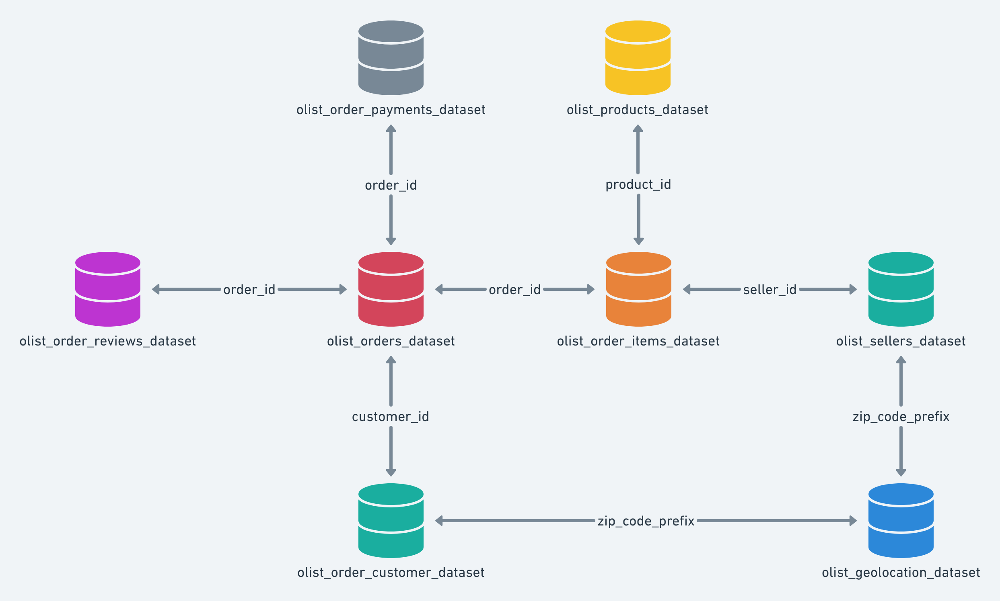

In [ ]:
customers = pd.read_csv('olist_customers_dataset.csv')
orders = pd.read_csv('olist_orders_dataset.csv')
order_items = pd.read_csv('olist_order_items_dataset.csv')
products = pd.read_csv('olist_products_dataset.csv')
sellers = pd.read_csv('olist_sellers_dataset.csv')
geolocation = pd.read_csv('olist_geolocation_dataset.csv')
order_payments = pd.read_csv('olist_order_payments_dataset.csv')
product_category_name_translation = pd.read_csv('product_category_name_translation.csv')
reviews = pd.read_csv('olist_order_reviews_dataset.csv')

It is important that we understand the columns for all of the data pieces in the raw data. Hence, we will create a Data Dictionary for all of the pieces for easy reference.

The Data Dictionary for each piece of the whole dataset is as follows:

## 1. order_items

This dataset contains detailed information about each item within orders placed on the Olist e-commerce platform. It serves to break down orders into individual line items.

| Column | Explanation |
| ---- | ---- |
| > **order_id**| Unique identifier for each order. It is used to connect orders across different datasets (**Linkage to olist_orders_dataset**). |
| order_item_id | Unique identifier for each item within an order. An order might have multiple items, so this helps distinguish between them within the same order. |
| > **product_id** | Unique identifier for each product sold. Used to connect the product's details from the product dataset (**Lingkage to olist_products_dataset**). |
| > **seller_id** | Unique identifier for each seller. Connects the seller information from the sellers dataset (**Linkage to olist_sellers_dataset**). |
| shipping_limit_date | The deadline by which the seller should ship the item to meet customer expectations. |
| price | The price of the product for the individual item within the order. |
| freight_value | The cost of shipping (freight) for that specific item within the order. |


In [ ]:
display(f'Shape tabel:{order_items.shape}')
display(order_items.head(2))

'Shape tabel:(112650, 7)'

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.9,19.93


In [ ]:
def duplicate_rows(df):
    duplicate_data = pd.DataFrame()
    duplicate_data['column'] = df.columns
    duplicate_data['duplicate count'] = [df[column].duplicated(keep=False).sum() for column in df.columns]
    duplicate_data['duplicate values'] = [df[df[column].duplicated(keep=False)][column].unique() for column in df.columns]

    duplicate_data.index += 1
    return duplicate_data

duplicate_rows(order_items)

,column,duplicate count,duplicate values
1,order_id,23787,"[0008288aa423d2a3f00fcb17cd7d8719, 00143d0f86d..."
2,order_item_id,112649,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
3,product_id,94533,"[4244733e06e7ecb4970a6e2683c13e61, c777355d18b..."
4,seller_id,112141,"[48436dade18ac8b2bce089ec2a041202, dd7ddc04e1b..."
5,shipping_limit_date,32814,"[2017-05-23 03:55:27, 2018-02-21 02:55:52, 201..."
6,price,110308,"[58.9, 239.9, 199.0, 12.99, 199.9, 21.9, 19.9,..."
7,freight_value,110575,"[13.29, 19.93, 17.87, 12.79, 18.14, 12.69, 11...."


In [ ]:
# Filtering data based on specific values for duplicate checks
check_duplicate1 = order_items[order_items['order_id'] == '0008288aa423d2a3f00fcb17cd7d8719']
check_duplicate2 = order_items[order_items['order_item_id'] == 1]
check_duplicate3 = order_items[order_items['product_id'] == '4244733e06e7ecb4970a6e2683c13e61']
check_duplicate4 = order_items[order_items['seller_id'] == '48436dade18ac8b2bce089ec2a041202']

# Displaying the results
display(f'order_id: shape {check_duplicate1.shape}')
display(check_duplicate1)

display(f'order_item_id: shape {check_duplicate2.shape}')
display(check_duplicate2.head(2))

display(f'product_id: shape {check_duplicate3.shape}')
display(check_duplicate3.head(2))

display(f'seller_id: shape {check_duplicate4.shape}')
display(check_duplicate4.head(2))

'order_id: shape (2, 7)'

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
13,0008288aa423d2a3f00fcb17cd7d8719,1,368c6c730842d78016ad823897a372db,1f50f920176fa81dab994f9023523100,2018-02-21 02:55:52,49.9,13.37
14,0008288aa423d2a3f00fcb17cd7d8719,2,368c6c730842d78016ad823897a372db,1f50f920176fa81dab994f9023523100,2018-02-21 02:55:52,49.9,13.37


'order_item_id: shape (98666, 7)'

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.9,19.93


'product_id: shape (9, 7)'

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29
8346,130898c0987d1801452a8ed92a670612,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-07-05 02:44:11,55.9,17.96


'seller_id: shape (151, 7)'

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29
660,0188777fe321843a18be24a6e9aa1e53,1,436c8d57ff8d4aa254318e9bd9b48c83,48436dade18ac8b2bce089ec2a041202,2017-07-31 14:35:11,55.9,9.94


**Observation**
- `order_item_id` is used to distinguish items within each `order_id`, allowing the total order to be identified by both quantity and order frequency. Each product_id refers to a specific seller, though each seller may have multiple product IDs, making it useful for **analyzing the performance of products sold by each seller**.

We will find the maximum `order_item_id` for each `order_id`. We can use groupby and transform function to filter only those rows where `order_item_id` is the maximum for `each order_id`.

In [ ]:
order_items_obv = order_items[order_items['order_item_id']== order_items.groupby('order_id')['order_item_id'].transform('max')]

order_items_obv.head(5)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


We do not plan to use order_item_id as a column to be used in our analysis, and since it is often the only thing different in what would otherwise be duplicate rows, it must be removed by a groupby function.

In [ ]:
order_items = order_items.groupby(['order_id', 'seller_id', 'product_id']).agg({'price': 'sum', 'freight_value': 'sum'}).reset_index()

## 2. order_reviews

This dataset contains customer reviews associated with orders placed on the Olist e-commerce platform. It captures feedback provided by customers regarding their purchases.

| Column | Explanation |
| ---- | ---- |
| review_id | Unique identifier for each review, used to distinguish individual reviews. |
| > **order_id** | Identifier linking each review to the corresponding order, allowing a connection between customer reviews and their specific orders (**Linkage to olist_orders_dataset**). |
| review_score | Rating given by the customer, on a scale between 1 to 5, representing their satisfaction with the purchase. |
| review_comment_title | Short title or summary of the review provided by the customer, giving a quick overview of their opinion.|
| review_comment_message | Detailed comment or feedback left by the customer, describing their experience with the product or service. |
| review_creation_date | Date when the review was created by the customer, indicating when feedback was provided. |
| review_answer_timestamp | The exact date and time (timestamp) when the review was processed or acknowledged by the system. This can indicate the response time between the review creation and when it was addressed. |


In [ ]:
display(f'Shape tabel:{reviews.shape}')
display(reviews.head(2))

'Shape tabel:(99224, 7)'

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13


In [ ]:
duplicate_rows(reviews)

,column,duplicate count,duplicate values
1,review_id,1603,"[28642ce6250b94cc72bc85960aec6c62, a0a641414ff..."
2,order_id,1098,"[cf73e2cb1f4a9480ed70c154da3d954a, 169d7e0fd71..."
3,review_score,99224,"[4, 5, 1, 3, 2]"
4,review_comment_title,95461,"[nan, recomendo, Super recomendo, Ótimo, Muito..."
5,review_comment_message,64247,"[nan, Péssimo, Loja nota 10, muito boa , boa, ..."
6,review_creation_date,99195,"[2018-01-18 00:00:00, 2018-03-10 00:00:00, 201..."
7,review_answer_timestamp,1921,"[2018-05-05 23:49:04, 2018-03-25 21:03:02, 201..."


**Observation**
- This data, primarily identified by `review_id`, contains customer reviews for specific `order_id`. It includes the review score, title, message, and the date the review was posted.

## 3. orders

This dataset provides comprehensive information about orders placed on the Olist e-commerce platform. It tracks the lifecycle of each order from purchase to delivery.

| Column | Explanation |
| ---- | ---- |
| > **order_id** | Unique identifier for each order, used to link order records across related datasets (**Linkage to: olist_order_payments_dataset, olist_order_reviews_dataset and olist_order_items_dataset**). |
| > **customer_id** | Unique identifier for each time customer making a transaction (**Linkage to olist_customers_dataset**). |
| order_status | Current status of the order, such as 'delivered', 'invoiced' 'shipped', 'processing', 'unavailable', 'canceled', 'created', 'approved', tracking the order's progress through the fulfillment process. |
| order_purchase_timestamp | This is the date and time when the customer successfully placed the order on the platform. It indicates when the transaction was initiated by the customer.|
| order_approved_at | his timestamp indicates when the payment for the order was approved by the seller or the payment processing system. It signifies that the payment has been confirmed and that the seller can begin processing the order. |
| order_delivered_carrier_date | Date when the order was passed to the shipping carrier, initiating the delivery journey. |
| order_delivered_customer_date | Date when the order was delivered to the customer, completing the delivery process. |
| order_estimated_delivery_date | Estimated date by which the order is expected to be delivered, set at the time of purchase for customer reference. |


In [ ]:
display(f'Shape tabel:{orders.shape}')
display(orders.head(2))

'Shape tabel:(99441, 8)'

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00


In [ ]:
duplicate_rows(orders)

,column,duplicate count,duplicate values
1,order_id,0,[]
2,customer_id,0,[]
3,order_status,99441,"[delivered, invoiced, shipped, processing, una..."
4,order_purchase_timestamp,1122,"[2017-08-10 11:58:33, 2018-05-17 16:59:11, 201..."
5,order_approved_at,15753,"[2018-07-26 03:24:27, 2017-04-13 13:25:17, 201..."
6,order_delivered_carrier_date,28515,"[2018-07-26 14:31:00, 2018-08-08 13:50:00, nan..."
7,order_delivered_customer_date,4581,"[nan, 2018-03-21 22:03:54, 2017-05-29 12:47:20..."
8,order_estimated_delivery_date,99420,"[2017-10-18 00:00:00, 2018-08-13 00:00:00, 201..."


**Observation**

- Having an `order_id` for each `customer_id` and `seller_id` will help in identifying the order status and tracking the order history from the time of purchase to delivery.

## 4. products

This dataset contains detailed information about the products sold on the Olist e-commerce platform. It provides insights into product characteristics, categorization, and inventory management (products' dimensions)

| Column | Explanation |
| ---- | ---- |
| > **product_id** | Unique identifier for each product, allowing for easy reference and connection to other datasets (**Linkage to olist_order_items_dataset**). |
| product_category_name| The name of the category to which the product belongs (e.g., perfumaria (perfumery), artes (arts)), helping to classify products for better organization and searching. |
| product_name_length | The length (in characters) of the product name. |
| product_description_length | The length (in characters) of the product description, providing insight into how much detail is given about the product. |
| product_photos_qty | The total number of photos available for the product. |
| product_weight_g | The weight of the product in grams. |
| product_length_cm | The length of the product in centimeters. |
| product_height_cm | The height of the product in centimeters. |
| product_width_cm | The width of the product in centimeters. |

In [ ]:
display(f'Shape tabel:{products.shape}')
display(products.head(2))

'Shape tabel:(32951, 9)'

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0


In [ ]:
duplicate_rows(products)

,column,duplicate count,duplicate values
1,product_id,0,[]
2,product_category_name,32950,"[perfumaria, artes, esporte_lazer, bebes, util..."
3,product_name_lenght,32944,"[40.0, 44.0, 46.0, 27.0, 37.0, 60.0, 56.0, 57...."
4,product_description_lenght,32282,"[287.0, 276.0, 250.0, 261.0, 402.0, 745.0, 127..."
5,product_photos_qty,32949,"[1.0, 4.0, 2.0, 3.0, 5.0, 9.0, 6.0, nan, 7.0, ..."
6,product_weight_g,31916,"[225.0, 1000.0, 154.0, 371.0, 625.0, 200.0, 18..."
7,product_length_cm,32950,"[16.0, 30.0, 18.0, 26.0, 20.0, 38.0, 70.0, 40...."
8,product_height_cm,32948,"[10.0, 18.0, 9.0, 4.0, 17.0, 5.0, 24.0, 8.0, 1..."
9,product_width_cm,32942,"[14.0, 20.0, 15.0, 26.0, 13.0, 11.0, 44.0, 40...."


**Observation**

- `product_id` is a unique code for each product. This data can be used to identify the details of each ordered product.


## 5. geolocation

This dataset contains geolocation information related to the orders placed on the Olist e-commerce platform. It provides insights into the geographic distribution of customers and orders.

| Column | Explanation |
| ---- | ---- |
| > **geolocation_zip_code_prefix** | The prefix of the zip code corresponding to customer addresses, used to categorize and identify geographic regions (**Linkage to: olist_sellers_dataset and olist_customers_dataset**). |
| geolocation_lat | The latitude coordinate of the location, which, along with longitude, helps pinpoint the exact geographic location of the customer or delivery address. |
| geolocation_lng | The longitude coordinate of the location, completing the geographic coordinates needed for mapping and spatial analysis. |
| geolocation_city | The name of the city associated with the zip code. |
| geolocation_state | The name of the state associated with the zip code. |


In [ ]:
display(f'Shape tabel:{geolocation.shape}')
display(geolocation.head(2))

'Shape tabel:(1000163, 5)'

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP


In [ ]:
duplicate_rows(geolocation)

,column,duplicate count,duplicate values
1,geolocation_zip_code_prefix,999120,"[1037, 1046, 1041, 1035, 1012, 1047, 1013, 102..."
2,geolocation_lat,415494,"[-23.54562128115268, -23.54608112703553, -23.5..."
3,geolocation_lng,415135,"[-46.63929204800168, -46.64482029837157, -46.6..."
4,geolocation_city,999340,"[sao paulo, são paulo, sao bernardo do campo, ..."
5,geolocation_state,1000163,"[SP, RN, AC, RJ, ES, MG, BA, SE, PE, AL, PB, C..."


**Observation**

- This data can be used to visualize the location points of buyers and sellers.

## 6. sellers

This dataset contains information about the sellers who operate on the Olist e-commerce platform.

| Column | Explanation |
| ---- | ---- |
| > **seller_id** | Unique identifier for each seller on the platform, used to link seller information with orders and products (**Linkage to olist_order_items_dataset**). |
| > **seller_zip_code_prefix** | The zip code prefix associated with the seller’s location, which helps identify the geographic region where the seller operates (**Linkage to olist_geolocation_dataset**).|
| seller_city | The name of the city where the seller is located. |
| seller_state | The name of the state where the seller is based. |


In [ ]:
display(f'Shape tabel:{geolocation.shape}')
display(sellers.head(2))

'Shape tabel:(1000163, 5)'

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP


In [ ]:
duplicate_rows(sellers)

,column,duplicate count,duplicate values
1,seller_id,0,[]
2,seller_zip_code_prefix,1386,"[13023, 20031, 12914, 16304, 80310, 42738, 887..."
3,seller_city,2753,"[campinas, mogi guacu, rio de janeiro, sao pau..."
4,seller_state,3090,"[SP, RJ, PE, PR, GO, SC, BA, DF, RS, MG, RN, M..."


**Observation**

- This data gives information about the origin of the sellers.


## 7. order_payments

This dataset provides detailed information about the payment methods used for orders placed on the Olist e-commerce platform.

| Column | Explanation |
| ---- | ---- |
| > **order_id** | Unique identifier for each order, linking payment information to specific orders within the Olist system (**Linkage to olist_orders_dataset**). |
| payment_sequential | A sequential number that indicates the order of the payment method used for the order. This is useful when a customer uses multiple payment methods for a single order. |
| payment_type | The type of payment method used (e.g., credit card, boleto, debit card). |
| payment_installments | The number of installments in which the payment was made, reflect customer financing options and preferences. |
| payment_value | The total amount paid for the order using the specified payment method. |


In [ ]:
display(f'Shape tabel:{order_payments.shape}')
display(order_payments.head(2))

'Shape tabel:(103886, 5)'

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39


In [ ]:
duplicate_rows(order_payments)

,column,duplicate count,duplicate values
1,order_id,7407,"[5cfd514482e22bc992e7693f0e3e8df7, b2bb080b6bc..."
2,payment_sequential,103883,"[1, 2, 4, 5, 3, 8, 6, 7, 10, 11, 17, 19, 12, 9..."
3,payment_type,103886,"[credit_card, boleto, voucher, debit_card, not..."
4,payment_installments,103884,"[8, 1, 2, 3, 6, 5, 4, 10, 7, 12, 9, 13, 15, 24..."
5,payment_value,90787,"[99.33, 24.39, 65.71, 107.78, 128.45, 96.12, 8..."


In [ ]:
# Filtering data based on the specified order_id
check_duplicate = order_payments[order_payments['order_id'] == '5cfd514482e22bc992e7693f0e3e8df7']
check_duplicate

,order_id,payment_sequential,payment_type,payment_installments,payment_value
25,5cfd514482e22bc992e7693f0e3e8df7,2,voucher,1,45.17
57742,5cfd514482e22bc992e7693f0e3e8df7,1,credit_card,4,665.41


In order to remove the duplicates, especially in terms of `order_id`, we will groupby by this column first.

In [ ]:
order_payments = order_payments.groupby('order_id')['payment_value'].sum('payment_value').reset_index()

**Observation**

- We can use this dataset to find out just how much the customer actually paid for each `order_id` by way of observing its `payment_value`.

## 8. customers

This dataset contains essential information about customers who have made purchases on the Olist e-commerce platform. It provides insights into customer demographics and geographic distribution.

| Column | Explanation |
| ---- | ---- |
| > **customer_id** | Unique identifier for each customer, used to link customer information to orders, reviews, and other related datasets(**Direct linkage to olist_orders_dataset**). |
| customer_unique_id | A unique identifier for each customer that remains constant across their multiple orders. |
| customer_zip_code_prefix | The zip code prefix associated with the customer's address. |
| customer_city | The name of the city where the customer resides. |
| customer_state | The name of the state where the customer is located. |



In [ ]:
display(f'Shape tabel:{customers.shape}')
display(customers.head(2))

'Shape tabel:(99441, 5)'

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP


In [ ]:
duplicate_rows(customers)

,column,duplicate count,duplicate values
1,customer_id,0,[]
2,customer_unique_id,6342,"[4c93744516667ad3b8f1fb645a3116a4, 1175e95fb47..."
3,customer_zip_code_prefix,96429,"[14409, 9790, 1151, 8775, 13056, 89254, 4534, ..."
4,customer_city,98297,"[franca, sao bernardo do campo, sao paulo, mog..."
5,customer_state,99441,"[SP, SC, MG, PR, RJ, RS, PA, GO, ES, BA, MA, M..."


In [ ]:
# Filter data based on customer_unique_id
check_duplicate = customers[customers['customer_unique_id'] == '4c93744516667ad3b8f1fb645a3116a4']
check_duplicate

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
5,879864dab9bc3047522c92c82e1212b8,4c93744516667ad3b8f1fb645a3116a4,89254,jaragua do sul,SC
66803,802bb9a59876a712f8380da8f297057c,4c93744516667ad3b8f1fb645a3116a4,89253,jaragua do sul,SC


**Observation**

- `customer_id` refers to a unique ID for each transaction made by a customer (specific to the order), meaning the ID will always be different for each transaction (not unique per customer).
- `customer_unique_id` refers to a unique ID for each customer, meaning the ID will remain the same across different transactions (unique per customer).

- Having `customer_unique_id` will help in identifying individual customer behavior by tracking the number of transactions without being affected by `customer_id`.

## 9. category_name

This dataset provides translations of product category names from their original language (Portuguese) to English.

| Column | Explanation |
| ---- | ---- |
| > **product_category_name** | The name of the product category in its original language, used for classifying and organizing products within the e-commerce platform (**Linkage to olist_products_dataset**). |
| product_category_name_english | The translated name of the product category in English.|




In [ ]:
display(f'Shape tabel:{product_category_name_translation.shape}')
display(product_category_name_translation.head(2))

'Shape tabel:(71, 2)'

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories


In [ ]:
duplicate_rows(product_category_name_translation)

,column,duplicate count,duplicate values
1,product_category_name,0,[]
2,product_category_name_english,0,[]


**Observation**

- This data translates `product_category_name` from Portuguese to `product_category_name_english` in English.

With all of these datasets in mind, we will create the dataframe `df` by merging it this way:

In [ ]:
df = orders.merge(order_items, on='order_id', how='left'
          ).merge(products, on='product_id', how='left'
          ).merge(product_category_name_translation, on='product_category_name', how='left'
          ).merge(sellers, on='seller_id', how='left').merge(order_payments, on='order_id', how='left'
          ).merge(customers, on='customer_id', how='left'
          ).sort_values(by = 'order_purchase_timestamp', ascending = True).reset_index().drop('index', axis=1)

We will cover how to deal with the missingno and duplicates in the Exploratory Data Analysis (EDA) and Data Cleaning Phases.

# Exploratory Data Analysis (EDA)

In [ ]:
df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,seller_id,product_id,...,product_width_cm,product_category_name_english,seller_zip_code_prefix,seller_city,seller_state,payment_value,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,2e7a8482f6fb09756ca50c10d7bfc047,08c5351a6aca1c1589a38f244edeee9d,shipped,2016-09-04 21:15:19,2016-10-07 13:18:03,2016-10-18 13:14:51,NaN,2016-10-20 00:00:00,1554a68530182680ad5c8b042c3ab563,c1488892604e4ba5cff5b4eb4d595400,...,28.0,furniture_decor,37580.0,monte siao,MG,136.23,b7d76e111c89f7ebf14761390f0f7d17,69309,boa vista,RR
1,2e7a8482f6fb09756ca50c10d7bfc047,08c5351a6aca1c1589a38f244edeee9d,shipped,2016-09-04 21:15:19,2016-10-07 13:18:03,2016-10-18 13:14:51,NaN,2016-10-20 00:00:00,1554a68530182680ad5c8b042c3ab563,f293394c72c9b5fafd7023301fc21fc2,...,28.0,furniture_decor,37580.0,monte siao,MG,136.23,b7d76e111c89f7ebf14761390f0f7d17,69309,boa vista,RR
2,e5fa5a7210941f7d56d0208e4e071d35,683c54fc24d40ee9f8a6fc179fd9856c,canceled,2016-09-05 00:15:34,2016-10-07 13:17:15,NaN,NaN,2016-10-28 00:00:00,a425f92c199eb576938df686728acd20,f3c2d01a84c947b078e32bbef0718962,...,25.0,telephony,81050.0,curitiba,PR,75.06,4854e9b3feff728c13ee5fc7d1547e92,99025,passo fundo,RS
3,809a282bbd5dbcabb6f2f724fca862ec,622e13439d6b5a0b486c435618b2679e,canceled,2016-09-13 15:24:19,2016-10-07 13:16:46,NaN,NaN,2016-09-30 00:00:00,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,40.95,009b0127b727ab0ba422f6d9604487c7,12244,sao jose dos campos,SP
4,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,ecccfa2bb93b34a3bf033cc5d1dcdc69,5a6b04657a4c5ee34285d1e4619a96b4,...,16.0,health_beauty,81810.0,curitiba,PR,NaN,830d5b7aaa3b6f1e9ad63703bec97d23,14600,sao joaquim da barra,SP


## Unique Values and Value Types

In [ ]:
NaNChecker = []
for i in df:
  NaNChecker.append([i, df[i].nunique(), df[i].unique()])

NaNResult = pd.DataFrame(columns=['Column', 'Number of Unique Values', 'All Unique Values'], data=NaNChecker)
NaNResult

,Column,Number of Unique Values,All Unique Values
0,order_id,99441,"[2e7a8482f6fb09756ca50c10d7bfc047, e5fa5a72109..."
1,customer_id,99441,"[08c5351a6aca1c1589a38f244edeee9d, 683c54fc24d..."
2,order_status,8,"[shipped, canceled, delivered, invoiced, unava..."
3,order_purchase_timestamp,98875,"[2016-09-04 21:15:19, 2016-09-05 00:15:34, 201..."
4,order_approved_at,90733,"[2016-10-07 13:18:03, 2016-10-07 13:17:15, 201..."
5,order_delivered_carrier_date,81018,"[2016-10-18 13:14:51, nan, 2016-11-07 17:11:53..."
6,order_delivered_customer_date,95664,"[nan, 2016-11-09 07:47:38, 2016-10-26 14:02:13..."
7,order_estimated_delivery_date,459,"[2016-10-20 00:00:00, 2016-10-28 00:00:00, 201..."
8,seller_id,3095,"[1554a68530182680ad5c8b042c3ab563, a425f92c199..."
9,product_id,32951,"[c1488892604e4ba5cff5b4eb4d595400, f293394c72c..."


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103200 entries, 0 to 103199
Data columns (total 29 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   order_id                       103200 non-null  object 
 1   customer_id                    103200 non-null  object 
 2   order_status                   103200 non-null  object 
 3   order_purchase_timestamp       103200 non-null  object 
 4   order_approved_at              103040 non-null  object 
 5   order_delivered_carrier_date   101398 non-null  object 
 6   order_delivered_customer_date  100195 non-null  object 
 7   order_estimated_delivery_date  103200 non-null  object 
 8   seller_id                      102425 non-null  object 
 9   product_id                     102425 non-null  object 
 10  price                          102425 non-null  float64
 11  freight_value                  102425 non-null  float64
 12  product_category_name         

The following changes will have to be made to their DTypes, we will do the pre-cleaning data as follows:
- `order_purchase_timestamp`, `order_approved_at`, `order_delivered_carrier_date`, `order_delivered_customer_date`, `order_estimated_delivery_date` will be correctly switched to datetime.

Correcting Column Data Types

In [ ]:
df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'])
df['order_approved_at'] = pd.to_datetime(df['order_approved_at'])
df['order_delivered_carrier_date'] = pd.to_datetime(df['order_delivered_carrier_date'])
df['order_delivered_customer_date'] = pd.to_datetime(df['order_delivered_customer_date'])
df['order_estimated_delivery_date'] = pd.to_datetime(df['order_estimated_delivery_date'])

Since NaNs already exist in the DataFrame, there won't be many of these hidden NaNs left, and so we can find them based on frequency of the values in ascending order. We will check the Missingno.

##Checking for Missingno

In [ ]:
NaNPerColumn = pd.DataFrame({'NaNs':df.isnull().sum().sort_values(ascending = False)})
NaNPerColumn['% of Total'] = ((NaNPerColumn['NaNs']/df.shape[0])*100).round(3).astype(str)+'%'
NaNPerColumn = NaNPerColumn[NaNPerColumn['NaNs'] != 0]
NaNPerColumn

,NaNs,% of Total
order_delivered_customer_date,3005,2.912%
product_category_name_english,2257,2.187%
product_description_lenght,2235,2.166%
product_category_name,2235,2.166%
product_photos_qty,2235,2.166%
product_name_lenght,2235,2.166%
order_delivered_carrier_date,1802,1.746%
product_width_cm,791,0.766%
product_height_cm,791,0.766%
product_length_cm,791,0.766%


<Axes: >

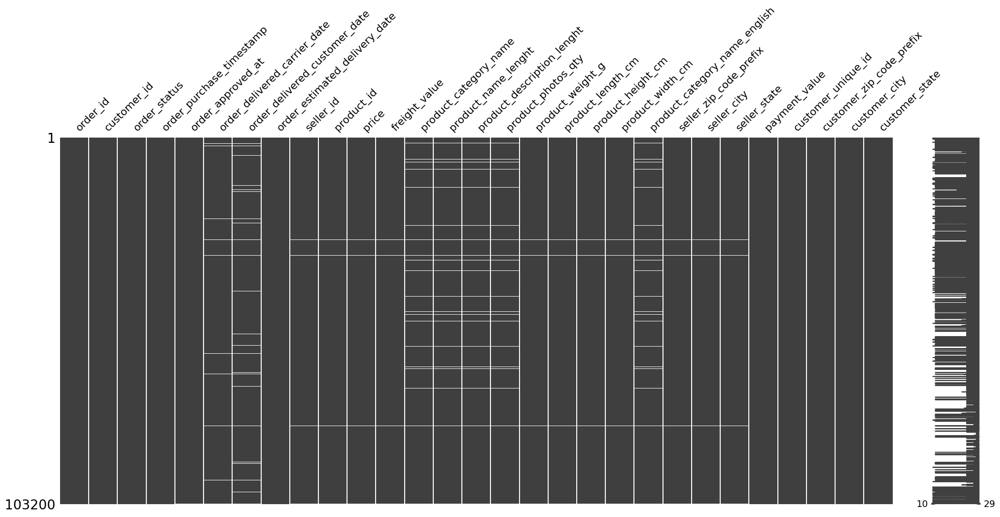

In [ ]:
msno.matrix(df)

We will check for missing data in:
#### **`order_delivered_customer_date (2.9%)`**
Since it is related to delivery, we will use the columns review date & score, status, and delivery date

In [ ]:
# check missing data in order_delivered_customer_date then show order_status 'cancaled' which have order_delivered_customer_date
df_del_cust = df[df['order_delivered_customer_date'].isna()][['order_delivered_customer_date','order_estimated_delivery_date','order_status']]
df_date_cus_del = df[(df['order_status'] == 'delivered' ) & (df['order_delivered_customer_date'].isna())][['order_delivered_customer_date','order_estimated_delivery_date','order_status']]
df_date_cus_not_del = df[(df['order_status'] != 'delivered' )& (df['order_delivered_customer_date'].notna())][['order_delivered_customer_date','order_estimated_delivery_date','order_status']]

print(f'Description missing value in order_delivered_customer_date {df_del_cust.order_status.value_counts()}')

Description missing value in order_delivered_customer_date order_status
shipped        1128
canceled        622
unavailable     610
invoiced        324
processing      306
delivered         8
created           5
approved          2
Name: count, dtype: int64


**Observations**

- The `order_delivered_customer_date` (time when the order was received by the customer) is mostly populated when the item is delivered. However, there are 8 instances of NaT when the order status is marked as delivered.
- There are instances with an order status of canceled but still have an `order_delivered_customer_date`.
- Based on the order status, dates for delivered orders should ideally be filled. We will **fill the NaNs delivery date with 2000/11/11 as date placeholder** since it is outside the timeframe of our data, therefore it will not interfere with our data analysis.

Please refer to the Data Cleaning Phase section for details on how the filling process will be handled.

#### **`product_category_name & product_category_name_english (2.18%)`**

In [ ]:
df[df['product_category_name_english'].isna()][['product_category_name', 'product_category_name_english']]

,product_category_name,product_category_name_english
3,NaN,NaN
14,NaN,NaN
17,NaN,NaN
21,NaN,NaN
61,NaN,NaN
...,...,...
103195,NaN,NaN
103196,NaN,NaN
103197,NaN,NaN
103198,NaN,NaN


It is found that there are rows that have NaN `product_category_name` and `product_category_name_english`. We will fill them with 'unknown' on the data cleaning phase.

In [ ]:
# Display rows where 'product_category_name_english' is NaN, but 'product_category_name' is not NaN
df[df['product_category_name_english'].isna() & df['product_category_name'].notna()][['product_category_name', 'product_category_name_english']]

,product_category_name,product_category_name_english
7027,pc_gamer,NaN
7658,pc_gamer,NaN
11378,pc_gamer,NaN
13909,pc_gamer,NaN
59320,pc_gamer,NaN
78494,portateis_cozinha_e_preparadores_de_alimentos,NaN
78712,portateis_cozinha_e_preparadores_de_alimentos,NaN
93367,portateis_cozinha_e_preparadores_de_alimentos,NaN
93556,portateis_cozinha_e_preparadores_de_alimentos,NaN
93895,portateis_cozinha_e_preparadores_de_alimentos,NaN


**Observations**

We found that `product_category_name` remain untranslated into English. We will fill these NaN values with the translated category names during the Data Cleaning Phase section.

#### **`product description (2.16%)`**

In [ ]:
# Filter and display rows where any of the specified columns have NaN values
columns_with_na = [
    'product_photos_qty',
]

# Filter rows where any of the selected columns has NaN values
rows_with_na = df[df[columns_with_na].isna().any(axis=1)]

# Display the filtered rows
rows_with_na[columns_with_na]

,product_photos_qty
3,NaN
14,NaN
17,NaN
21,NaN
61,NaN
...,...
103195,NaN
103196,NaN
103197,NaN
103198,NaN


**Observations**

We found several rows missing product photos. Since we are not going to use this column, we will delete them. Please refer to the Data Cleaning Phase section for more details.

#### **`order_delivered_carrier_date (1.7%)`**

In [ ]:
# Filter rows where 'order_delivered_carrier_date' is NaN
missing_delivery_date = df[df['order_delivered_carrier_date'].isna()]
missing_delivery_date

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,seller_id,product_id,...,product_width_cm,product_category_name_english,seller_zip_code_prefix,seller_city,seller_state,payment_value,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
2,e5fa5a7210941f7d56d0208e4e071d35,683c54fc24d40ee9f8a6fc179fd9856c,canceled,2016-09-05 00:15:34,2016-10-07 13:17:15,NaT,NaT,2016-10-28,a425f92c199eb576938df686728acd20,f3c2d01a84c947b078e32bbef0718962,...,25.0,telephony,81050.0,curitiba,PR,75.06,4854e9b3feff728c13ee5fc7d1547e92,99025,passo fundo,RS
3,809a282bbd5dbcabb6f2f724fca862ec,622e13439d6b5a0b486c435618b2679e,canceled,2016-09-13 15:24:19,2016-10-07 13:16:46,NaT,NaT,2016-09-30,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,40.95,009b0127b727ab0ba422f6d9604487c7,12244,sao jose dos campos,SP
5,71303d7e93b399f5bcd537d124c0bcfa,b106b360fe2ef8849fbbd056f777b4d5,canceled,2016-10-02 22:07:52,2016-10-06 15:50:56,NaT,NaT,2016-10-25,25e6ffe976bd75618accfe16cefcbd0d,d2998d7ced12f83f9b832f33cf6507b6,...,18.0,baby,5503.0,sao paulo,SP,109.34,0eb1ee9dba87f5b36b4613a65074337c,2975,sao paulo,SP
17,1aecadf4362edaca7fa033e882076c8d,e81a9f176936e3124dfd90c483bf3289,canceled,2016-10-04 10:05:45,2016-10-04 10:26:40,NaT,NaT,2016-11-24,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,50.74,823c47d4abda1f8ce7568145f76c2b85,13175,sumare,SP
21,620b0acb9258b51defbc51804c5298d5,9012f48ac2c416c82819101da4e4b75e,canceled,2016-10-04 11:44:01,2016-10-05 08:45:09,NaT,NaT,2016-12-06,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,451.44,89ff26f9d000b4a6d0f6e8c513f1cf08,78556,sinop,MT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103195,392ed9afd714e3c74767d0c4d3e3f477,2823ffda607a2316375088e0d00005ec,canceled,2018-09-29 09:13:03,NaT,NaT,NaT,2018-10-15,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,137.03,9bb92bebd4cb7511e1a02d5e50bc4655,7176,guarulhos,SP
103196,616fa7d4871b87832197b2a137a115d2,bf6181a85bbb4115736c0a8db1a53be3,canceled,2018-10-01 15:30:09,NaT,NaT,NaT,2018-10-23,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,80.38,634420a0ea42302205032ed44ac7fccc,27175,pirai,RJ
103197,a2ac6dad85cf8af5b0afb510a240fe8c,4c2ec60c29d10c34bd49cb88aa85cfc4,canceled,2018-10-03 18:55:29,NaT,NaT,NaT,2018-10-16,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,197.55,af5454198a97379394cacf676e1e96cb,11900,registro,SP
103198,b059ee4de278302d550a3035c4cdb740,856336203359aa6a61bf3826f7d84c49,canceled,2018-10-16 20:16:02,NaT,NaT,NaT,2018-11-12,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,222.03,262e1f1e26e92e86375f86840b4ffd63,64600,picos,PI


**Observations**

We found details of delivery date with NaN values. Like with `order_delivered_customer_date`, we will fill it with date placeholder on Data Cleaning Phase section.

#### **`product details width/height/length/weight (0.7%)`**

In [ ]:
# Filter and display rows where any of the specified columns have NaN values
columns_with_na = [
    'product_weight_g',
    'product_length_cm',
    'product_height_cm',
    'product_width_cm'
]

# Filter rows where any of the selected columns has NaN values
rows_with_na = df[df[columns_with_na].isna().any(axis=1)]

# Display the filtered rows
rows_with_na[columns_with_na]

,product_weight_g,product_length_cm,product_height_cm,product_width_cm
3,NaN,NaN,NaN,NaN
17,NaN,NaN,NaN,NaN
21,NaN,NaN,NaN,NaN
61,NaN,NaN,NaN,NaN
83,NaN,NaN,NaN,NaN
...,...,...,...,...
103195,NaN,NaN,NaN,NaN
103196,NaN,NaN,NaN,NaN
103197,NaN,NaN,NaN,NaN
103198,NaN,NaN,NaN,NaN


**Observations**

We found products with NaN values of their dimensions. Since we are not going to use these columns, we will delete them. Please refer to Data Cleaning Phase section.

#### **`seller (0.75%)`**

In [ ]:
# Check for rows with missing values in 'seller_id', 'seller_state', or 'seller_city'
missing_data = df[df[['seller_id', 'seller_state', 'seller_city']].isna().any(axis=1)]
missing_data

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,seller_id,product_id,...,product_width_cm,product_category_name_english,seller_zip_code_prefix,seller_city,seller_state,payment_value,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
3,809a282bbd5dbcabb6f2f724fca862ec,622e13439d6b5a0b486c435618b2679e,canceled,2016-09-13 15:24:19,2016-10-07 13:16:46,NaT,NaT,2016-09-30,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,40.95,009b0127b727ab0ba422f6d9604487c7,12244,sao jose dos campos,SP
17,1aecadf4362edaca7fa033e882076c8d,e81a9f176936e3124dfd90c483bf3289,canceled,2016-10-04 10:05:45,2016-10-04 10:26:40,NaT,NaT,2016-11-24,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,50.74,823c47d4abda1f8ce7568145f76c2b85,13175,sumare,SP
21,620b0acb9258b51defbc51804c5298d5,9012f48ac2c416c82819101da4e4b75e,canceled,2016-10-04 11:44:01,2016-10-05 08:45:09,NaT,NaT,2016-12-06,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,451.44,89ff26f9d000b4a6d0f6e8c513f1cf08,78556,sinop,MT
61,ddaec6fff982b13e7e048b627a11d6da,68f4ad79cc0c2ad06e19088f5c00e9fa,canceled,2016-10-04 19:41:32,NaT,NaT,NaT,2016-11-16,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,116.99,00f0b70fdcb8a6e1671b52a2472bd41f,5362,sao paulo,SP
83,a68ce1686d536ca72bd2dadc4b8671e5,d7bed5fac093a4136216072abaf599d5,shipped,2016-10-05 01:47:40,2016-10-07 03:11:22,2016-11-07 16:37:37,NaT,2016-12-01,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,77.73,f15a952dfc52308d0361288fbf42c7b3,91250,porto alegre,RS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103195,392ed9afd714e3c74767d0c4d3e3f477,2823ffda607a2316375088e0d00005ec,canceled,2018-09-29 09:13:03,NaT,NaT,NaT,2018-10-15,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,137.03,9bb92bebd4cb7511e1a02d5e50bc4655,7176,guarulhos,SP
103196,616fa7d4871b87832197b2a137a115d2,bf6181a85bbb4115736c0a8db1a53be3,canceled,2018-10-01 15:30:09,NaT,NaT,NaT,2018-10-23,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,80.38,634420a0ea42302205032ed44ac7fccc,27175,pirai,RJ
103197,a2ac6dad85cf8af5b0afb510a240fe8c,4c2ec60c29d10c34bd49cb88aa85cfc4,canceled,2018-10-03 18:55:29,NaT,NaT,NaT,2018-10-16,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,197.55,af5454198a97379394cacf676e1e96cb,11900,registro,SP
103198,b059ee4de278302d550a3035c4cdb740,856336203359aa6a61bf3826f7d84c49,canceled,2018-10-16 20:16:02,NaT,NaT,NaT,2018-11-12,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,222.03,262e1f1e26e92e86375f86840b4ffd63,64600,picos,PI


**Observations**

We also found that seller details have NaN values. We will delete the corresponding rows after several data clening phase.

#### **`order_approved_at (0.155%)`**



In [ ]:
df['order_approved_at'].isna()

,order_approved_at
0,False
1,False
2,False
3,False
4,False
...,...
103195,True
103196,True
103197,True
103198,True


**Observations**

We also found that `order_approved_at` has NaT values. Please refer to the Data Cleaning Phase section, where these rows will be filled with a date placeholder.

## Checking for Duplicated Entries

In [ ]:
df[df.duplicated(keep=False)]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,seller_id,product_id,...,product_width_cm,product_category_name_english,seller_zip_code_prefix,seller_city,seller_state,payment_value,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state


There are no full duplicates in df, but there are partial duplicates in df that comes due to the nature of the datasets themselves:

From checking the individual datasets at Kaggle alone, we found a risk of there being partial duplicates of rows, caused especially by there being `order_id`, `seller_id` and `product_id` duplicates in the dataset `order_items`, due to one order with multiple product types being serviceable by multiple sellers, and vice versa. As such, we are only able to minimize occurrences of duplicates, not eliminate them entirely.

## Preliminary Analysis

Beginning with the Numerical data, we will perform normality testing on them and check for outliers.

### Numerical Data

In [ ]:
NumbersOnly = df.select_dtypes(include = 'number')
NumbersOnly.describe()

,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,payment_value,customer_zip_code_prefix
count,102425.000000,102425.000000,100965.000000,100965.000000,100965.000000,102409.000000,102409.000000,102409.000000,102409.000000,102425.000000,103199.000000,103200.000000
mean,132.698498,21.985936,48.874868,787.263804,2.239915,2090.916472,30.085285,16.409222,23.039528,24565.663617,164.689434,35083.653207
std,205.308847,20.464659,9.997415,650.586810,1.743415,3750.962163,16.097482,13.310745,11.747033,27635.253811,224.348018,29792.249469
min,0.850000,0.000000,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000,1001.000000,0.000000,1003.000000
25%,44.900000,13.520000,43.000000,348.000000,1.000000,300.000000,18.000000,8.000000,15.000000,6449.000000,63.100000,11320.000000
50%,81.000000,16.850000,52.000000,603.000000,2.000000,700.000000,25.000000,13.000000,20.000000,13603.000000,107.780000,24358.000000
75%,147.900000,23.260000,57.000000,987.000000,3.000000,1800.000000,38.000000,20.000000,30.000000,29100.000000,182.360000,58736.250000
max,13440.000000,1794.960000,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000,99730.000000,13664.080000,99990.000000


There are some rather low values here as shown in the describe() function. The ones that we believe don't make sense involve the zeroes in `freight_value`, `product_weight_g`, `payment installments` and `payment values`.

#### Checking Zero Values

##### Freight 0 - Free Shipping

In [ ]:
zero_price = df[(df[['freight_value']] == 0).any(axis=1) & (df.notna().all(axis=1))][['product_category_name_english','freight_value','product_weight_g','order_status','payment_value','seller_city','customer_city','customer_state','seller_state']].head()
display(zero_price.order_status.value_counts())
display(zero_price)

,count
order_status,
delivered,5


,product_category_name_english,freight_value,product_weight_g,order_status,payment_value,seller_city,customer_city,customer_state,seller_state
23202,bed_bath_table,0.0,9750.0,delivered,195.0,sao paulo,parobe,RS,SP
23217,bed_bath_table,0.0,9750.0,delivered,195.0,sao paulo,londrina,PR,SP
23252,auto,0.0,5950.0,delivered,164.9,guarulhos,caratinga,MG,SP
23296,bed_bath_table,0.0,9750.0,delivered,195.0,sao paulo,duque de caxias,RJ,SP
23298,bed_bath_table,0.0,9750.0,delivered,195.0,sao paulo,montanha,ES,SP


Data entries with a freight value of zero are found in the product categories of gifts, furniture, and garden tools, with payment values exceeding R$100 or within the range of Rp300,000 - Rp544,000. Since the freight value is zero, it is assumed to be free shipping.

##### Product weight 0 - replace

Since it’s reasonable that products with dimensions should also have a weight, any zero values in the weight data will be investigated.

In [ ]:
zero_wight = df[(df[['product_category_name_english']] =='bed_bath_table').any(axis=1) & (df[['product_length_cm']] == 30).any(axis=1) & (df[['product_height_cm']] == 25).any(axis=1)][['product_category_name_english','product_weight_g','product_length_cm', 'product_height_cm', 'product_width_cm']]
zero_wight

,product_category_name_english,product_weight_g,product_length_cm,product_height_cm,product_width_cm
6646,bed_bath_table,1800.0,30.0,25.0,25.0
8560,bed_bath_table,1800.0,30.0,25.0,25.0
57857,bed_bath_table,3100.0,30.0,25.0,30.0
95810,bed_bath_table,0.0,30.0,25.0,30.0
96336,bed_bath_table,0.0,30.0,25.0,30.0
97483,bed_bath_table,0.0,30.0,25.0,30.0
100778,bed_bath_table,0.0,30.0,25.0,30.0
101547,bed_bath_table,0.0,30.0,25.0,30.0
101670,bed_bath_table,0.0,30.0,25.0,30.0


There are 8 entries with product_weight_g valued at zero, which should be filled with a value. However, since the number of rows is insignificant and we will not use these columns relating to product dimensions, these areas will not be an issue.

##### Payment - 0

In [ ]:
df[df['payment_value'] == 0]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,seller_id,product_id,...,product_width_cm,product_category_name_english,seller_zip_code_prefix,seller_city,seller_state,payment_value,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
103141,00b1cb0320190ca0daa2c88b35206009,3532ba38a3fd242259a514ac2b6ae6b6,canceled,2018-08-28 15:26:39,NaT,NaT,NaT,2018-09-12,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,4fa4365000c7090fcb8cad5713c6d3db,1151,sao paulo,SP
103154,c8c528189310eaa44a745b8d9d26908b,197a2a6a77da93f678ea0d379f21da0a,canceled,2018-08-28 20:05:14,NaT,NaT,NaT,2018-09-11,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,6ba987d564bad1f9da8e14b9d3b71c8f,8042,sao paulo,SP
103181,4637ca194b6387e2d538dc89b124b0ee,a73c1f73f5772cf801434bf984b0b1a7,canceled,2018-09-03 14:14:25,NaT,NaT,NaT,2018-09-10,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,968fac81e2c44fb6c1e3ac2a45e6a102,4685,sao paulo,SP


After rechecking Kaggle, we are not confident enough as to what these vouchers do to delete them from the dataset. As such, they will be retained.

We've checked the not_defined payment type and they are all cancelled. They will be deleted later in the notebook.

As for the payment_installments, we found a [discussion in Kaggle](https://https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce/discussion/285593) relating to this matter, noting that most Brazilians, being in a low income economy, tend to pay for large purchases in installments. This leads us to believe that these are two cases where the value is paid in full immediately. As such, these entries will also be retained.

#### Normality Testing

We will first try and see normality from histograms if its non-normality can be seen visually.

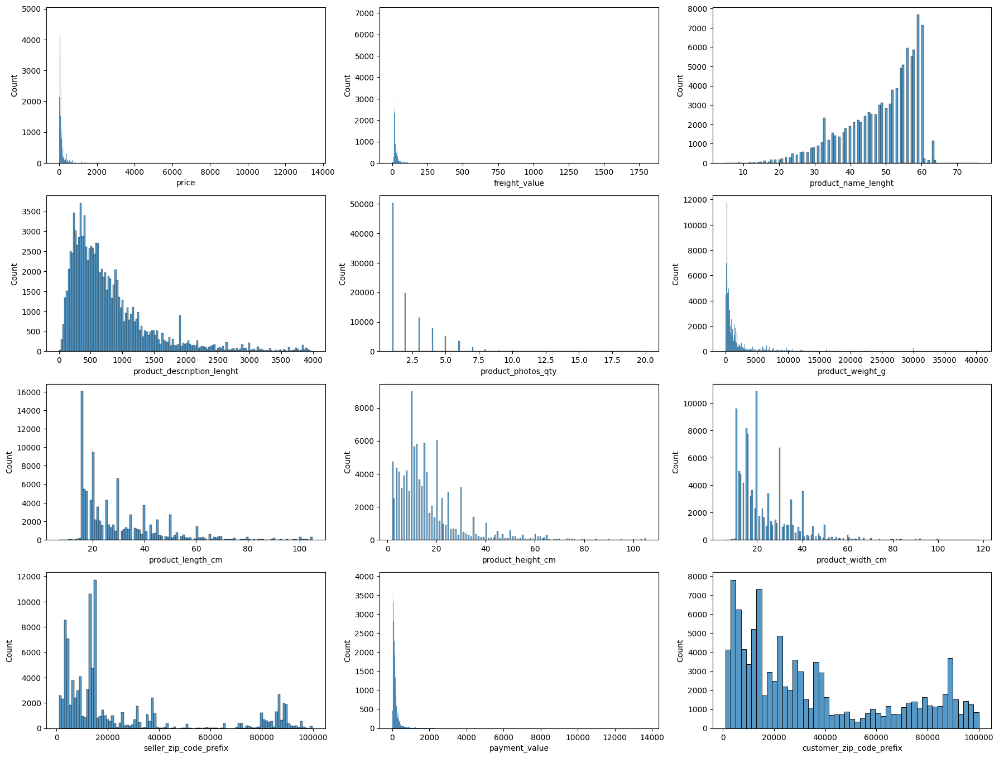

In [ ]:
plt.figure(figsize = (18,20))

Pos = 1
for i in NumbersOnly.columns:
    plt.subplot(6,3,Pos)
    sns.histplot(NumbersOnly[i])
    Pos = Pos + 1
    plt.tight_layout()

We believe that `seller_zip_code_prefix` can be easier analyzed as numerical data given Brazil's postal code system [as described here](https://en.wikipedia.org/wiki/Código_de_Endereçamento_Postal), hence why it is among the histplots in this result.

Observation
1. The low price and payment value suggest that the products being sold are generally affordable.
2. The number of installments tends to be low, which may indicate that most customers prefer full payment or a small number of installments.
3. The review score, dominated by high ratings, indicates overall high customer satisfaction.
4. The distribution of product sizes shows medium to small dimensions, which are common in e-commerce shipping.

It's quite clear from the histogram distributions alone that none of these numerical data values are normally distributed, so we will use the spearman methodology when checking correlation.

#### Checking for Outliers

We will first try visualizing with boxplots

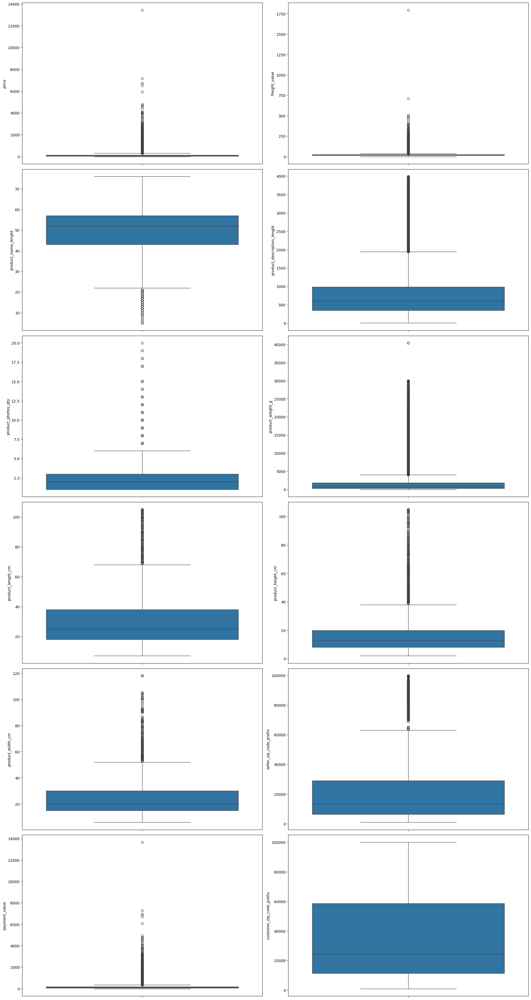

In [ ]:
plt.figure(figsize = (20,50))

Pos = 1
for i in NumbersOnly.columns:
    plt.subplot(8,2,Pos)
    sns.boxplot(NumbersOnly[i])
    Pos = Pos + 1
    plt.tight_layout()

There are several extreme outliers on some of the columns, namely on price, product weight, product width, payment value and freight value. We will check them one by one.

In [ ]:
df.sort_values(by = 'price', ascending = False)[['price', 'seller_city', 'seller_state']].head(5)

,price,seller_city,seller_state
28424,13440.0,sao paulo,SP
92230,7160.0,sao paulo,SP
2084,6735.0,sao paulo,SP
94848,6729.0,londrina,PR
11276,6499.0,goiania,GO


In [ ]:
df.sort_values(by = 'payment_value', ascending = False)[['payment_value', 'seller_city', 'seller_state']].head(5)

,payment_value,seller_city,seller_state
28424,13664.08,sao paulo,SP
92230,7274.88,sao paulo,SP
2084,6929.31,sao paulo,SP
94848,6922.21,londrina,PR
11276,6726.66,goiania,GO


For the sake of getting another perspective on finding outliers, we will also try using the IQR method.

In [ ]:
OutliersList = []
for i in NumbersOnly.columns:
    Q3 = NumbersOnly.describe()[i]['75%']
    Q1 = NumbersOnly.describe()[i]['25%']
    IQR = Q3 - Q1
    Bounds = 1.5 * IQR
    UpperBound = Q3 + Bounds
    LowerBound = Q1 - Bounds

    Outliers = len(NumbersOnly[(NumbersOnly[i] > UpperBound) | (NumbersOnly[i] < LowerBound)])
    OutliersList.append(Outliers)

pd.DataFrame({'columns': NumbersOnly.columns,'total outliers': OutliersList})

,columns,total outliers
0,price,7617
1,freight_value,10437
2,product_name_lenght,1089
3,product_description_lenght,6295
4,product_photos_qty,2947
5,product_weight_g,14453
6,product_length_cm,3284
7,product_height_cm,6819
8,product_width_cm,2367
9,seller_zip_code_prefix,15848


Using the IQR method seems to target a far larger amount of entries as outliers than if we analyzed the entries using boxplots, and so the IQR method of finding outliers will not be taken.

### Categorical Data

We will still describe the categorical data and use barplots.

In [ ]:
CategoricalOnly = df.drop(columns = ['order_id', 'customer_id', 'product_id', 'seller_id', 'customer_unique_id', 'product_category_name']).select_dtypes(include = 'object')
CategoricalOnly.describe()

,order_status,product_category_name_english,seller_city,seller_state,customer_city,customer_state
count,103200,100943,102425,102425,103200,103200
unique,8,71,611,23,4119,27
top,delivered,bed_bath_table,sao paulo,SP,sao paulo,SP
freq,100196,10160,25249,72818,16214,43423


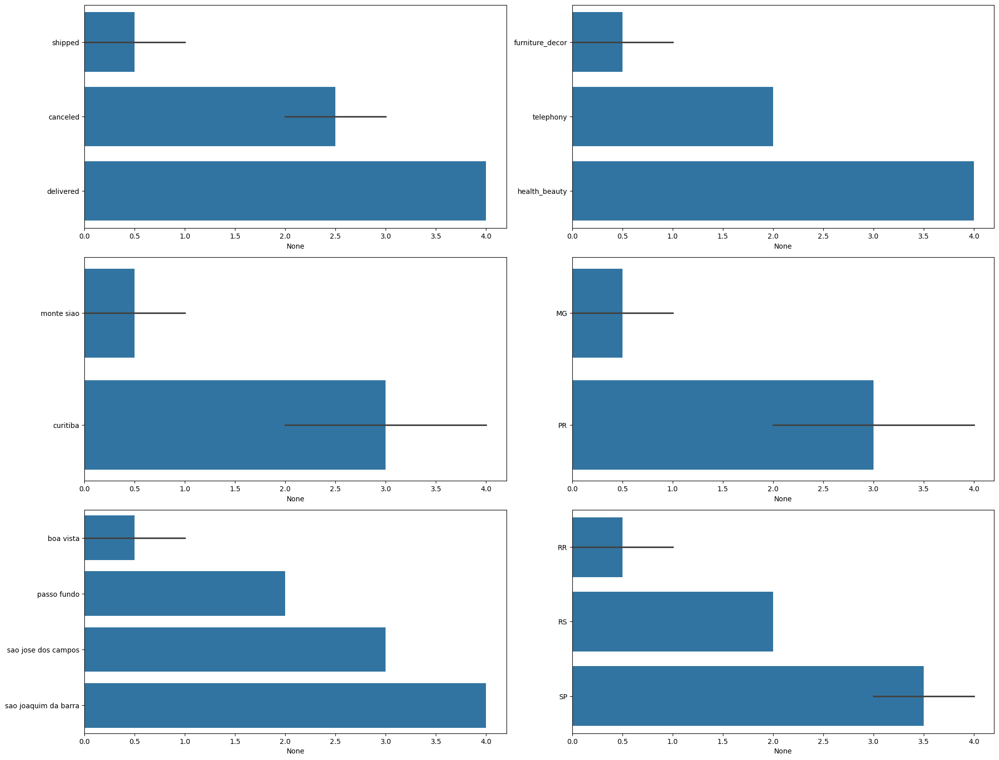

In [ ]:
plt.figure(figsize = (20,50))

Pos = 1
for i in CategoricalOnly.columns:
    plt.subplot(10,2,Pos)
    sns.barplot(x=CategoricalOnly[i].head(5).index, y=CategoricalOnly[i].head(5).values)
    Pos = Pos + 1
    plt.tight_layout()

# Data Cleaning Phase

##Dealing with NaNs

###Dropping unneeded columns

Columns related to product dimensions will be deleted - we don't plan to examine the products to that extreme.

In [ ]:
dfcleaned = df.drop(columns = ['product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm', 'product_name_lenght', 'product_description_lenght', 'product_photos_qty'])

###Dropping 'Cancelled' and 'Unavailable' Orders

We're concerned only with the transactions that are either underway or complete, so these orders will be deleted.

In [ ]:
dfcleaned.drop(dfcleaned[dfcleaned['order_status'] == 'canceled'].index, inplace=True)
dfcleaned.drop(dfcleaned[dfcleaned['order_status'] == 'unavailable'].index, inplace=True)

### Translating untranslated product categories

Some of the categories listed here are not yet in English. We will find them and translate them.

In [ ]:
dfcleaned[dfcleaned['product_category_name_english'].isna()][['product_category_name','product_category_name_english']]

,product_category_name,product_category_name_english
14,NaN,NaN
83,NaN,NaN
102,NaN,NaN
126,NaN,NaN
271,NaN,NaN
...,...,...
101995,NaN,NaN
102610,NaN,NaN
103036,NaN,NaN
103064,portateis_cozinha_e_preparadores_de_alimentos,NaN


Translations:
- portateis_cozinha_e_preparadores_de_alimentos	= portable_kitchen_and_food_preparators
- pc_gamer = pc_gamer

In [ ]:
dfcleaned.loc[dfcleaned['product_category_name'] == 'portateis_cozinha_e_preparadores_de_alimentos', 'product_category_name_english'] = 'portable_kitchen_and_food_preparators'
dfcleaned.loc[dfcleaned['product_category_name'] == 'pc_gamer', 'product_category_name_english'] = 'pc_gamer'

In [ ]:
NaNPerColumn = pd.DataFrame({'NaNs':dfcleaned.isnull().sum().sort_values(ascending = False)})
NaNPerColumn['% of Total'] = ((NaNPerColumn['NaNs']/dfcleaned.shape[0])*100).round(3).astype(str)+'%'
NaNPerColumn = NaNPerColumn[NaNPerColumn['NaNs'] != 0]
NaNPerColumn

,NaNs,% of Total
order_delivered_customer_date,1773,1.739%
product_category_name,1454,1.426%
product_category_name_english,1454,1.426%
order_delivered_carrier_date,639,0.627%
order_approved_at,19,0.019%
freight_value,8,0.008%
seller_state,8,0.008%
seller_id,8,0.008%
product_id,8,0.008%
price,8,0.008%


### Filling delivery date NaNs

In [ ]:
#Filling all NaN customer delivery date with date placeholder

DateHolder = pd.to_datetime('2000/11/11', format = '%Y/%m/%d')
dfcleaned['order_delivered_customer_date'].fillna(DateHolder, inplace=True)
dfcleaned['order_delivered_carrier_date'].fillna(DateHolder, inplace=True)
dfcleaned['order_approved_at'].fillna(DateHolder, inplace=True)
#dfcleaned.method({'order_delivered_customer_date': DateHolder}, inplace=True)
#dfcleaned.method({'order_delivered_carrier_date': DateHolder}, inplace=True)
#dfcleaned.method({'order_approved_at': DateHolder}, inplace=True)

<ipython-input-60-70781f3757c6>:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  dfcleaned['order_delivered_customer_date'].fillna(DateHolder, inplace=True)
<ipython-input-60-70781f3757c6>:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(valu

### Modifying entries with no product info

Because there are some entries where there is absolutely no product info except for `order_id` and `customer_id`, their NaNs will be added with the placeholder 'unknown', given our focus on putting things in the perspective of sellers.

In [ ]:
NaNPerColumn = pd.DataFrame({'NaNs':dfcleaned.isnull().sum().sort_values(ascending = False)})
NaNPerColumn['% of Total'] = ((NaNPerColumn['NaNs']/dfcleaned.shape[0])*100).round(3).astype(str)+'%'
NaNPerColumn = NaNPerColumn[NaNPerColumn['NaNs'] != 0]
NaNPerColumn

,NaNs,% of Total
product_category_name_english,1454,1.426%
product_category_name,1454,1.426%
freight_value,8,0.008%
seller_state,8,0.008%
seller_city,8,0.008%
seller_id,8,0.008%
product_id,8,0.008%
price,8,0.008%
seller_zip_code_prefix,8,0.008%
payment_value,1,0.001%


There are 8 rows where only order id and payment value exist, and one where there is no payment value. They will be deleted since they only present a small fraction of the data.

In [ ]:
dfcleaned.dropna(subset=['seller_id'], inplace=True)

In [ ]:
dfcleaned.dropna(subset=['payment_value'], inplace=True)

And now to fill the category name NaNs with the placeholder 'unknown'

In [ ]:
dfcleaned['product_category_name_english'].fillna('unknown', inplace=True)
dfcleaned['product_category_name'].fillna('unknown', inplace=True)

<ipython-input-64-614bcbacaaae>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  dfcleaned['product_category_name_english'].fillna('unknown', inplace=True)
<ipython-input-64-614bcbacaaae>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value

In [ ]:
NaNPerColumn = pd.DataFrame({'NaNs':dfcleaned.isnull().sum().sort_values(ascending = False)})
NaNPerColumn['% of Total'] = ((NaNPerColumn['NaNs']/dfcleaned.shape[0])*100).round(3).astype(str)+'%'
NaNPerColumn = NaNPerColumn[NaNPerColumn['NaNs'] != 0]
NaNPerColumn

,NaNs,% of Total


##Dealing with Outliers

We will check the outliers using boxplot below.

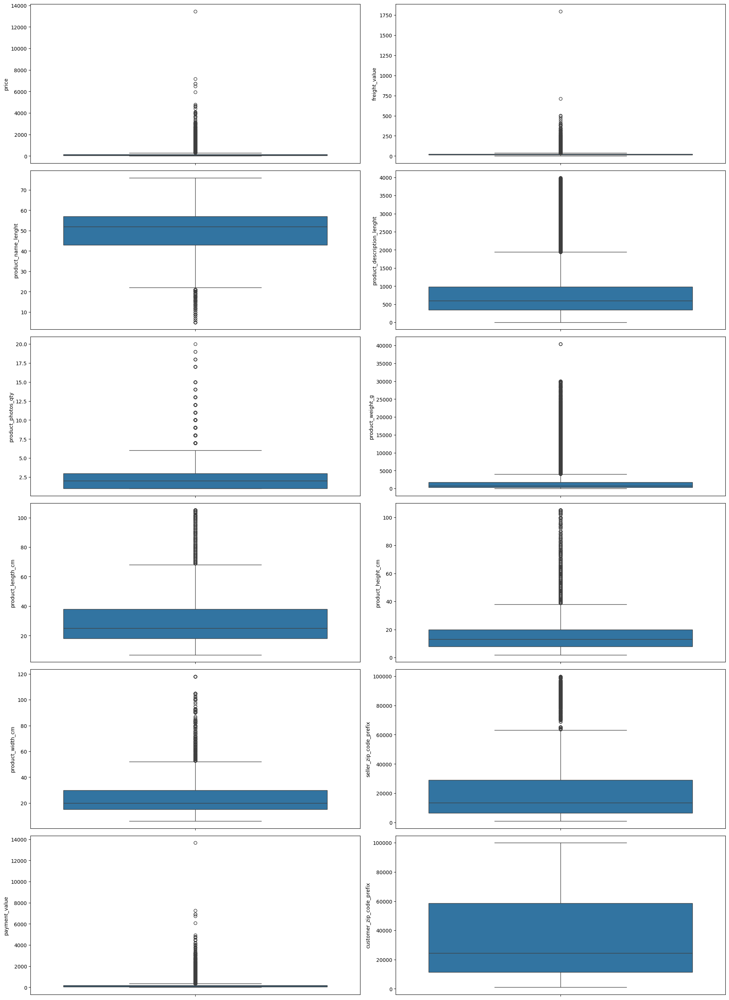

In [ ]:
plt.figure(figsize = (20,50))

Pos = 1
for i in NumbersOnly.columns:
    plt.subplot(11,2,Pos)
    sns.boxplot(NumbersOnly[i])
    Pos = Pos + 1
    plt.tight_layout()

We found that `freight_value`, `payment_value` and `price` have extreme outliers which should be investigated further.

In [ ]:
# List of columns to display top 10 values
columns_to_display = ['freight_value', 'price', 'payment_value']

# Create a dictionary to store the data for each column
summary_data = {}

for col in columns_to_display:
    # Get the top 10 values along with the corresponding product category names in English
    top_10 = dfcleaned.nlargest(10, col)[[col, 'product_category_name_english']]

    # Create lists of top 10 values and their corresponding product category names
    value_list = top_10[col].tolist()
    category_list = top_10['product_category_name_english'].tolist()

    # Store in the dictionary
    summary_data[f'{col} Values'] = value_list
    summary_data[f'{col} Categories'] = category_list

# Convert the dictionary into a DataFrame
summary_df = pd.DataFrame(summary_data)
summary_df

,freight_value Values,freight_value Categories,price Values,price Categories,payment_value Values,payment_value Categories
0,1794.96,signaling_and_security,13440.00,fixed_telephony,13664.08,fixed_telephony
1,711.33,furniture_living_room,7160.00,fixed_telephony,7274.88,fixed_telephony
2,502.98,furniture_decor,6735.00,housewares,6929.31,housewares
3,497.08,health_beauty,6729.00,computers,6922.21,computers
4,479.28,office_furniture,6499.00,art,6726.66,art
5,458.73,housewares,5934.60,agro_industry_and_commerce,6081.54,agro_industry_and_commerce
6,436.24,sports_leisure,4799.00,small_appliances,4950.34,small_appliances
7,409.68,baby,4690.00,small_appliances,4764.34,small_appliances
8,401.58,office_furniture,4590.00,computers,4681.78,computers
9,401.55,office_furniture,4399.87,musical_instruments,4513.32,musical_instruments


Based on our observations of the real-world data (using Amazon Brazil as a comparison), we can conclude that the top 10 highest values from the outliers are considered normal, and these are actual goods that will be sold. For example, we found a laptop priced at 6,729 and a baby chair with an expensive freight value due to its dimensions.

Therefore, we decided to keep the data as they have a clear and real basis.

# Feature Engineering

## Adding Pricing and Transaction Time Column

A calculation of the Ratio of Freight-to-Price will be useful in finding out how expensive Olist's delivery services are for their sellers.

In [ ]:
# Freight-to-Price ratio
dfcleaned['Ratio Freight-to-Price'] =  ((dfcleaned['freight_value']/dfcleaned['price'])*100).round(2)

Calculating the High Payment Flag can provide valuable insights for further analysis, particularly in identifying and classifying higher-end products.

In [ ]:
# High Payment Flag

# Calculate the median payment value
median_payment_value = dfcleaned['payment_value'].median()

# Add a new column 'High Payment Flag' as 1 for high payment and 0 for low payment
dfcleaned['High Payment Flag'] = dfcleaned['payment_value'].apply(lambda x: 1 if x > median_payment_value else 0)


## Segmenting Order Purchase Dates

By compartmentalizing the dates into boxes like this, we can easier check sellers' behavior per unit of time when needed.

In [ ]:
# Extract hour, weekday, month, and quarter from the timestamp
dfcleaned['order_hour'] = dfcleaned['order_purchase_timestamp'].dt.hour
dfcleaned['order_weekdays'] = dfcleaned['order_purchase_timestamp'].dt.day_name()
dfcleaned['order_month'] = dfcleaned['order_purchase_timestamp'].dt.month
dfcleaned['order_quarter'] = dfcleaned['order_purchase_timestamp'].dt.quarter

# Function to categorize time of day
def categorize_time_of_day(hour):
    if 5 <= hour < 12:
        return 1  # Morning
    elif 12 <= hour < 17:
        return 2  # Afternoon
    elif 17 <= hour < 21:
        return 3  # Evening
    else:
        return 4  # Night

# Apply function to create the 'time_of_day' column as numeric
dfcleaned['time_of_day'] = dfcleaned['order_hour'].apply(categorize_time_of_day)


<ipython-input-71-d6c055bc25e3>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=dfcleaned, x='time_of_day', palette="Set2")
<ipython-input-71-d6c055bc25e3>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=dfcleaned, x='order_hour', palette="Set2")
<ipython-input-71-d6c055bc25e3>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=dfcleaned, x='order_weekdays', palette="Set2", order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
<ipython-input-71-d6c055bc25e3>:25: FutureWarning: 

Passing 

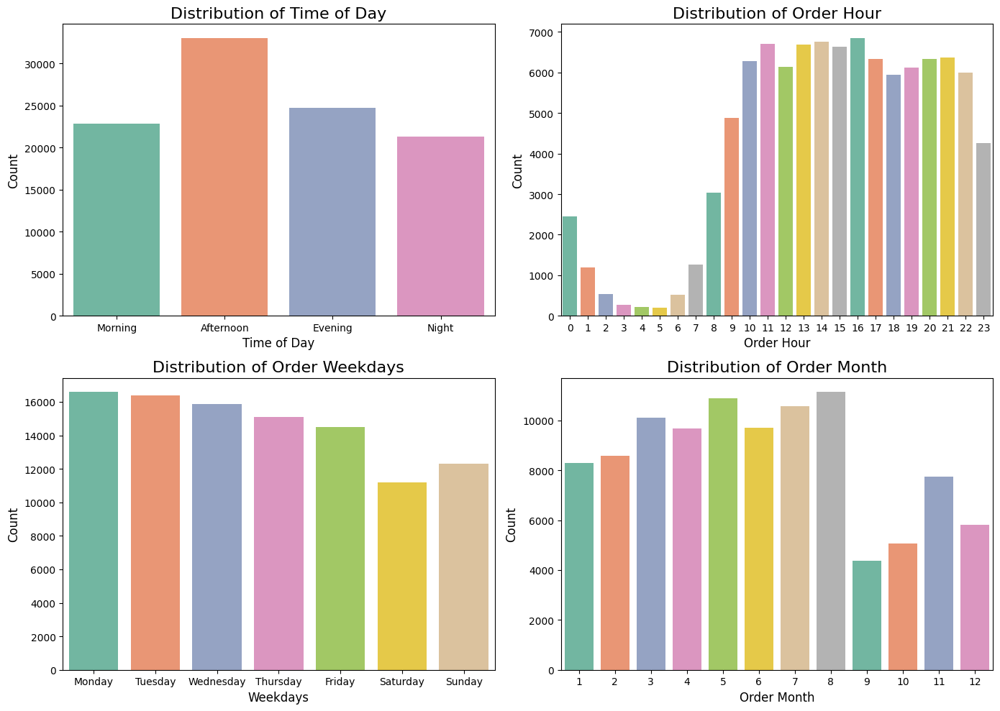

In [ ]:
# Set the figure size
plt.figure(figsize=(14, 10))

# Create subplots to show multiple visualizations
plt.subplot(2, 2, 1)
sns.countplot(data=dfcleaned, x='time_of_day', palette="Set2")
plt.title('Distribution of Time of Day', fontsize=16)
plt.xlabel('Time of Day', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks([0, 1, 2, 3], ['Morning', 'Afternoon', 'Evening', 'Night'])

plt.subplot(2, 2, 2)
sns.countplot(data=dfcleaned, x='order_hour', palette="Set2")
plt.title('Distribution of Order Hour', fontsize=16)
plt.xlabel('Order Hour', fontsize=12)
plt.ylabel('Count', fontsize=12)

plt.subplot(2, 2, 3)
sns.countplot(data=dfcleaned, x='order_weekdays', palette="Set2", order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.title('Distribution of Order Weekdays', fontsize=16)
plt.xlabel('Weekdays', fontsize=12)
plt.ylabel('Count', fontsize=12)

plt.subplot(2, 2, 4)
sns.countplot(data=dfcleaned, x='order_month', palette="Set2")
plt.title('Distribution of Order Month', fontsize=16)
plt.xlabel('Order Month', fontsize=12)
plt.ylabel('Count', fontsize=12)

plt.tight_layout()
plt.show()


**Observation**

As shown in the graphs above, most goods are purchased in the afternoon, with the majority of transactions occurring during the second quarter of the year.

## Adding 'Order Value per Product'

By adding this column, we hope to simplify our calculations by pre-emptively adding `price` and `freight_value` together, as we believe that it is something that we will frequently do in this notebook.

In [ ]:
dfcleaned['Order Value per Product'] = dfcleaned['price'] + dfcleaned['freight_value']

In [ ]:
dfcleaned['Order Value per Product'].sum()

15735383.569999997

## Adding Delivery Lateness Column

We are adding this column for the same reason as above: To simplify our calculations in terms of delivery dates, as well as to provide a category for when deliveries were late, expanding possibilities of analysis.

In [ ]:

dfcleaned['order_delivered_customer_date'] = pd.to_datetime(dfcleaned['order_delivered_customer_date'])
dfcleaned['order_estimated_delivery_date'] = pd.to_datetime(dfcleaned['order_estimated_delivery_date'])


dfcleaned['is_delivery_late'] = 'Unknown'  # Initialize with 'Unknown'


dfcleaned.loc[
    (dfcleaned['order_delivered_customer_date'].notna()) &
    (dfcleaned['order_delivered_customer_date'] != pd.to_datetime('2000-11-11')) &
    (dfcleaned['order_delivered_customer_date'] > dfcleaned['order_estimated_delivery_date']),
    'is_delivery_late'
] = 'Late'

dfcleaned.loc[
    (dfcleaned['order_delivered_customer_date'].notna()) &
    (dfcleaned['order_delivered_customer_date'] != pd.to_datetime('2000-11-11')) &
    (dfcleaned['order_delivered_customer_date'] <= dfcleaned['order_estimated_delivery_date']),
    'is_delivery_late'
] = 'On Time'


dfcleaned[['order_id', 'order_delivered_customer_date', 'order_estimated_delivery_date', 'is_delivery_late']].head(5)

,order_id,order_delivered_customer_date,order_estimated_delivery_date,is_delivery_late
0,2e7a8482f6fb09756ca50c10d7bfc047,2000-11-11 00:00:00,2016-10-20,Unknown
1,2e7a8482f6fb09756ca50c10d7bfc047,2000-11-11 00:00:00,2016-10-20,Unknown
6,3b697a20d9e427646d92567910af6d57,2016-10-26 14:02:13,2016-10-27,On Time
7,be5bc2f0da14d8071e2d45451ad119d9,2016-10-27 18:19:38,2016-11-07,On Time
9,a41c8759fbe7aab36ea07e038b2d4465,2016-11-03 10:58:07,2016-11-29,On Time


# Cohort Analysis

The main piece of analysis when analyzing retention rates and other related metrics is to check its cohort analysis first.

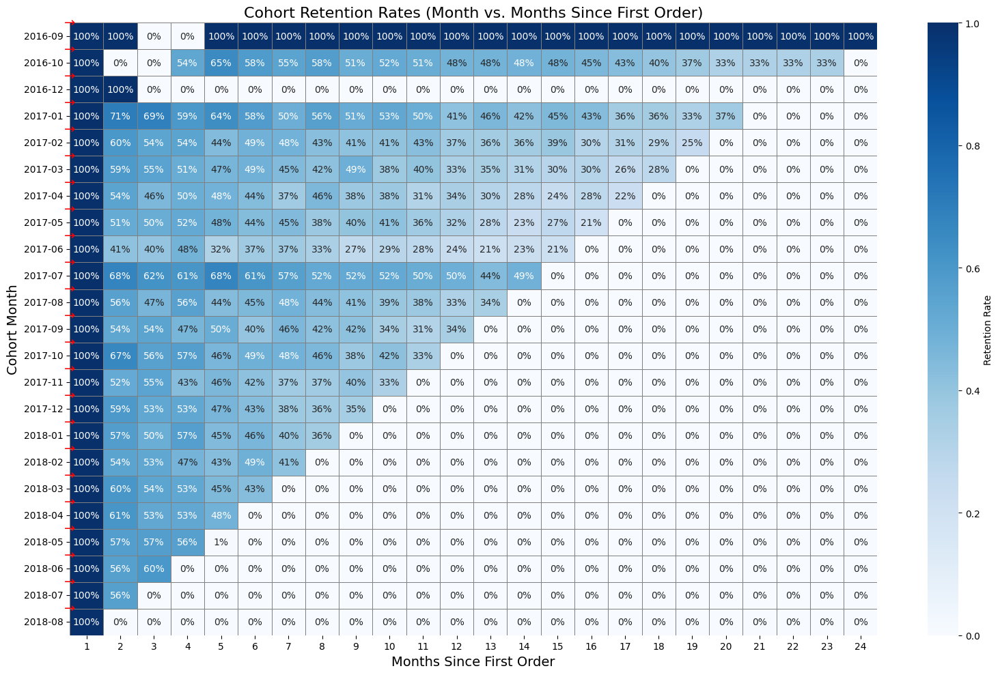

In [ ]:
# Ensure 'order_purchase_timestamp' is in datetime format
dfcleaned['order_purchase_timestamp'] = pd.to_datetime(dfcleaned['order_purchase_timestamp'], errors='coerce')

# Step 1: Create cohort month (based on the first purchase month of each seller)
dfcleaned['cohort_month'] = dfcleaned.groupby('seller_id')['order_purchase_timestamp'].transform('min').dt.to_period('M')

# Step 2: Create order month (based on each purchase month)
dfcleaned['order_month'] = dfcleaned['order_purchase_timestamp'].dt.to_period('M')

# Step 3: Calculate cohort index (number of months since the first purchase)
dfcleaned['cohort_index'] = (
    (dfcleaned['order_month'].dt.year - dfcleaned['cohort_month'].dt.year) * 12 +
    (dfcleaned['order_month'].dt.month - dfcleaned['cohort_month'].dt.month) + 1
)

# Step 4: Calculate the number of unique sellers per cohort and cohort index (month)
cohort_data = dfcleaned.groupby(['cohort_month', 'cohort_index'])['seller_id'].nunique().reset_index()

# Step 5: Pivot the data to create a cohort retention matrix
cohort_pivot = cohort_data.pivot(index='cohort_month', columns='cohort_index', values='seller_id')

# Step 6: Fill NaN values in the pivot table with 0 (assumes no sellers in that cohort month)
cohort_pivot.fillna(0, inplace=True)

# Step 7: Calculate retention by dividing each cohort's seller count by the first month's seller count
cohort_retention = cohort_pivot.divide(cohort_pivot[1], axis=0)

# Step 8: Enlarge the figure and set up the plot
plt.figure(figsize=(16, 10))

# Plotting the cohort retention heatmap
ax = sns.heatmap(
    cohort_retention, annot=True, fmt='.0%', cmap='Blues',
    cbar_kws={'label': 'Retention Rate'}, linewidths=0.5, linecolor='gray'
)

# Add title and labels
plt.title('Cohort Retention Rates (Month vs. Months Since First Order)', fontsize=16)
plt.xlabel('Months Since First Order', fontsize=14)
plt.ylabel('Cohort Month', fontsize=14)

# Highlight the trend for the first cohort month
for i in range(cohort_retention.shape[0]):
    ax.text(0, i, '→', color='red', fontsize=14, ha='center', va='center')

# Display the plot
plt.tight_layout()
plt.show()

**Observation**

From the cohort analysis above, we can conclude that sellers tend to have fewer transactions each month since their first use of the application, indicating that the application has lost retention rate over time, as depicted by the light blue color gradually fading over time.

- In "2017-07" Olist has retention of 68% in Month 1 and 50% in Month 12, indicating higher engagement or better customer targeting during this period
- Retention rates for newer cohorts 2018-01 drop rapidly within a few months, potentially due to Lack of loyalty-building strategies, differences in seller behavior, and lower-quality acquisition channels
- Many cohorts stabilize at retention rates of around 20-40%

As the retention rate trend is declining, we need to further investigate sellers' behavior. We will use the Recency, Frequency, and Monetary (RFM) method to analyze how sellers use Olist. Additionally, we will cluster the sellers based on RFM scores to identify groups that require more attention.

We will perform RFM clustering using both manual methods and machine learning techniques, such as K-Means and DBSCAN.

In [ ]:
dfcleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 101952 entries, 0 to 103180
Data columns (total 33 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_id                       101952 non-null  object        
 1   customer_id                    101952 non-null  object        
 2   order_status                   101952 non-null  object        
 3   order_purchase_timestamp       101952 non-null  datetime64[ns]
 4   order_approved_at              101952 non-null  datetime64[ns]
 5   order_delivered_carrier_date   101952 non-null  datetime64[ns]
 6   order_delivered_customer_date  101952 non-null  datetime64[ns]
 7   order_estimated_delivery_date  101952 non-null  datetime64[ns]
 8   seller_id                      101952 non-null  object        
 9   product_id                     101952 non-null  object        
 10  price                          101952 non-null  float64       
 11  freig

# RFM Analysis

We will determine these values for each seller in `dfcleaned` as preparation for their processing by our chosen ML model. The individual components of their RFM scores and values could also be manually used in further analyses of these sellers.

## Recency

In [ ]:
# Convert 'order_approved_at' to datetime with error handling
dfcleaned['order_approved_at'] = pd.to_datetime(dfcleaned['order_approved_at'], errors='coerce')

# Step 1: Group by 'seller_id' and get the last purchase date
Recency = dfcleaned.groupby(by='seller_id', as_index=False)['order_approved_at'].max()
Recency.columns = ['Seller ID', 'Last Purchase Date']

# Step 2: Calculate the reference date (most recent purchase date)
RecentDate = Recency['Last Purchase Date'].max()

# Step 3: Calculate Recency (days since the last purchase)
Recency['Recency'] = (RecentDate - Recency['Last Purchase Date']).dt.days

1. Indicates how long it has been since the seller last made a transaction from our company.
2. The higher the R value, the longer (older) it has been since the last transaction.
3. The lower the R value, the more recent the transaction (this is the desired outcome).

## Frequency (per Month)

We have concerns of using the original definition of frequency due to the time-sensitive nature of the dataframe. This is not fair for new sellers who are prolific but got into Olist late, and there are old sellers that have been off for a long time and yet are still part of higher clusters simply due to their high frequency. As such, the team have decided to use the average frequency of orders involved per month.

In [ ]:
# Convert 'order_approved_at' to datetime
#dfcleaned['order_approved_at'] = pd.to_datetime(dfcleaned['order_approved_at'], errors='coerce')

# Step 1: Calculate the active period in months for each seller
seller_activity = dfcleaned.groupby('seller_id').agg(
    FirstPurchase=('order_approved_at', 'min'),
    LastPurchase=('order_approved_at', 'max')
).reset_index()
seller_activity['ActivePeriodMonths'] = (
    (seller_activity['LastPurchase'].dt.to_period('M') - seller_activity['FirstPurchase'].dt.to_period('M')).apply(lambda x: x.n + 1)
)

# Step 2: Calculate raw frequency (number of unique transactions per seller)
Frequency = dfcleaned.groupby('seller_id')['order_id'].nunique().reset_index()
Frequency.columns = ['Seller ID', 'RawFrequency']

# Step 3: Normalize frequency by active period
Frequency = Frequency.merge(seller_activity[['seller_id', 'ActivePeriodMonths']],
                            left_on='Seller ID', right_on='seller_id', how='left')
Frequency['Frequency'] = Frequency['RawFrequency'] / Frequency['ActivePeriodMonths']

# Step 4: Drop unnecessary columns and prepare final frequency data
Frequency = Frequency[['Seller ID', 'Frequency']]

# Step 5: Combine with Recency
RF = Frequency.join(Recency.set_index('Seller ID'), on='Seller ID', how='outer')

# Display the result
RF.head()


,Seller ID,Frequency,Last Purchase Date,Recency
0,0015a82c2db000af6aaaf3ae2ecb0532,1.500000,2017-10-18 23:56:20,319
1,001cca7ae9ae17fb1caed9dfb1094831,11.111111,2018-07-12 21:50:17,52
2,002100f778ceb8431b7a1020ff7ab48f,6.375000,2018-04-12 13:11:45,144
3,003554e2dce176b5555353e4f3555ac8,1.000000,2017-12-15 07:11:03,262
4,004c9cd9d87a3c30c522c48c4fc07416,0.748815,2018-05-05 10:15:17,121


1. Refers to how many products the seller has sold.
2. The higher the F value, the more frequently the seller sells products (this is the desired outcome).

Since the data provides details for each order_id, and each order_id may be served by multiple seller_ids, we decided to calculate the frequency using the unique order_ids handled by each seller_id. This approach allows us to capture the actual frequency of orders served by each seller.

## Monetary Value

In [ ]:
Monetary = dfcleaned.groupby(by='seller_id', as_index=False)['Order Value per Product'].sum() #default value is .sum(), but if we want to analyze differently, we can use .mean()
Monetary.columns = ['Seller ID', 'Total Monetary Value']
Monetary.head()

,Seller ID,Total Monetary Value
0,0015a82c2db000af6aaaf3ae2ecb0532,2748.06
1,001cca7ae9ae17fb1caed9dfb1094831,33934.17
2,002100f778ceb8431b7a1020ff7ab48f,2028.16
3,003554e2dce176b5555353e4f3555ac8,139.38
4,004c9cd9d87a3c30c522c48c4fc07416,23263.94


Monetary refers to the Order Value per Product by the seller on transactions.
The higher the M value, the larger the total transactions amount (this is the desired outcome).

In [ ]:
CompleteRFM = Monetary.join(RF.set_index('Seller ID'), on='Seller ID', how='outer')
CompleteRFM.head(5)

,Seller ID,Total Monetary Value,Frequency,Last Purchase Date,Recency
0,0015a82c2db000af6aaaf3ae2ecb0532,2748.06,1.500000,2017-10-18 23:56:20,319
1,001cca7ae9ae17fb1caed9dfb1094831,33934.17,11.111111,2018-07-12 21:50:17,52
2,002100f778ceb8431b7a1020ff7ab48f,2028.16,6.375000,2018-04-12 13:11:45,144
3,003554e2dce176b5555353e4f3555ac8,139.38,1.000000,2017-12-15 07:11:03,262
4,004c9cd9d87a3c30c522c48c4fc07416,23263.94,0.748815,2018-05-05 10:15:17,121


In [ ]:
CompleteRFM['Total Monetary Value'].sum()

15735383.57

## Describe RFM

In [ ]:
CompleteRFM[['Recency','Frequency','Total Monetary Value']].describe()

,Recency,Frequency,Total Monetary Value
count,3053.00000,3053.000000,3053.000000
mean,139.98133,3.278168,5154.072575
std,167.41923,6.739968,15973.934394
min,0.00000,0.029851,12.220000
25%,17.00000,1.000000,277.220000
50%,50.00000,1.500000,1013.590000
75%,221.00000,3.000000,4058.110000
max,697.00000,97.210526,249393.440000


Please refer to section below for complete explanation of data distribution.

## Histogram RFM

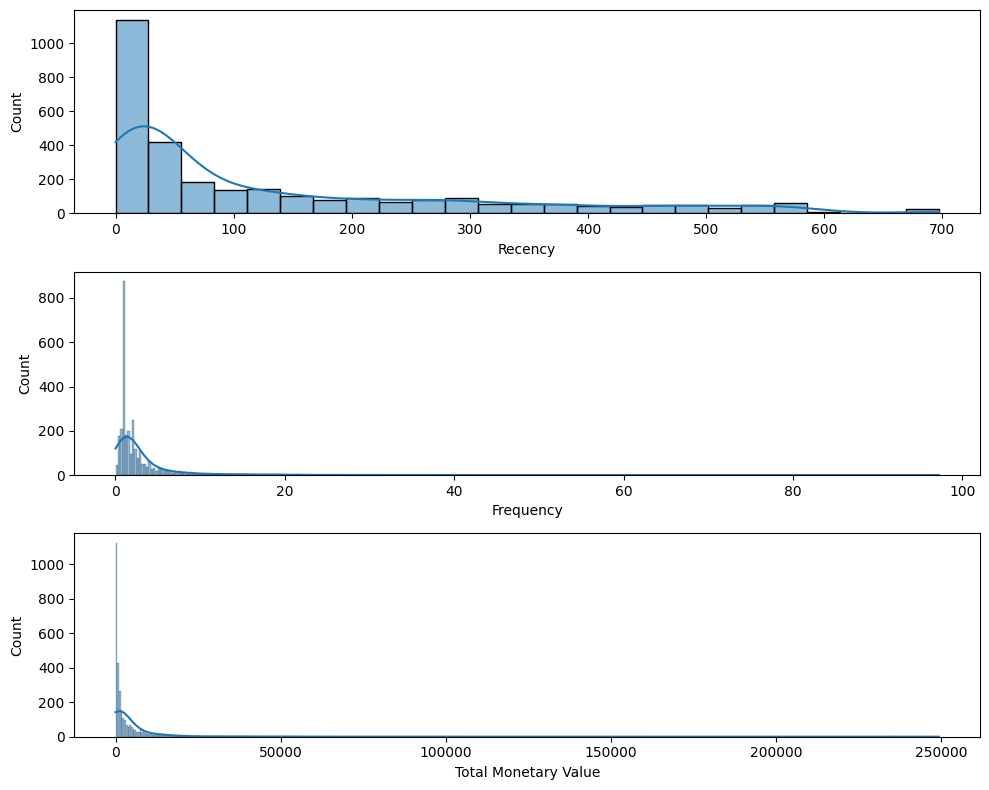

In [ ]:
plt.figure(figsize = (10,8))
plt.subplot(3,1,1)
sns.histplot(CompleteRFM['Recency'], kde = True)
plt.subplot(3,1,2)
sns.histplot(CompleteRFM['Frequency'], kde = True)
plt.subplot(3,1,3)
sns.histplot(CompleteRFM['Total Monetary Value'], kde = True)
plt.tight_layout()
plt.show()

*   Recency:

Many sellers have not made any transactions for a long time (more than 100 days or 3 months), with median of 50 days.

*   Frequency:

Many sellers have made fewer than 500 transactions, with median of 7 transactions.

*   Monetary:

Monetary value has median of 1,013.59

## Boxplot RFM

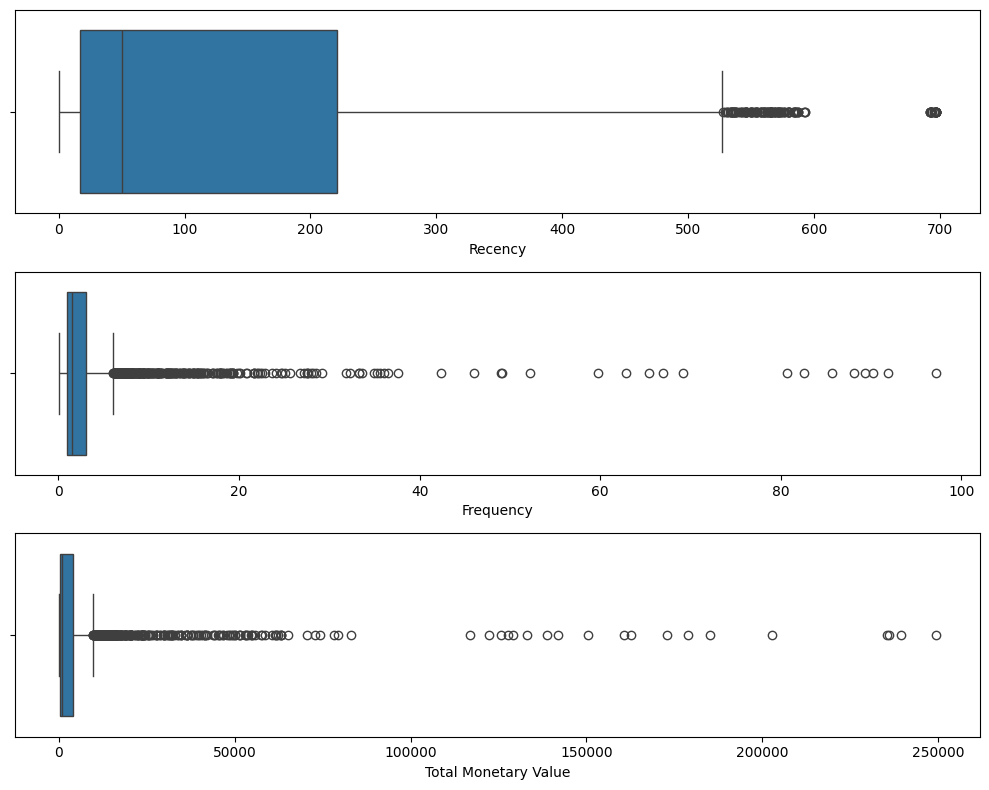

In [ ]:
plt.figure(figsize = (10,8))
plt.subplot(3,1,1)
sns.boxplot(x= CompleteRFM['Recency'])
plt.subplot(3,1,2)
sns.boxplot(x = CompleteRFM['Frequency'])
plt.subplot(3,1,3)
sns.boxplot(x = CompleteRFM['Total Monetary Value'])
plt.tight_layout()
plt.show()

## Data Cleaning RFM

We will check if there is any zero value of Order Value per Product.

In [ ]:
total_payment_value_per_seller = dfcleaned.groupby('seller_id').agg({'Order Value per Product': 'sum'}).reset_index()
total_payment_value_per_seller.tail(5)

,seller_id,Order Value per Product
3048,ffc470761de7d0232558ba5e786e57b7,2087.13
3049,ffdd9f82b9a447f6f8d4b91554cc7dd3,2828.66
3050,ffeee66ac5d5a62fe688b9d26f83f534,2259.55
3051,fffd5413c0700ac820c7069d66d98c89,11762.27
3052,ffff564a4f9085cd26170f4732393726,1096.55


No sellers with 0 Order Value per Product

## RFM Score

In [ ]:
# Drop 'Last Purchase Date' column before calling describe()
CompleteRFM.drop(columns=['Last Purchase Date'], inplace=True)

# Now, describe the remaining columns
CompleteRFM.describe()

,Total Monetary Value,Frequency,Recency
count,3053.000000,3053.000000,3053.00000
mean,5154.072575,3.278168,139.98133
std,15973.934394,6.739968,167.41923
min,12.220000,0.029851,0.00000
25%,277.220000,1.000000,17.00000
50%,1013.590000,1.500000,50.00000
75%,4058.110000,3.000000,221.00000
max,249393.440000,97.210526,697.00000


In [ ]:
def rfm_score(row):
    # Recency
    # The seller with the highest recency value is the one who has completed the most recent transaction, while the lowest recency value indicates the seller who has not completed a transaction for the longest time.
    if row['Recency'] <= 17:
        r = 4
    elif (row['Recency'] > 17) and (row['Recency'] <= 50):
        r = 3
    elif (row['Recency'] > 50) and (row['Recency'] <= 221):
        r = 2
    else:
        r = 1

    # Frequency
    # The seller with the smallest frequency value has the fewest number of transactions, while the highest frequency value indicates the seller with the most transactions.
    if row['Frequency'] <= 2:
        f = 1
    elif (row['Frequency'] > 2) and (row['Frequency'] <= 7):
        f = 2
    elif (row['Frequency'] > 7) and (row['Frequency'] <= 22):
        f = 3
    else:
        f = 4

    # Monetary
    # The seller with the smallest monetary value has the lowest total payment received from customers, while the highest monetary value indicates the seller with the highest total payment received from customers.
    if row['Total Monetary Value'] <= 277:
        m = 1
    elif (row['Total Monetary Value'] > 277) and (row['Total Monetary Value'] <= 1013):
        m = 2
    elif (row['Total Monetary Value'] > 1013) and (row['Total Monetary Value'] <= 4058):
        m = 3
    else:
        m = 4

    return r + f + m


CompleteRFM['RFM_Score'] = CompleteRFM.apply(rfm_score, axis = 1)
CompleteRFM.head(5)

,Seller ID,Total Monetary Value,Frequency,Recency,RFM_Score
0,0015a82c2db000af6aaaf3ae2ecb0532,2748.06,1.500000,319,5
1,001cca7ae9ae17fb1caed9dfb1094831,33934.17,11.111111,52,9
2,002100f778ceb8431b7a1020ff7ab48f,2028.16,6.375000,144,7
3,003554e2dce176b5555353e4f3555ac8,139.38,1.000000,262,3
4,004c9cd9d87a3c30c522c48c4fc07416,23263.94,0.748815,121,7


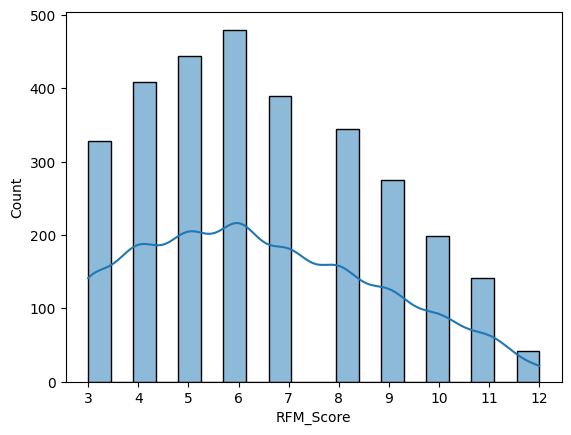

In [ ]:
# Plot the histogram
sns.histplot(CompleteRFM['RFM_Score'], bins=20, kde=True)

# Set x-axis ticks manually to show all RFM scores (assuming the score range is 1 to 12)
plt.xticks(range(3, 13))

# Display the plot
plt.show()

## RFM Segment

In [ ]:
def rfm_score(row):
    # Recency
    # The seller with the highest recency value is the one who has completed the most recent transaction, while the lowest recency value indicates the seller who has not completed a transaction for the longest time.
    if row['Recency'] <= 17:
        r = 4
    elif (row['Recency'] > 17) and (row['Recency'] <= 50):
        r = 3
    elif (row['Recency'] > 50) and (row['Recency'] <= 221):
        r = 2
    else:
        r = 1

    # Frequency
    # The seller with the smallest frequency value has the fewest number of transactions, while the highest frequency value indicates the seller with the most transactions.
    if row['Frequency'] <= 2:
        f = 1
    elif (row['Frequency'] > 2) and (row['Frequency'] <= 7):
        f = 2
    elif (row['Frequency'] > 7) and (row['Frequency'] <= 22):
        f = 3
    else:
        f = 4

    # Monetary
    # The seller with the smallest monetary value has the lowest total payment received from customers, while the highest monetary value indicates the seller with the highest total payment received from customers.
    if row['Total Monetary Value'] <= 277:
        m = 1
    elif (row['Total Monetary Value'] > 277) and (row['Total Monetary Value'] <= 1013):
        m = 2
    elif (row['Total Monetary Value'] > 1013) and (row['Total Monetary Value'] <= 4058):
        m = 3
    else:
        m = 4

    return r, f, m, str(r) + str(f) + str(m)

# Apply the function to create new columns
CompleteRFM[['R_Score', 'F_Score', 'M_Score', 'RFM_Segment_Score']] = CompleteRFM.apply(rfm_score, axis=1, result_type='expand')

# Display the updated DataFrame
CompleteRFM.head(5)

,Seller ID,Total Monetary Value,Frequency,Recency,RFM_Score,R_Score,F_Score,M_Score,RFM_Segment_Score
0,0015a82c2db000af6aaaf3ae2ecb0532,2748.06,1.500000,319,5,1,1,3,113
1,001cca7ae9ae17fb1caed9dfb1094831,33934.17,11.111111,52,9,2,3,4,234
2,002100f778ceb8431b7a1020ff7ab48f,2028.16,6.375000,144,7,2,2,3,223
3,003554e2dce176b5555353e4f3555ac8,139.38,1.000000,262,3,1,1,1,111
4,004c9cd9d87a3c30c522c48c4fc07416,23263.94,0.748815,121,7,2,1,4,214


In [ ]:

CompleteRFM['FM_Score'] = CompleteRFM['F_Score'] + CompleteRFM['M_Score']

# Manual Clustering using IF-ELSE Conditions
def segment_customer(row):
    recency = row['R_Score']
    fm_combined = row['FM_Score']
    if recency >= 4 and fm_combined >= 4:
        return 'Champions'
    elif recency >= 3 and fm_combined >= 3:
        return 'Loyal Sellers'
    elif recency >= 2 and fm_combined >= 3:
        return 'Potential Loyalist'
    elif recency >= 3 and fm_combined <= 2:
        return 'Promising'
    elif recency < 2 and fm_combined >= 3:
        return 'At Risk'
    elif recency < 2 and fm_combined <= 2:
        return 'Lost'
    else:
        return 'Uncategorized'

# Apply the segmentation function
CompleteRFM['Seller_Segment_Manual_RFM'] = CompleteRFM.apply(segment_customer, axis=1)
CompleteRFM.head(5)


,Seller ID,Total Monetary Value,Frequency,Recency,RFM_Score,R_Score,F_Score,M_Score,RFM_Segment_Score,FM_Score,Seller_Segment_Manual_RFM
0,0015a82c2db000af6aaaf3ae2ecb0532,2748.06,1.500000,319,5,1,1,3,113,4,At Risk
1,001cca7ae9ae17fb1caed9dfb1094831,33934.17,11.111111,52,9,2,3,4,234,7,Potential Loyalist
2,002100f778ceb8431b7a1020ff7ab48f,2028.16,6.375000,144,7,2,2,3,223,5,Potential Loyalist
3,003554e2dce176b5555353e4f3555ac8,139.38,1.000000,262,3,1,1,1,111,2,Lost
4,004c9cd9d87a3c30c522c48c4fc07416,23263.94,0.748815,121,7,2,1,4,214,5,Potential Loyalist


In [ ]:
CompleteRFM['Seller_Segment_Manual_RFM'].value_counts()

,count
Seller_Segment_Manual_RFM,
Loyal Sellers,724
Champions,603
Potential Loyalist,549
At Risk,434
Lost,328
Uncategorized,211
Promising,204


In [ ]:
CompleteRFM['Seller_Segment_Manual_RFM'].value_counts()/len(CompleteRFM)*100

,count
Seller_Segment_Manual_RFM,
Loyal Sellers,23.714379
Champions,19.751065
Potential Loyalist,17.982312
At Risk,14.215526
Lost,10.743531
Uncategorized,6.911235
Promising,6.681952


<ipython-input-93-61237e304cb2>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(data=segment_counts, x='Seller Segment', y='Percentage', palette='Set2')


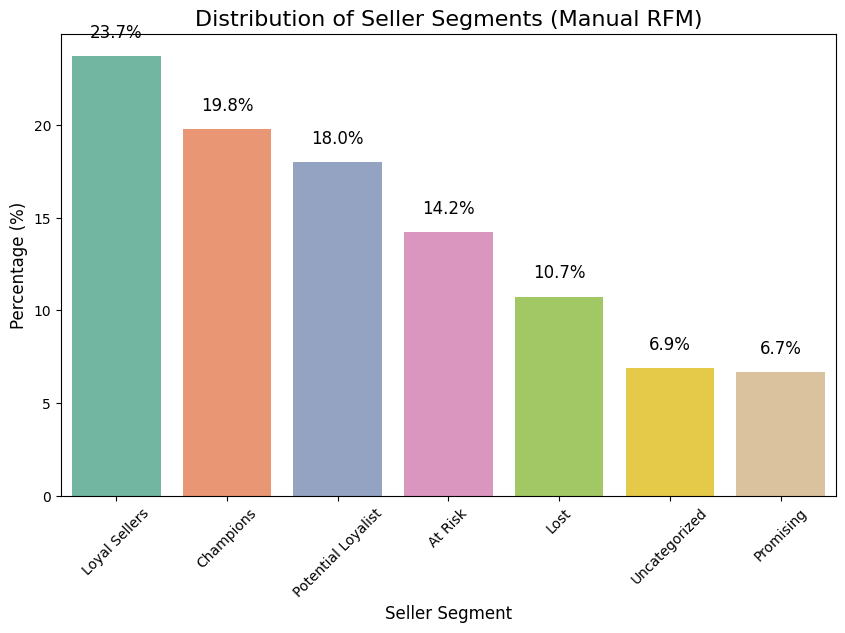

In [ ]:
# Calculate the value counts and percentages for each segment
segment_counts = CompleteRFM['Seller_Segment_Manual_RFM'].value_counts(normalize=True).reset_index()
segment_counts.columns = ['Seller Segment', 'Percentage']
segment_counts['Percentage'] *= 100  # Convert to percentage

# Create the bar plot
plt.figure(figsize=(10, 6))
barplot = sns.barplot(data=segment_counts, x='Seller Segment', y='Percentage', palette='Set2')

# Add percentage annotations on each bar
for i, row in segment_counts.iterrows():
    barplot.text(i, row['Percentage'] + 1, f'{row["Percentage"]:.1f}%', ha='center', fontsize=12)

# Set labels and title
plt.title('Distribution of Seller Segments (Manual RFM)', fontsize=16)
plt.xlabel('Seller Segment', fontsize=12)
plt.ylabel('Percentage (%)', fontsize=12)

# Rotate x-axis labels if needed
plt.xticks(rotation=45)

# Display the plot
plt.show()


In [ ]:

color_map = {
    'Champions': 'blue',
    'Loyal Sellers': 'green',
    'Potential Loyalist': 'orange',
    'Promising': 'purple',
    'At Risk': 'red',
    'Lost': 'gray',
    'Uncategorized': 'black'
}


colors = [color_map[segment] for segment in CompleteRFM['Seller_Segment_Manual_RFM']]

trace1_non_ml = go.Scatter3d(
    x=CompleteRFM['R_Score'],
    y=CompleteRFM['F_Score'],
    z=CompleteRFM['M_Score'],
    mode='markers',
    marker=dict(color=colors, size=5, opacity=0.8)
)

dataa1_non_ml = [trace1_non_ml]

layout1_non_ml = go.Layout(
    title='Cluster',
    scene=dict(
        xaxis=dict(title='Recency'),
        yaxis=dict(title='Frequency'),
        zaxis=dict(title='Monetary')
    )
)

fig1_non_ml = go.Figure(data=dataa1_non_ml, layout=layout1_non_ml)
py.offline.iplot(fig1_non_ml)

In [ ]:
# Define color map for each customer segment
color_map = {
    'Champions': 'blue',
    'Loyal Sellers': 'green',
    'Potential Loyalist': 'orange',
    'Promising': 'purple',
    'At Risk': 'red',
    'Lost': 'gray',
    'Uncategorized': 'black'
}

# List of unique customer segments
segments = CompleteRFM['Seller_Segment_Manual_RFM'].unique()

# Create a list of traces, one for each segment
traces = []
for segment in segments:
    # Filter data for the current segment
    segment_data = CompleteRFM[CompleteRFM['Seller_Segment_Manual_RFM'] == segment]

    # Create a 3D scatter trace for this segment
    trace = go.Scatter3d(
        x=segment_data['Recency'],
        y=segment_data['Frequency'],
        z=segment_data['Total Monetary Value'],
        mode='markers',
        marker=dict(color=color_map.get(segment, 'black'), size=5, opacity=0.8),
        name=segment  # Set the legend name
    )
    traces.append(trace)

# Define the layout
layout = go.Layout(
    title='RFM Segmentation with Legends',
    scene=dict(
        xaxis=dict(title='Recency'),
        yaxis=dict(title='Frequency'),
        zaxis=dict(title='Monetary')
    ),
    legend=dict(title='Seller Segment')
)

# Create the figure and plot it
fig = go.Figure(data=traces, layout=layout)
py.offline.iplot(fig)


**Observation**

As we can see from the graph above, the RFM manual clustering method is not very effective in grouping sellers, as some clusters overlap with each other. For example there are 'Loyal Sellers' that tend to overlap with 'Champions' in the higher monetary value.

# K-Means

Initiate machine learning K-Means for clustering sellers depending on Recency, Frequency and Monetary (RFM) score. We use K-Means because it is one of the most efficient, effective and simple algorithm for clustering. K-means is an iterative clustering algorithm that organizes a dataset into groups based on the proximity of data points to cluster centroids. The centroid, which represents the cluster's center, can be calculated as either the mean or median of all points in the cluster, depending on the nature of the data. The K-Means clustering algorithm groups data points based on a mathematical distance measure from the cluster center. The goal is to **minimize the total distance between data points and their respective cluster centers.** Points closest to a centroid are assigned to the same cluster. (Source: https://www.ibm.com/topics/k-means-clustering#:~:text=The%20k%2Dmeans%20algorithm%20is,the%20distance%20between%20their%20centroids.)

As this project goal is to find the best clustering for sellers based on RFM score, we will use K-Means as a primary method.

## Data Preprocessing

In [ ]:
transformer = ColumnTransformer([
    ('scaler', StandardScaler(), ['Recency', 'Frequency', 'Total Monetary Value'])
])

## Elbow Method

In [ ]:
inertia_list = []
for i in [1,2,3,4,5,6,7,8,9,10]:
    kmeans = Pipeline([
        ('transformer', transformer),
        ('kmeans', KMeans(n_clusters=i, random_state=0, n_init='auto'))
    ])
    kmeans.fit(CompleteRFM)

    # ambil nilai inertia
    inertia_list.append(kmeans.named_steps['kmeans'].inertia_)

inertia_list

[9158.99999999999,
 6637.965691428821,
 3379.889578545235,
 2286.6198997047563,
 1903.5592562680317,
 1638.9567132713005,
 1269.60857029303,
 1110.7407158339186,
 993.9790350829287,
 892.7640961344827]

<Axes: >

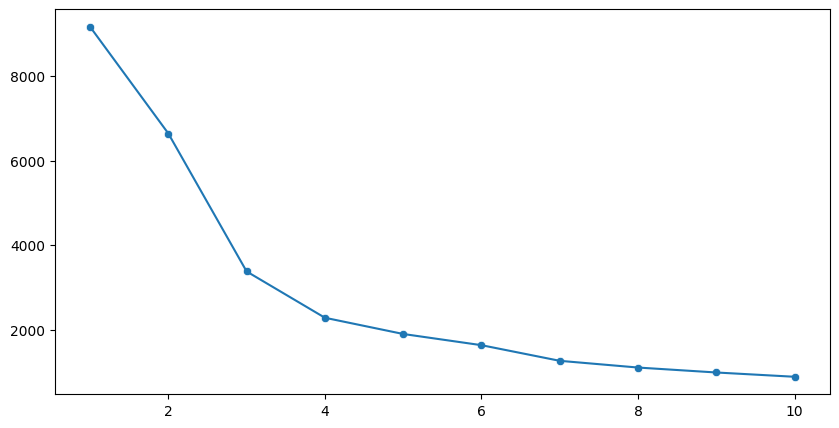

In [ ]:
plt.figure(figsize=(10,5))
sns.lineplot(x=[1,2,3,4,5,6,7,8,9,10], y=inertia_list)
sns.scatterplot(x=[1,2,3,4,5,6,7,8,9,10], y=inertia_list)

**Observation**

As we can see from the graph, the optimal number of clusters is 4, as the graph starts to flatten from the 4th cluster onwards.

## Silhouette Score

In [ ]:
silhouette_list = []
for i in [2,3,4,5,6,7,8,9,10]:
    kmeans = Pipeline([
        ('transformer', transformer),
        ('kmeans', KMeans(n_clusters=i, random_state=0, n_init='auto'))
    ])
    kmeans.fit(CompleteRFM)

    clusters = kmeans.predict(CompleteRFM)
    score = silhouette_score(transformer.fit_transform(CompleteRFM), clusters)
    silhouette_list.append(score)
silhouette_list

[0.5244042088163593,
 0.5681097844741088,
 0.6080977048655946,
 0.5220716689131412,
 0.5303335029966353,
 0.5373113149088665,
 0.5350606025404081,
 0.4752838072728345,
 0.4801939792912777]

<Axes: >

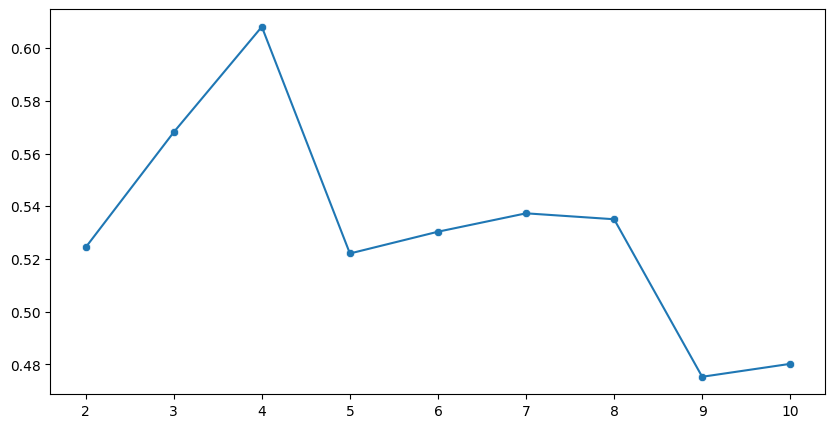

In [ ]:
plt.figure(figsize=(10,5))
sns.lineplot(x=[2,3,4,5,6,7,8,9,10], y=silhouette_list)
sns.scatterplot(x=[2,3,4,5,6,7,8,9,10], y=silhouette_list)

**Observation**

As we can see from the graph above, the optimal number of clusters is 4, as it has the highest silhouette score.

In [ ]:
#Checking Silhouette Score from RFM rule-based

# Encode RFM segments to numerical labels
rfm_labels = CompleteRFM['Seller_Segment_Manual_RFM'].astype('category').cat.codes

# Calculate Silhouette Score for RFM rule-based model
rfm_silhouette = silhouette_score(CompleteRFM[['Recency', 'Frequency', 'Total Monetary Value']], rfm_labels)
print(f'Silhouette Score for RFM Rule-Based Model: {rfm_silhouette:.2f}')

Silhouette Score for RFM Rule-Based Model: -0.33


**Observation**

As we can see from the calculation above, the silhouette score for the RFM rule-based model is lower than that of K-Means (-0.33 compared to 0.6). Therefore, K-Means is a better method for clustering sellers than the rule-based model. Moreover, the silhouette score from K-Means is more than 0.5, which indicates a high-quality cluster. (https://www.researchgate.net/post/Threshold_silhouette_score_for_cluster_analysis/63d4eef48c6a9e726e0a9bd4/citation/download)

## Result

In [ ]:
kmeans = Pipeline([
    ('transformer', transformer),
    ('kmeans', KMeans(n_clusters=4, random_state=0, n_init='auto'))
])
kmeans.fit(CompleteRFM)

Pipeline(steps=[('transformer',
                 ColumnTransformer(transformers=[('scaler', StandardScaler(),
                                                  ['Recency', 'Frequency',
                                                   'Total Monetary Value'])])),
                ('kmeans', KMeans(n_clusters=4, random_state=0))])

In [ ]:
# Retrieve the clusters from the KMeans model
clusters = kmeans.named_steps['kmeans'].labels_

# Define a color map for each cluster (using a fixed color palette for consistency)
color_map = ['blue', 'green', 'orange', 'purple', 'red', 'gray', 'black']
unique_clusters = sorted(set(clusters))

# Create a list of traces, one for each cluster
traces = []
for cluster in unique_clusters:
    # Filter data for the current cluster
    cluster_data = CompleteRFM[clusters == cluster]

    # Assign a color based on the cluster index
    color = color_map[cluster % len(color_map)]  # Use modulo to avoid index errors if there are more clusters

    # Create a 3D scatter trace for this cluster
    trace = go.Scatter3d(
        x=cluster_data['Recency'],
        y=cluster_data['Frequency'],
        z=cluster_data['Total Monetary Value'],
        mode='markers',
        marker=dict(color=color, size=5, opacity=0.8),
        name=f'Cluster {cluster}'  # Set the legend name
    )
    traces.append(trace)

# Define the layout
layout = go.Layout(
    title='KMeans Clustering on RFM Features',
    scene=dict(
        xaxis=dict(title='Recency'),
        yaxis=dict(title='Frequency'),
        zaxis=dict(title='Monetary')
    ),
    legend=dict(title='Cluster')
)

# Create the figure and plot it
fig = go.Figure(data=traces, layout=layout)
py.offline.iplot(fig)


**Observation**

As we can see from graph above, there are 4 clusters formed from K-Means. Each cluster has different RFM score and K-Means successfully clustered the sellers based on their RFM score. We will rename each cluster later on section below.

## Input Clustering Data

In [ ]:
# Fit KMeans with k=4
kmeans = Pipeline([
    ('transformer', transformer),
    ('kmeans', KMeans(n_clusters=4, random_state=0, n_init='auto'))
])
kmeans.fit(CompleteRFM)

# Get cluster labels
clusters = kmeans.predict(CompleteRFM)

# Print cluster labels
print(set(clusters))


{0, 1, 2, 3}


In [ ]:
CompleteRFM['K-Means Cluster'] = clusters
CompleteRFM.head()

,Seller ID,Total Monetary Value,Frequency,Recency,RFM_Score,R_Score,F_Score,M_Score,RFM_Segment_Score,FM_Score,Seller_Segment_Manual_RFM,K-Means Cluster
0,0015a82c2db000af6aaaf3ae2ecb0532,2748.06,1.500000,319,5,1,1,3,113,4,At Risk,0
1,001cca7ae9ae17fb1caed9dfb1094831,33934.17,11.111111,52,9,2,3,4,234,7,Potential Loyalist,3
2,002100f778ceb8431b7a1020ff7ab48f,2028.16,6.375000,144,7,2,2,3,223,5,Potential Loyalist,1
3,003554e2dce176b5555353e4f3555ac8,139.38,1.000000,262,3,1,1,1,111,2,Lost,0
4,004c9cd9d87a3c30c522c48c4fc07416,23263.94,0.748815,121,7,2,1,4,214,5,Potential Loyalist,1


In [ ]:
# Define the mapping of cluster labels
cluster_mapping = {
    0: 'Lost',
    1: 'Potential',
    2: 'Champions',
    3: 'Loyal Sellers'
}

# Create a new column with the renamed clusters
CompleteRFM['Cluster Name K-Means'] = CompleteRFM['K-Means Cluster'].replace(cluster_mapping)

# Display the updated DataFrame
CompleteRFM[['K-Means Cluster', 'Cluster Name K-Means']].head()


,K-Means Cluster,Cluster Name K-Means
0,0,Lost
1,3,Loyal Sellers
2,1,Potential
3,0,Lost
4,1,Potential


## Comparison ML and Rule-Based

In [ ]:
CompleteRFM['Seller_Segment_Manual_RFM'].value_counts(normalize=True)

,proportion
Seller_Segment_Manual_RFM,
Loyal Sellers,0.237144
Champions,0.197511
Potential Loyalist,0.179823
At Risk,0.142155
Lost,0.107435
Uncategorized,0.069112
Promising,0.066820


In [ ]:
CompleteRFM['Cluster Name K-Means'].value_counts(normalize=True)

,proportion
Cluster Name K-Means,
Potential,0.705536
Lost,0.239764
Loyal Sellers,0.048477
Champions,0.006223


In [ ]:
CompleteRFM.groupby('Cluster Name K-Means')[['Recency', 'Frequency', 'Total Monetary Value']].mean()

,Recency,Frequency,Total Monetary Value
Cluster Name K-Means,,,
Champions,11.421053,61.877172,158288.161053
Lost,403.498634,1.519460,1093.662910
Loyal Sellers,30.513514,17.294962,34221.768649
Potential,59.084958,2.395859,3185.944986


In [ ]:
#ML
rfm_summary_ml = CompleteRFM.groupby('Cluster Name K-Means')[['Recency', 'Frequency', 'Total Monetary Value']].mean()
rfm_summary_ml
# Sort by Total Monetary Value and then by Frequency
rfm_summary_sorted_ml = rfm_summary_ml.sort_values(by=['Recency'], ascending=[False])
rfm_summary_sorted_ml

,Recency,Frequency,Total Monetary Value
Cluster Name K-Means,,,
Lost,403.498634,1.519460,1093.662910
Potential,59.084958,2.395859,3185.944986
Loyal Sellers,30.513514,17.294962,34221.768649
Champions,11.421053,61.877172,158288.161053


In [ ]:
# Rule Based - Group by Seller_Segment_Manual_RFM and sort by mean values
rfm_summary_rb = CompleteRFM.groupby('Seller_Segment_Manual_RFM')[['Recency', 'Frequency', 'Total Monetary Value']].mean()

# Sort by one of the columns, for example, by 'Recency' in descending order
rfm_summary_sorted_rb = rfm_summary_rb.sort_values(by='Recency', ascending=False)

# Print sorted summary
rfm_summary_sorted_rb


,Recency,Frequency,Total Monetary Value
Seller_Segment_Manual_RFM,,,
Lost,420.597561,1.030057,125.874970
At Risk,378.746544,2.015129,2065.483779
Potential Loyalist,123.176685,2.442788,4564.158907
Uncategorized,122.464455,1.007852,135.011137
Loyal Sellers,27.111878,2.491135,4811.286796
Promising,25.205882,1.147655,146.410882
Champions,11.270315,8.630798,14511.155174


**Observation**

As we can see from the tables above, the proportions of each cluster in the rule-based and K-Means methods differ. Clusters 0 and 1 from K-Means indicate groups with lower frequency, lower monetary value, and higher recency, which require more attention. This shows that K-Means can effectively identify clusters needing additional focus.

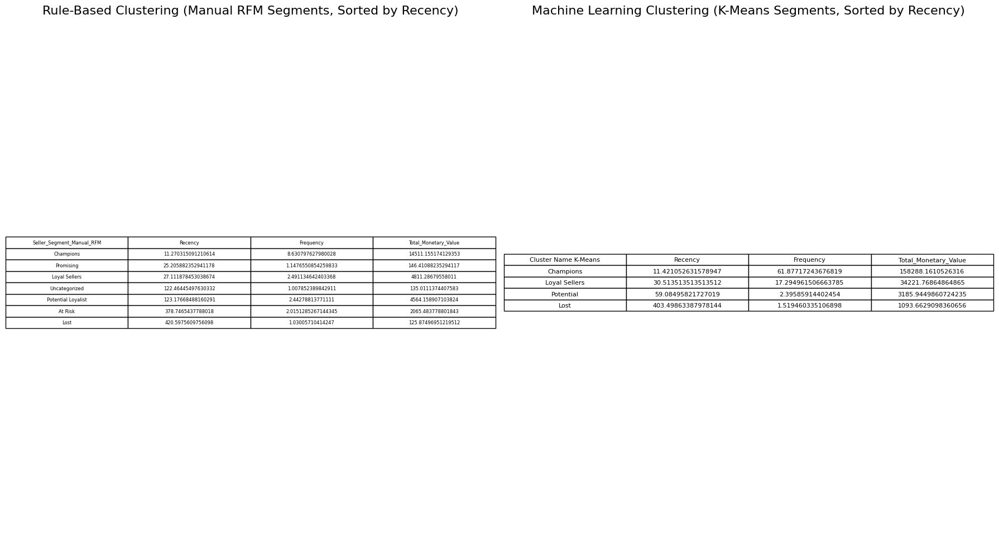

In [ ]:
# Prepare Rule-Based table (including manual RFM segments), sorted by Recency
rfm_summary_sorted_rb = CompleteRFM.groupby('Seller_Segment_Manual_RFM').agg(
    Recency=('Recency', 'mean'),
    Frequency=('Frequency', 'mean'),
    Total_Monetary_Value=('Total Monetary Value', 'mean')
).reset_index().sort_values(by='Recency', ascending=True)

# Prepare Machine Learning table (including K-Means cluster names), sorted by Recency
rfm_summary_sorted_ml = CompleteRFM.groupby('Cluster Name K-Means').agg(
    Recency=('Recency', 'mean'),
    Frequency=('Frequency', 'mean'),
    Total_Monetary_Value=('Total Monetary Value', 'mean')
).reset_index().sort_values(by='Recency', ascending=True)

# Create a figure to display the tables side by side
fig, axes = plt.subplots(1, 2, figsize=(18, 10))

# Plot the Rule-Based table
axes[0].axis('off')  # Turn off axis for cleaner table display
axes[0].table(cellText=rfm_summary_sorted_rb.values, colLabels=rfm_summary_sorted_rb.columns, loc='center', cellLoc='center')
axes[0].set_title('Rule-Based Clustering (Manual RFM Segments, Sorted by Recency)', fontsize=16)

# Plot the Machine Learning table
axes[1].axis('off')  # Turn off axis for cleaner table display
axes[1].table(cellText=rfm_summary_sorted_ml.values, colLabels=rfm_summary_sorted_ml.columns, loc='center', cellLoc='center')
axes[1].set_title('Machine Learning Clustering (K-Means Segments, Sorted by Recency)', fontsize=16)

# Adjust the layout and show the plot
plt.tight_layout()
plt.show()


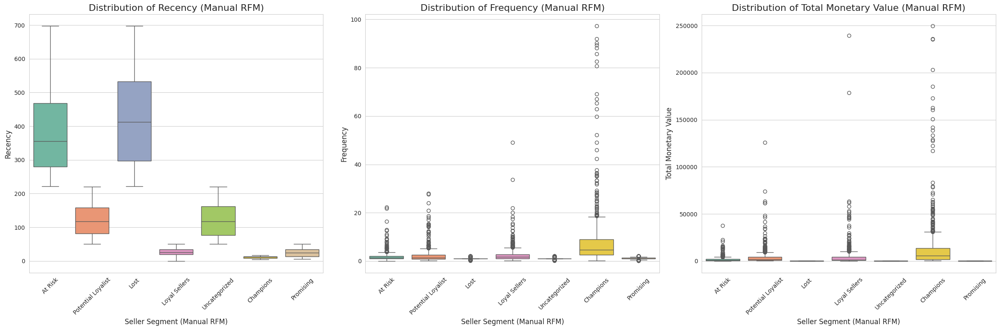

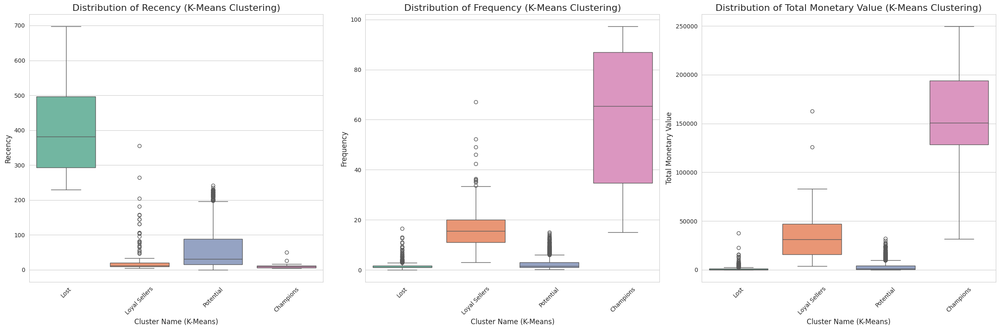

In [ ]:
# Create a figure with subplots for Recency, Frequency, and Total Monetary Value boxplots
fig, axes = plt.subplots(1, 3, figsize=(24, 8))

# Plot for Recency (Manual RFM)
sns.boxplot(
    data=CompleteRFM,
    x='Seller_Segment_Manual_RFM',
    y='Recency',
    hue='Seller_Segment_Manual_RFM',  # Use hue for color
    palette='Set2',
    ax=axes[0],
    showfliers=True
)
axes[0].set_title('Distribution of Recency (Manual RFM)', fontsize=16)
axes[0].set_xlabel('Seller Segment (Manual RFM)', fontsize=12)
axes[0].set_ylabel('Recency', fontsize=12)
axes[0].tick_params(axis='x', rotation=45)
axes[0].legend().set_visible(False)  # Hide legend if unnecessary

# Plot for Frequency (Manual RFM)
sns.boxplot(
    data=CompleteRFM,
    x='Seller_Segment_Manual_RFM',
    y='Frequency',
    hue='Seller_Segment_Manual_RFM',  # Use hue for color
    palette='Set2',
    ax=axes[1],
    showfliers=True
)
axes[1].set_title('Distribution of Frequency (Manual RFM)', fontsize=16)
axes[1].set_xlabel('Seller Segment (Manual RFM)', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)
axes[1].tick_params(axis='x', rotation=45)
axes[1].legend().set_visible(False)

# Plot for Total Monetary Value (Manual RFM)
sns.boxplot(
    data=CompleteRFM,
    x='Seller_Segment_Manual_RFM',
    y='Total Monetary Value',
    hue='Seller_Segment_Manual_RFM',  # Use hue for color
    palette='Set2',
    ax=axes[2],
    showfliers=True
)
axes[2].set_title('Distribution of Total Monetary Value (Manual RFM)', fontsize=16)
axes[2].set_xlabel('Seller Segment (Manual RFM)', fontsize=12)
axes[2].set_ylabel('Total Monetary Value', fontsize=12)
axes[2].tick_params(axis='x', rotation=45)
axes[2].legend().set_visible(False)

# Adjust the layout
plt.tight_layout()
plt.show()

# Boxplots for K-Means Clusters (Machine Learning Clustering)
fig, axes = plt.subplots(1, 3, figsize=(24, 8))

# Plot for Recency (K-Means)
sns.boxplot(
    data=CompleteRFM,
    x='Cluster Name K-Means',
    y='Recency',
    hue='Cluster Name K-Means',  # Use hue for color
    palette='Set2',
    ax=axes[0],
    showfliers=True
)
axes[0].set_title('Distribution of Recency (K-Means Clustering)', fontsize=16)
axes[0].set_xlabel('Cluster Name (K-Means)', fontsize=12)
axes[0].set_ylabel('Recency', fontsize=12)
axes[0].tick_params(axis='x', rotation=45)
axes[0].legend().set_visible(False)

# Plot for Frequency (K-Means)
sns.boxplot(
    data=CompleteRFM,
    x='Cluster Name K-Means',
    y='Frequency',
    hue='Cluster Name K-Means',  # Use hue for color
    palette='Set2',
    ax=axes[1],
    showfliers=True
)
axes[1].set_title('Distribution of Frequency (K-Means Clustering)', fontsize=16)
axes[1].set_xlabel('Cluster Name (K-Means)', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)
axes[1].tick_params(axis='x', rotation=45)
axes[1].legend().set_visible(False)

# Plot for Total Monetary Value (K-Means)
sns.boxplot(
    data=CompleteRFM,
    x='Cluster Name K-Means',
    y='Total Monetary Value',
    hue='Cluster Name K-Means',  # Use hue for color
    palette='Set2',
    ax=axes[2],
    showfliers=True
)
axes[2].set_title('Distribution of Total Monetary Value (K-Means Clustering)', fontsize=16)
axes[2].set_xlabel('Cluster Name (K-Means)', fontsize=12)
axes[2].set_ylabel('Total Monetary Value', fontsize=12)
axes[2].tick_params(axis='x', rotation=45)
axes[2].legend().set_visible(False)

# Adjust the layout
plt.tight_layout()
plt.show()


**Observation**

The rule-based and K-Means models result in different numbers of clusters, and the cluster characteristics vary between them. As discussed earlier, the silhouette score for K-Means is higher than that of the rule-based model, indicating a better fit for clustering. Furthermore, K-Means offers more distinct and reliable segmentation of sellers, as evidenced by the 3D graph, while the Manual RFM approach reveals a considerable number of outliers. Based on these findings, it is recommended that Olist adopt K-Means for seller segmentation, allowing for more precise and targeted marketing efforts, particularly for clusters that require additional attention.

# DBSCAN

K-Means performs effectively when the data is well-separated and uniformly distributed, whereas DBSCAN is more suitable for datasets with irregular shapes or varying densities (Source: https://www.newhorizons.com/resources/blog/dbscan-vs-kmeans-a-guide-in-python#:~:text=K%2DMeans%20tends%20to%20work,in%20Python%20using%20scikit%2Dlearn.).

After clustering with K-Means, we found that the dataset tends to have irregular shapes. Therefore, we will compare the results of clustering using K-Means and DBSCAN to assess which method is more suitable.

In [ ]:
# Select only the RFM columns
rfm_columns = ['Recency', 'Frequency', 'Total Monetary Value']
scaler = StandardScaler()
CompleteRFM_scaled = scaler.fit_transform(CompleteRFM[rfm_columns])

In [ ]:
# Apply DBSCAN
dbscan = DBSCAN(eps=0.6, min_samples=20)
dbscan_labels = dbscan.fit_predict(CompleteRFM_scaled)

# Silhouette score for DBSCAN (ignoring noise points labeled as -1)
dbscan_silhouette = silhouette_score(CompleteRFM_scaled, dbscan_labels) if len(set(dbscan_labels)) > 1 else -1
print(f"Silhouette Score for DBSCAN: {dbscan_silhouette}")


Silhouette Score for DBSCAN: 0.7547772175466431


In [ ]:
# Check the number of unique clusters (excluding noise points labeled as -1)
unique_labels = set(dbscan_labels) - {-1}

# Calculate Silhouette Score only if there are at least 2 clusters (excluding noise)
if len(unique_labels) > 1:
    dbscan_silhouette = silhouette_score(CompleteRFM_scaled[dbscan_labels != -1], dbscan_labels[dbscan_labels != -1])
else:
    dbscan_silhouette = -1
print(f"Silhouette Score for DBSCAN: {dbscan_silhouette}")

# Create a DataFrame to hold the results
CompleteRFM['Cluster'] = dbscan_labels
color_map = ['blue', 'green', 'orange', 'purple', 'red', 'gray', 'black']
unique_clusters = sorted(set(dbscan_labels))

# Create a list of traces for Plotly visualization
traces = []
for cluster in unique_clusters:
    # Filter data for the current cluster
    cluster_data = CompleteRFM[CompleteRFM['Cluster'] == cluster]

    # Assign a color (use 'black' for noise points labeled as -1)
    color = 'black' if cluster == -1 else color_map[cluster % len(color_map)]

    # Create a 3D scatter trace for this cluster
    trace = go.Scatter3d(
        x=cluster_data['Recency'],
        y=cluster_data['Frequency'],
        z=cluster_data['Total Monetary Value'],
        mode='markers',
        marker=dict(color=color, size=5, opacity=0.8),
        name=f'Cluster {cluster}' if cluster != -1 else 'Noise'
    )
    traces.append(trace)

# Define the layout
layout = go.Layout(
    title=f'DBSCAN Clustering on RFM Features',
    scene=dict(
        xaxis=dict(title='Recency'),
        yaxis=dict(title='Frequency'),
        zaxis=dict(title='Total Monetary Value')
    ),
    legend=dict(title='Cluster'),
    margin=dict(l=0, r=0, b=0, t=40)
)

# Create the figure and plot it
fig = go.Figure(data=traces, layout=layout)
pio.show(fig)


Silhouette Score for DBSCAN: -1


**Observation**

Although DBSCAN's silhouette score is higher than that of K-Means, DBSCAN fails to cluster the sellers based on their behavior. DBSCAN only forms two clusters, including noise, making the results uninterpretable for further recommendations.

#In-Depth Data Analysis

In [ ]:
numeric = dfcleaned.select_dtypes(include = 'number')

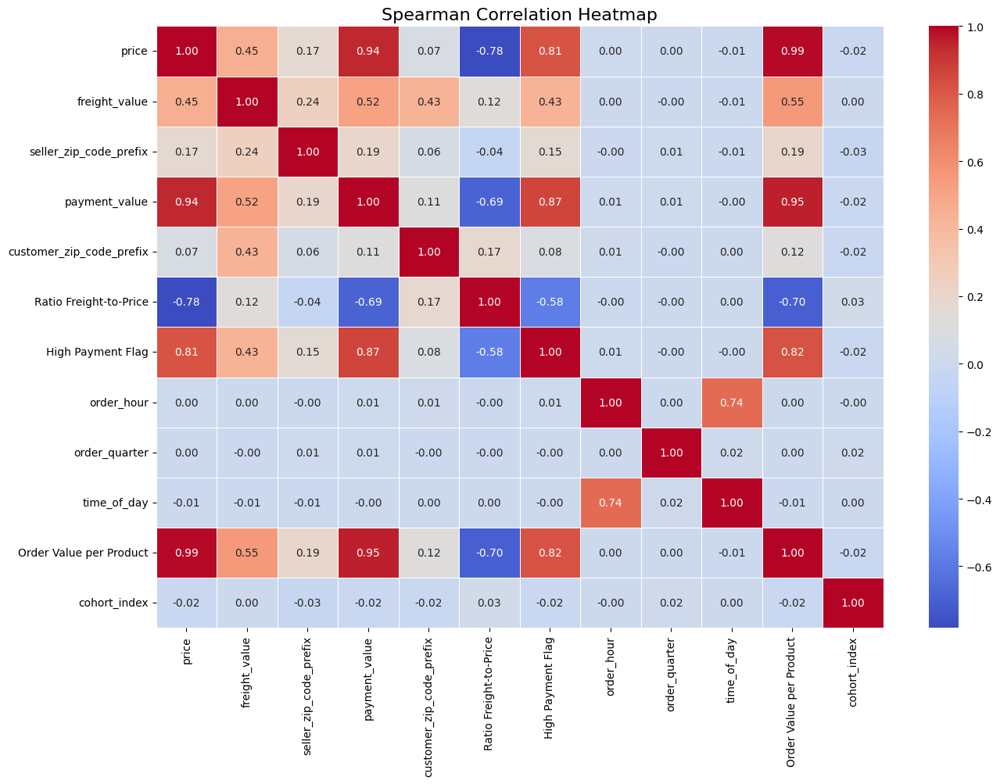

In [ ]:
plt.figure(figsize=(15, 10))
sns.heatmap(numeric.corr(method='spearman'), annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Spearman Correlation Heatmap', fontsize=16)
plt.show()

We will first have to find out which seller_ids belong to which labels given by KMeans in full cleaned dataframe by merging to dfcleaned.

In [ ]:
dfcleaned.rename(columns={'seller_id': 'Seller ID'}, inplace=True)
Newdf = dfcleaned.merge(CompleteRFM, on='Seller ID', how = 'left')
Newdf.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,Seller ID,product_id,...,RFM_Score,R_Score,F_Score,M_Score,RFM_Segment_Score,FM_Score,Seller_Segment_Manual_RFM,K-Means Cluster,Cluster Name K-Means,Cluster
0,2e7a8482f6fb09756ca50c10d7bfc047,08c5351a6aca1c1589a38f244edeee9d,shipped,2016-09-04 21:15:19,2016-10-07 13:18:03,2016-10-18 13:14:51,2000-11-11 00:00:00,2016-10-20,1554a68530182680ad5c8b042c3ab563,c1488892604e4ba5cff5b4eb4d595400,...,10,3,3,4,334,7,Loyal Sellers,3,Loyal Sellers,0
1,2e7a8482f6fb09756ca50c10d7bfc047,08c5351a6aca1c1589a38f244edeee9d,shipped,2016-09-04 21:15:19,2016-10-07 13:18:03,2016-10-18 13:14:51,2000-11-11 00:00:00,2016-10-20,1554a68530182680ad5c8b042c3ab563,f293394c72c9b5fafd7023301fc21fc2,...,10,3,3,4,334,7,Loyal Sellers,3,Loyal Sellers,0
2,3b697a20d9e427646d92567910af6d57,355077684019f7f60a031656bd7262b8,delivered,2016-10-03 09:44:50,2016-10-06 15:50:54,2016-10-23 14:02:13,2016-10-26 14:02:13,2016-10-27,522620dcb18a6b31cd7bdf73665113a9,3ae08df6bcbfe23586dd431c40bddbb7,...,10,3,3,4,334,7,Loyal Sellers,3,Loyal Sellers,-1
3,be5bc2f0da14d8071e2d45451ad119d9,7ec40b22510fdbea1b08921dd39e63d8,delivered,2016-10-03 16:56:50,2016-10-06 16:03:44,2016-10-21 16:33:46,2016-10-27 18:19:38,2016-11-07,f09b760d23495ac9a7e00d29b769007c,fd7fd78fd3cbc1b0a6370a7909c0a629,...,3,1,1,1,111,2,Lost,0,Lost,0
4,a41c8759fbe7aab36ea07e038b2d4465,6f989332712d3222b6571b1cf5b835ce,delivered,2016-10-03 21:13:36,2016-10-05 03:11:49,2016-10-25 11:57:59,2016-11-03 10:58:07,2016-11-29,45d33f715e24d15a6ccf5c17b3a23e3c,b72b39418216e944bb34e35f4d3ea8c7,...,10,4,2,4,424,6,Champions,1,Potential,0


## Olist Market Profile

Classifying state category

In [ ]:
geojson_data = pd.read_json('brazil-states.geojson')

# Load the GeoJSON file properly
with open('brazil-states.geojson', 'r') as file:
    geojson_data = json.load(file)

# Extract 'sigla' (state abbreviation) and 'name' (state full name) into a dictionary
state_names = {feature['properties']['sigla']: feature['properties']['name']
               for feature in geojson_data['features']}

# Map state full name to the Newdf DataFrame based on the seller_state column
Newdf['state_full_name'] = Newdf['seller_state'].map(state_names)

# Define the label function to classify states
def label(neighbourbood):
    if neighbourbood in ['SP', 'RJ', 'MG', 'RS', 'PR', 'SC', 'DF']:
        return 'Urban'
    elif neighbourbood in ['ES', 'BA', 'GO', 'PE', 'CE', 'RN', 'PB', 'AL', 'SE']:
        return 'Suburban'
    elif neighbourbood in ['AC', 'PA', 'AM', 'AP', 'RR', 'MA', 'PI', 'TO', 'MT', 'MS', 'RO']:
        return 'Rural'
    else:
        return 'Unknown'

# Apply the label function to create a state category column
Newdf['state_category'] = Newdf['seller_state'].apply(label)

# Display the first 2 rows of the updated DataFrame
Newdf.head()


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,Seller ID,product_id,...,F_Score,M_Score,RFM_Segment_Score,FM_Score,Seller_Segment_Manual_RFM,K-Means Cluster,Cluster Name K-Means,Cluster,state_full_name,state_category
0,2e7a8482f6fb09756ca50c10d7bfc047,08c5351a6aca1c1589a38f244edeee9d,shipped,2016-09-04 21:15:19,2016-10-07 13:18:03,2016-10-18 13:14:51,2000-11-11 00:00:00,2016-10-20,1554a68530182680ad5c8b042c3ab563,c1488892604e4ba5cff5b4eb4d595400,...,3,4,334,7,Loyal Sellers,3,Loyal Sellers,0,Minas Gerais,Urban
1,2e7a8482f6fb09756ca50c10d7bfc047,08c5351a6aca1c1589a38f244edeee9d,shipped,2016-09-04 21:15:19,2016-10-07 13:18:03,2016-10-18 13:14:51,2000-11-11 00:00:00,2016-10-20,1554a68530182680ad5c8b042c3ab563,f293394c72c9b5fafd7023301fc21fc2,...,3,4,334,7,Loyal Sellers,3,Loyal Sellers,0,Minas Gerais,Urban
2,3b697a20d9e427646d92567910af6d57,355077684019f7f60a031656bd7262b8,delivered,2016-10-03 09:44:50,2016-10-06 15:50:54,2016-10-23 14:02:13,2016-10-26 14:02:13,2016-10-27,522620dcb18a6b31cd7bdf73665113a9,3ae08df6bcbfe23586dd431c40bddbb7,...,3,4,334,7,Loyal Sellers,3,Loyal Sellers,-1,Paraná,Urban
3,be5bc2f0da14d8071e2d45451ad119d9,7ec40b22510fdbea1b08921dd39e63d8,delivered,2016-10-03 16:56:50,2016-10-06 16:03:44,2016-10-21 16:33:46,2016-10-27 18:19:38,2016-11-07,f09b760d23495ac9a7e00d29b769007c,fd7fd78fd3cbc1b0a6370a7909c0a629,...,1,1,111,2,Lost,0,Lost,0,São Paulo,Urban
4,a41c8759fbe7aab36ea07e038b2d4465,6f989332712d3222b6571b1cf5b835ce,delivered,2016-10-03 21:13:36,2016-10-05 03:11:49,2016-10-25 11:57:59,2016-11-03 10:58:07,2016-11-29,45d33f715e24d15a6ccf5c17b3a23e3c,b72b39418216e944bb34e35f4d3ea8c7,...,2,4,424,6,Champions,1,Potential,0,São Paulo,Urban


In [ ]:
print(f"Total seller Olist: {Newdf['Seller ID'].nunique():,.0f}")
print(f"Total customer Olist: {Newdf['customer_unique_id'].nunique():,.0f}")
print(f"Total order Olist: {Newdf['order_id'].nunique():,.0f}")
print(f"Total Olist omzet: {Newdf[ 'Order Value per Product'].sum():,.2f}")

Newdf_distribution = Newdf.groupby(['state_category','state_full_name','Cluster Name K-Means']).agg(
    seller_count=('Seller ID','nunique'),
    customer_count = ('customer_unique_id','nunique'),
    order_count = ('order_id','nunique'),
    total_omzet = ('Order Value per Product','sum')).reset_index().sort_values(by='seller_count',ascending=False)

# Newdf_Newdf_distribution['total_omzet'] = Newdf_Newdf_distribution['total_omzet'].apply(lambda x: f"{x:,.2f}")
Newdf_distribution.head()

Total seller Olist: 3,053
Total customer Olist: 94,982
Total order Olist: 98,198
Total Olist omzet: 15,735,383.57


,state_category,state_full_name,Cluster Name K-Means,seller_count,customer_count,order_count,total_omzet
50,Urban,São Paulo,Potential,1265,26452,26901,3915495.06
48,Urban,São Paulo,Lost,441,2633,2654,468814.57
36,Urban,Paraná,Potential,244,4150,4183,823638.47
33,Urban,Minas Gerais,Potential,169,4556,4611,717001.89
46,Urban,Santa Catarina,Potential,134,2220,2234,366050.09


### Geographical Analysis

The Brazilian Institute of Geography and Statistics (IBGE) has developed methodologies to classify areas within Brazil as urban, suburban, or rural, considering factors such as population density, economic activities, and infrastructure development. (Source: https://www.ibge.gov.br/busca.html?searchword=urban%2C+suburban%2C+rural)
- Urban areas: These regions are characterized by  high population density, extensive infrastructure, and significant economic activities. Typically has large metropolitan areas and are the main economic and population hubs in Brazil
- Suburban have growing metropolitan regions but are also marked by smaller cities and less densely populated areas
- Rural are dominated by agricultural activities, low population density, and vast natural areas

In [ ]:
print(f"Total seller Olist: {Newdf['Seller ID'].nunique():,.0f}")
print(f"Total Olist omzet: {Newdf[ 'Order Value per Product'].sum():,.2f}")

Newdf_seller = Newdf.groupby(['state_category','state_full_name','Cluster Name K-Means']).agg(
    seller_count=('Seller ID','nunique'),
    total_omzet = ('Order Value per Product','sum')).reset_index().sort_values(by='seller_count',ascending=False)
tot_seller = Newdf_seller.groupby('state_full_name')['seller_count'].agg('sum').reset_index()

Total seller Olist: 3,053
Total Olist omzet: 15,735,383.57


In [ ]:
# Path to the GeoJSON neighbourhood file
neighbourhood_geojson = "brazil-states.geojson"

# The map centered on Brazil
m = folium.Map(location=[-14.2350, -51.9253], zoom_start=4, tiles='CartoDB positron')

# Load the GeoJSON file
with open(neighbourhood_geojson, 'r') as file:
    geojson_data = json.load(file)

folium.GeoJson(
    neighbourhood_geojson,
    name='area',
    style_function=lambda x: {'fillColor': 'none', 'color': 'purple', 'weight': 3},
).add_to(m)

# List of central coordinates and area names
coordinates = {
    'urban': (-23.5505, -46.6333),
    'suburban': (-16.6869, -49.2648),
    'rural': (-9.0238, -70.8120),
}
# Add annotations for each area
for area, coord in coordinates.items():
    label_area = f"<b><span style='color: white; text-shadow: 0px 0px 8px black;'>{area}</span></b>"
    folium.Marker(location=coord, icon=folium.DivIcon(html=label_area)).add_to(m)

# Create a mapping from state name to seller_count
state_to_seller_count = tot_seller.set_index('state_full_name')['seller_count'].to_dict()

# Add Choropleth layer for seller counts
folium.Choropleth(
    geo_data=geojson_data,
    name='Choropleth',
    data=state_to_seller_count,
    columns=['state_full_name', 'seller_count'],
    key_on='feature.properties.name',
    fill_color='BuPu',
    fill_opacity=0.6,
    line_opacity=0.2,
    legend_name='Number of Olist Sellers',
    highlight=True,
    zoom_on_click=True,
).add_to(m)

# Add seller_count to GeoJSON properties
for feature in geojson_data['features']:
    state_name = feature['properties']['name']  # Match the 'name' property in GeoJSON
    feature['properties']['seller_count'] = state_to_seller_count.get(state_name, 'N/A')  # Add seller_count or 'N/A' if missing

# Add GeoJSON layer with seller_count in the tooltip
folium.GeoJson(
    geojson_data,
    name='Seller Count',
    style_function=lambda x: {'fillColor': 'white', 'color': 'grey', 'weight': 0.5},
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "seller_count"],
        aliases=["State Name:", "Seller Count:"],
        localize=True
    ),
).add_to(m)

# Add a title to the map
title = "<h3>Seller Distribution</h3>"
m.get_root().html.add_child(folium.Element(title))

folium.LayerControl().add_to(m)
m

**Observations:**

- The majority of sellers come from urban areas with `São Paulo` and `Paraná` being the most popular state where the sellers come from, followed by suburban areas
- There are 4 states in Brazil that do not have sellers, namely Tocantins, Alagoas, Amapai, Roraima

Now we will check the customer distribution

In [ ]:
print(f"Total customer Olist: {Newdf['customer_unique_id'].nunique():,.0f}")
print(f"Total order Olist: {Newdf['order_id'].nunique():,.0f}")
Newdf_customer = Newdf.groupby(['state_category','state_full_name','Cluster Name K-Means']).agg(
    customer_count = ('customer_unique_id','nunique'),
    # order_count = ('order_id','nunique')
    )
total_customer = Newdf_customer.groupby('state_full_name')['customer_count'].agg('sum').reset_index()

Total customer Olist: 94,982
Total order Olist: 98,198


In [ ]:
# The map centered on Brazil
m = folium.Map(location=[-14.2350, -51.9253], zoom_start=4, tiles='CartoDB positron')

# Load the GeoJSON file
with open(neighbourhood_geojson, 'r') as file:
    geojson_data = json.load(file)

folium.GeoJson(
    neighbourhood_geojson,
    name='area',
    style_function=lambda x: {'fillColor': 'none', 'color': 'purple', 'weight': 3},
).add_to(m)

# List of central coordinates and area names
coordinates = {
    'urban': (-23.5505, -46.6333),
    'suburban': (-16.6869, -49.2648),
    'rural': (-9.0238, -70.8120),
}
# Add annotations for each area
for area, coord in coordinates.items():
    label_area = f"<b><span style='color: white; text-shadow: 0px 0px 8px black;'>{area}</span></b>"
    folium.Marker(location=coord, icon=folium.DivIcon(html=label_area)).add_to(m)

# Create a mapping from state name to customer_count from Newdf_distribution
state_to_customer_count = total_customer.set_index('state_full_name')['customer_count'].to_dict()

# Add Choropleth layer for customer counts
folium.Choropleth(
    geo_data=geojson_data,
    name='Choropleth',
    data=state_to_customer_count,
    columns=['state_full_name', 'customer_count'],
    key_on='feature.properties.name',
    fill_color='BuPu',
    fill_opacity=0.6,
    line_opacity=0.2,
    legend_name='Number of customer',
    highlight=True,
    zoom_on_click=True,
).add_to(m)

# Add `customer_count` to GeoJSON properties
for feature in geojson_data['features']:
    state_name = feature['properties']['name']
    feature['properties']['customer_count'] = state_to_customer_count.get(state_name, 'N/A')

# Add GeoJSON layer with customer_count in the tooltip
folium.GeoJson(
    geojson_data,
    name='Customer Count',
    style_function=lambda x: {'fillColor': 'white', 'color': 'grey', 'weight': 0.5},
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "customer_count"],
        aliases=["State Name:", "customer Count:"],
        localize=True
    ),
).add_to(m)

# Add a title to the map
title = "<h3>Order distribution</h3>"
m.get_root().html.add_child(folium.Element(title))

# Add layer control to the map
folium.LayerControl().add_to(m)

# Display the map
m

**Observation**
- The majority of customers come from `São Paulo`, which has a significantly higher customer count compared to other states
- There are 4 states in Brazil that do not have any customers: Tocantins, Alagoas, Amapá, and Roraima. The same pattern is observed when analyzing the seller distribution, as these states also lack any sellers.

Through the two map visualizations above, it can be seen that the number of customers and sellers depends on the location of a region. Next, let’s examine the percentage of clusters based on the number of sellers and overall revenue.

## Characteristics of Each Segment

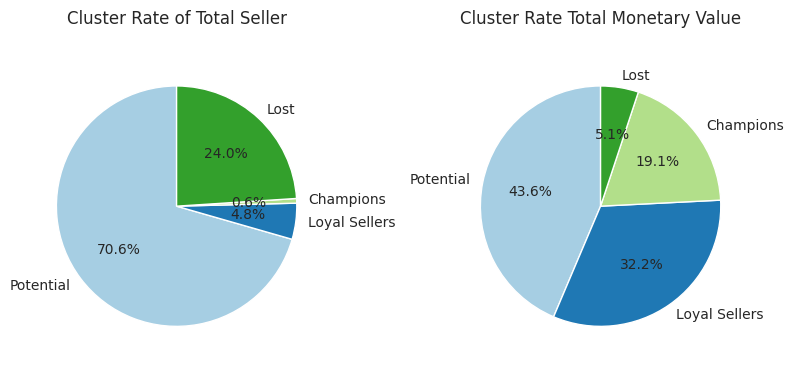

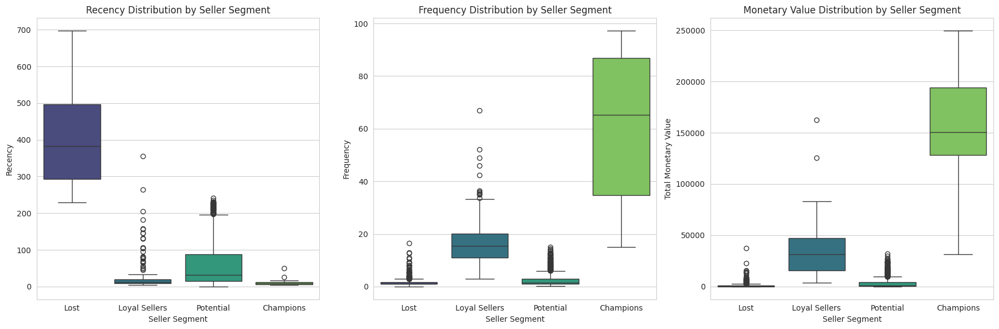

In [ ]:
# Set the style for plots
sns.set_style("whitegrid")

# 1. Summary Statistics for Each Segment
segment_summary = (
    Newdf.groupby('Cluster Name K-Means')
    .agg(
        Total_Sellers=('Seller ID', 'nunique'),
        Avg_Recency=('Recency', 'mean'),
        Avg_Frequency=('Frequency', 'mean'),
        Total_Frequency=('Frequency', 'sum'),
        Total_Monetary_Value=('Order Value per Product', 'sum')
    )
    .reset_index()
)

# Calculate percentage contribution of each segment to Total Monetary Value
total_value = segment_summary['Total_Monetary_Value'].sum()
segment_summary['Percentage of Monetary Value'] = (
    segment_summary['Total_Monetary_Value'] / total_value * 100
)

# # Print the summary statistics
# print("Summary Statistics by Segment:")
# print(segment_summary)

# Calculate total sellers per cluster
cluster_seller_counts = Newdf_seller.groupby('Cluster Name K-Means').agg(
                                                                total_seller=('seller_count','sum'),
                                                                total_omzet = ('total_omzet','sum')).reset_index().sort_values(by='total_omzet',ascending=False)

# Calculate the total number of sellers
total_sellers = cluster_seller_counts['total_seller'].sum()
total_omzet = cluster_seller_counts['total_omzet'].sum()

# Calculate the cluster rate per seller (in percentage)
cluster_seller_counts['seller_rate']  = (cluster_seller_counts['total_seller'] / total_sellers) * 100
cluster_seller_counts['omzet_rate']  = (cluster_seller_counts['total_omzet'] / total_omzet) * 100

# Create pie charts
fig, axs = plt.subplots(1, 2, figsize=(8, 4))
axs[0].pie(
    cluster_seller_counts['total_seller'],
    labels=cluster_seller_counts['Cluster Name K-Means'],
    autopct='%1.1f%%',
    startangle=90,
    colors=plt.cm.Paired.colors)
axs[0].set_title('Cluster Rate of Total Seller')
axs[0].axis('equal')

axs[1].pie(
    cluster_seller_counts['total_omzet'],
    labels=cluster_seller_counts['Cluster Name K-Means'],
    autopct='%1.1f%%',
    startangle=90,
    colors=plt.cm.Paired.colors)
axs[1].set_title('Cluster Rate Total Monetary Value')
axs[1].axis('equal')

plt.tight_layout()
plt.show()

# 3. Box Plots for Recency, Frequency, and Monetary Value
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Recency Box Plot
sns.boxplot(
    data=CompleteRFM,
    x='Cluster Name K-Means',
    y='Recency',
    palette='viridis',
    ax=axes[0],
    hue='Cluster Name K-Means'
)
axes[0].set_title('Recency Distribution by Seller Segment')
axes[0].set_xlabel('Seller Segment')
axes[0].set_ylabel('Recency')

# Frequency Box Plot
sns.boxplot(
    data=CompleteRFM,
    x='Cluster Name K-Means',
    y='Frequency',
    palette='viridis',
    ax=axes[1],
    hue='Cluster Name K-Means'
)
axes[1].set_title('Frequency Distribution by Seller Segment')
axes[1].set_xlabel('Seller Segment')
axes[1].set_ylabel('Frequency')

# Monetary Value Box Plot
sns.boxplot(
    data=CompleteRFM,
    x='Cluster Name K-Means',
    y='Total Monetary Value',
    palette='viridis',
    ax=axes[2],
    hue='Cluster Name K-Means'
)
axes[2].set_title('Monetary Value Distribution by Seller Segment')
axes[2].set_xlabel('Seller Segment')
axes[2].set_ylabel('Total Monetary Value')

plt.tight_layout()
plt.show()

**Observation**
- Although Champions make up only 0.6% of sellers, they contribute a significant portion of the revenue (19.1%). Retaining and expanding this group is crucial.
- Loyal Sellers punch above their weight in terms of revenue contribution (32.2% of revenue out of only 4.8% of sellers). Efforts to upgrade these sellers into Champions could yield high returns.
- Potential Sellers forms the majority (70.6% of sellers) but contribute less proportionally (43.6% of revenue). They could be looked into in order to improve our product to convince them to use Olist more often in their operations.
- Lost Sellers (making up 24.0% of Sellers) contribute minimally to revenue. Understanding the reasons for their disengagement is key to improving platform performance.

This phenomenon of low transaction frequency and high recency indicates a risk of declining seller retention, as shown by the cohort analysis. Furthermore, as shown in the bar chart above, the majority of Olist's total order value comes from Potential sellers. It is crucial to investigate this further the factors.

So it can be concluded that:
- Champions make the most money per seller count.
- Loyal Sellers can be made to partner with us even more, making more money per seller count.
- Potential Sellers need to be convinced to more frequently use Olist for their sales.
- Lost Sellers must be studied to better understand problems in our services.

In [ ]:
# Calculate percentage within each cluster and state category
percentages_seller = (Newdf_seller.groupby(['state_category', 'Cluster Name K-Means', 'state_full_name'])['seller_count']
                      .apply(lambda x: 100 * x / x.sum())
                      .reset_index(name='percentage'))

percentages_omzet = (Newdf_seller.groupby(['state_category', 'Cluster Name K-Means', 'state_full_name'])['total_omzet']
                     .apply(lambda x: 100 * x / x.sum())
                     .reset_index(name='percentage'))

cluster_seller = Newdf_seller.merge(percentages_seller, on=['state_category', 'Cluster Name K-Means', 'state_full_name'])
cluster_omzet = Newdf_seller.merge(percentages_omzet, on=['state_category', 'Cluster Name K-Means', 'state_full_name'])

state_categories = ['Urban', 'Suburban', 'Rural']

# Create subplot sunburst chart
fig = make_subplots(rows=2, cols=3, specs=[[{'type': 'domain'}] * 3, [{'type': 'domain'}] * 3],
                    subplot_titles=[f"{state} (Total Seller)" for state in state_categories] +
                                   [f"{state} (Total Monetary Value)" for state in state_categories])

for idx, i in enumerate(state_categories):
    # Filter data for seller count
    filtered_seller = cluster_seller[cluster_seller['state_category'] == i]

    sunburst_seller = px.sunburst(
        filtered_seller,
        path=['state_category', 'Cluster Name K-Means', 'state_full_name'],
        values='seller_count',
        color='Cluster Name K-Means',
        hover_data={'percentage': True}
    )

    # Add seller count sunburst trace to the subplot
    for trace in sunburst_seller['data']:
        fig.add_trace(trace, row=1, col=idx + 1)

    # Filter data for omzet
    filtered_omzet = cluster_omzet[cluster_omzet['state_category'] == i]

    sunburst_omzet = px.sunburst(
        filtered_omzet,
        path=['state_category', 'Cluster Name K-Means', 'state_full_name'],
        values='total_omzet',
        color='Cluster Name K-Means',
        hover_data={'percentage': True}
    )

    # Add omzet sunburst trace to the subplot
    for trace in sunburst_omzet['data']:
        fig.add_trace(trace, row=2, col=idx + 1)

# Update layout for titles
fig.update_layout(
    title_text="Total Sellers and Monetary Value per Area (Urban, Suburban, Rural)",
    showlegend=False,
    height=800
)

fig.show()

**Observation**
- Most sellers in all states are in the Potential category, representing a significant opportunity for growth if activated properly.
- São Paulo boasts the highest revenue and seller count among Urban states.
- Despite their smaller numbers, Champions play a critical role in driving revenue, especially in Urban and Suburban areas.
- Lost Sellers compose a high percentage of sellers but contribute very little to revenue, especially in Rural areas.

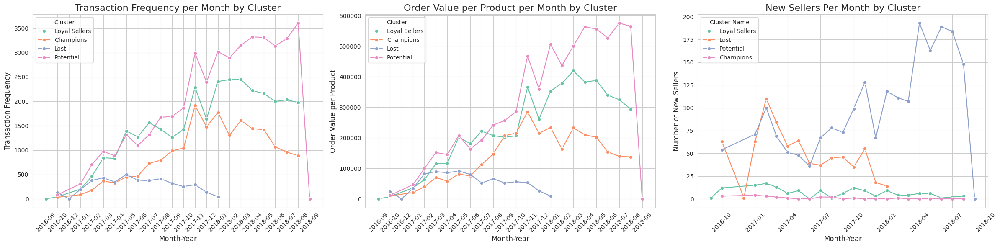

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(24, 6), sharey=False)

# Plot 1: Transaction Frequency per Month by Cluster
sns.lineplot(
    data=monthly_frequency,
    x='order_month',
    y='order_id',
    hue='Cluster Name K-Means',
    marker='o',
    palette='Set2',
    ax=axes[0]
)
axes[0].set_title('Transaction Frequency per Month by Cluster', fontsize=16)
axes[0].set_xlabel('Month-Year', fontsize=12)
axes[0].set_ylabel('Transaction Frequency', fontsize=12)
axes[0].tick_params(axis='x', rotation=45)
axes[0].legend(title='Cluster', loc='upper left', fontsize=10)

# Plot 2: Order Value per Product per Month by Cluster
sns.lineplot(
    data=monthly_monetary_value,
    x='order_month',
    y='Order Value per Product',
    hue='Cluster Name K-Means',
    marker='o',
    palette='Set2',
    ax=axes[1]
)
axes[1].set_title('Order Value per Product per Month by Cluster', fontsize=16)
axes[1].set_xlabel('Month-Year', fontsize=12)
axes[1].set_ylabel('Order Value per Product', fontsize=12)
axes[1].tick_params(axis='x', rotation=45)
axes[1].legend(title='Cluster', loc='upper left', fontsize=10)

# Plot 3: New Sellers Per Month by Cluster
sns.lineplot(
    data=all_clusters_analysis_df,
    x='Month',
    y='New Sellers',
    hue='Cluster Name',
    marker='o',
    palette='Set2',
    ax=axes[2]
)
axes[2].set_title('New Sellers Per Month by Cluster', fontsize=16)
axes[2].set_xlabel('Month-Year', fontsize=12)
axes[2].set_ylabel('Number of New Sellers', fontsize=12)
axes[2].tick_params(axis='x', rotation=45)
axes[2].legend(title='Cluster Name', loc='upper left', fontsize=10)

# Adjust layout
plt.tight_layout()
plt.show()


**Observation**

- All segments, except 'Lost,' show a relatively growing transaction frequency. However, in 2018, 'Loyal Sellers' and 'Champions' exhibit a declining trend, whereas 'Potential' sellers demonstrate the opposite. This trend requires further investigation.
- Similar to transaction frequency, the order value of 'Potential' sellers shows an increasing trend, while 'Champions' and 'Loyal Sellers' exhibit a declining trend in 2018.
- The Potential segment is experiencing growth in new sellers, while the number of Champions and Loyal Sellers remains stagnant.

Consequently, these new sellers are overtaking the market from Loyal Sellers and Champions, who have been on Olist for a longer time. Further investigation is needed to identify the factors enabling Potential sellers to capture the existing market.

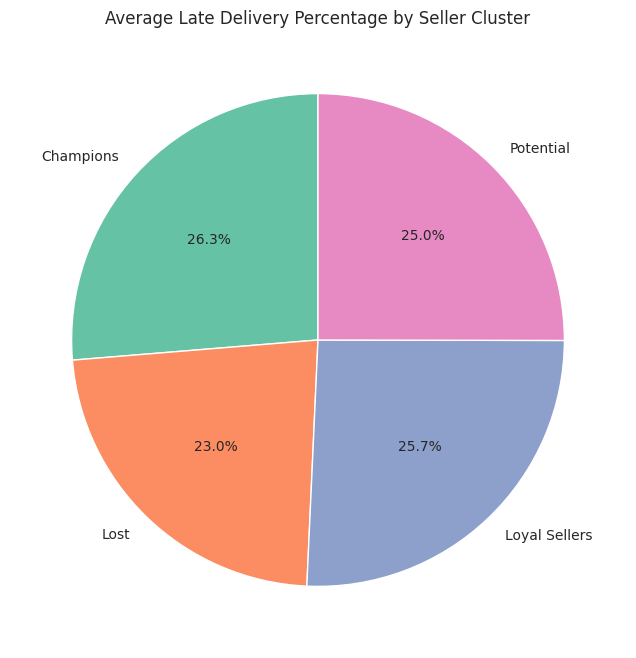

In [ ]:
dfcleaned[dfcleaned['order_delivered_customer_date'] == pd.to_datetime('2000/11/11', format = '%Y/%m/%d')]['is_delivery_late'].value_counts()
LatenessChecker = dfcleaned.groupby(['Seller ID','order_id','order_delivered_customer_date']).agg({'is_delivery_late':'first'}).reset_index()

DeliveryResultOrganizer = LatenessChecker.groupby('Seller ID')['is_delivery_late'].agg(
    On_Time_Count=lambda x: (x == 'On Time').sum(),
    Late_Count=lambda x: (x == 'Late').sum(),
    Unknown_Count=lambda x: (x == 'Unknown').sum()
).reset_index()

DeliveryResultOrganizer['On Time Percentage'] = DeliveryResultOrganizer['On_Time_Count'] / (
    DeliveryResultOrganizer['On_Time_Count'] + DeliveryResultOrganizer['Late_Count'] + DeliveryResultOrganizer['Unknown_Count']
)
DeliveryResultOrganizer = DeliveryResultOrganizer.merge(CompleteRFM[['Seller ID','Cluster Name K-Means']], on = 'Seller ID', how = 'left')
DeliveryResultOrganizer

# Step 1: Calculate Late Percentage
DeliveryResultOrganizer['Late Percentage'] = DeliveryResultOrganizer['Late_Count'] / (
    DeliveryResultOrganizer['On_Time_Count'] + DeliveryResultOrganizer['Late_Count'] + DeliveryResultOrganizer['Unknown_Count']
)

# Step 2: Aggregate Late Percentage by Cluster
cluster_late_percentage = DeliveryResultOrganizer.groupby('Cluster Name K-Means')['Late Percentage'].mean().reset_index()

# Step 3: Create Pie Chart using matplotlib.pyplot
plt.figure(figsize=(8, 8))
plt.pie(cluster_late_percentage['Late Percentage'], labels=cluster_late_percentage['Cluster Name K-Means'], autopct='%1.1f%%', startangle=90, colors=sns.color_palette('Set2'))
plt.title('Average Late Delivery Percentage by Seller Cluster')
plt.show()

**Observation**

As we can see from pie chart above, the late deliveries distributed fairly accross all segments.

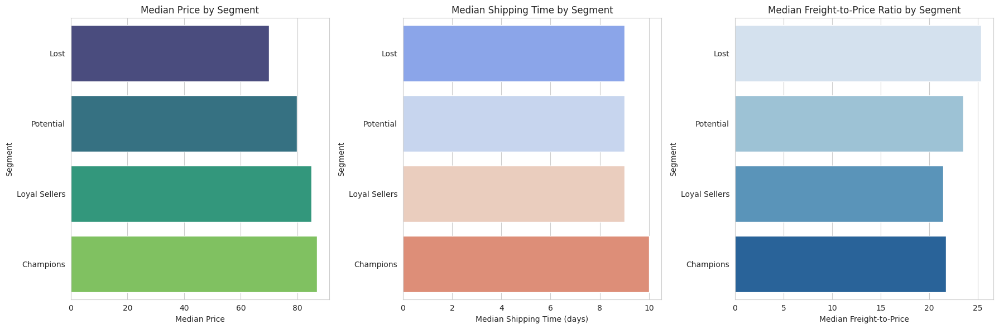

In [ ]:
# Step 1: Calculate shipping time by subtracting 'order_approved_at' from 'order_delivered_customer_date'
Newdf['order_approved_at'] = pd.to_datetime(Newdf['order_approved_at'])
Newdf['order_delivered_customer_date'] = pd.to_datetime(Newdf['order_delivered_customer_date'])

# Calculate the shipping time in days
Newdf['shipping_time'] = (Newdf['order_delivered_customer_date'] - Newdf['order_approved_at']).dt.days

# Step 2: Analyze the average price, shipping time, and freight-to-price ratio by segment
segment_comparison = Newdf.groupby('Cluster Name K-Means').agg(
    avg_price=('price', 'median'),
    avg_shipping_time=('shipping_time', 'median'),
    avg_freight_to_price=('Ratio Freight-to-Price', 'median')
).reset_index()

# Step 3: Sort by price for clearer comparison
segment_comparison_sorted = segment_comparison.sort_values(by='avg_price', ascending=True)

# Step 4: Visualize the comparison of average prices, shipping time, and freight-to-price ratio by segment
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Bar plot for Average Price by Segment
sns.barplot(x='avg_price', y='Cluster Name K-Means',hue='Cluster Name K-Means', data=segment_comparison_sorted, palette='viridis', ax=axes[0])
axes[0].set_title("Median Price by Segment")
axes[0].set_xlabel('Median Price')
axes[0].set_ylabel('Segment')

# Bar plot for Average Shipping Time by Segment
sns.barplot(x='avg_shipping_time', y='Cluster Name K-Means',hue='Cluster Name K-Means', data=segment_comparison_sorted, palette='coolwarm', ax=axes[1])
axes[1].set_title("Median Shipping Time by Segment")
axes[1].set_xlabel('Median Shipping Time (days)')
axes[1].set_ylabel('Segment')

# Bar plot for Average Freight-to-Price Ratio by Segment
sns.barplot(x='avg_freight_to_price', y='Cluster Name K-Means', hue='Cluster Name K-Means',data=segment_comparison_sorted, palette='Blues', ax=axes[2])
axes[2].set_title("Median Freight-to-Price Ratio by Segment")
axes[2].set_xlabel('Median Freight-to-Price')
axes[2].set_ylabel('Segment')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

# Step 5: Compare 'At Risk' segment with other segments
at_risk_segment = segment_comparison_sorted[
    segment_comparison_sorted['Cluster Name K-Means'] == 'At Risk'
]

**Observation**

As we can see, Potential sellers sold relatively cheaper goods than Loyal Sellers and Champions.

## Product Sold by Each Segment

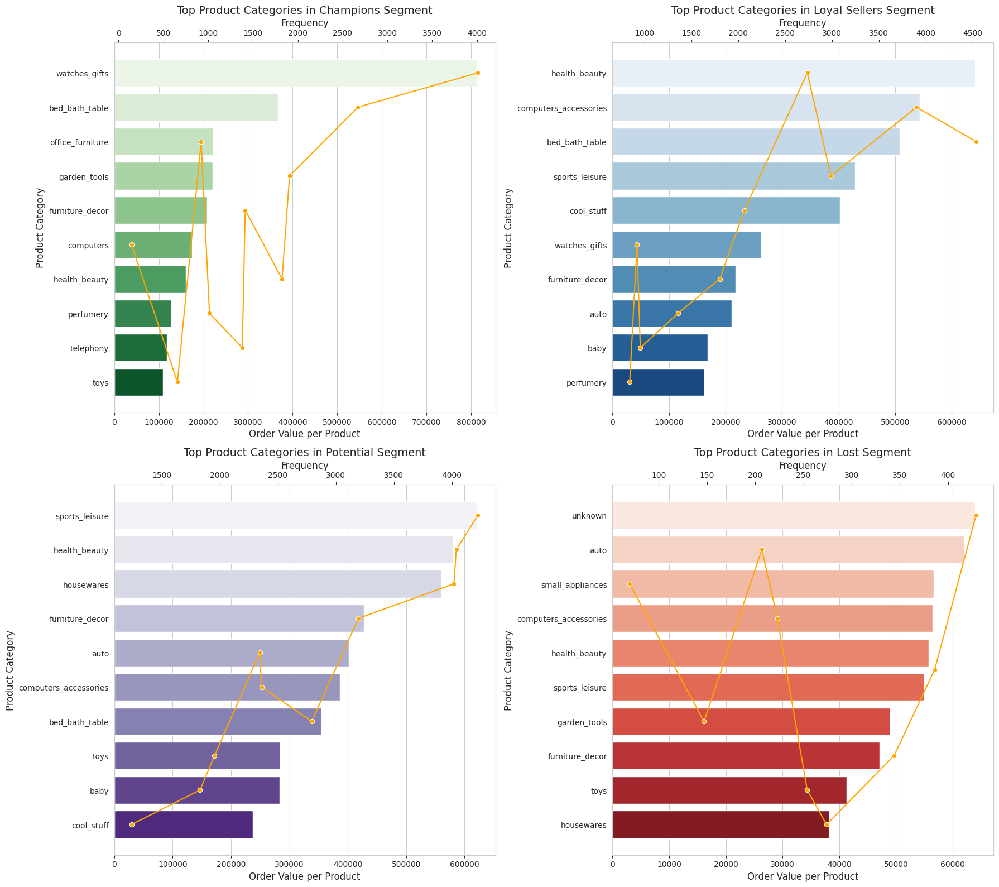

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Replace 'At Risk' with 'Potential'
Newdf['Cluster Name K-Means'] = Newdf['Cluster Name K-Means'].replace('At Risk', 'Potential')

# Step 1: Filter for 'Champions', 'Loyal Sellers', 'Potential', and 'Lost' segments
selected_segments = Newdf[Newdf['Cluster Name K-Means'].isin(['Champions', 'Loyal Sellers', 'Potential', 'Lost'])]

# Step 2: Group by product category and seller segment, and calculate Order Value per Product and Frequency
product_order_analysis = selected_segments.groupby(['product_category_name_english', 'Cluster Name K-Means']).agg(
    total_order_value=('Order Value per Product', 'sum'),
    frequency=('product_id', 'count')
).reset_index()

# Step 3: Exclude products with zero monetary value and frequency
product_order_analysis = product_order_analysis[
    (product_order_analysis['total_order_value'] > 0) & (product_order_analysis['frequency'] > 0)
]

# Step 4: Define the top N product categories for each segment
top_n = 10
top_products_champions = product_order_analysis[
    product_order_analysis['Cluster Name K-Means'] == 'Champions'
].nlargest(top_n, 'total_order_value')

top_products_loyal = product_order_analysis[
    product_order_analysis['Cluster Name K-Means'] == 'Loyal Sellers'
].nlargest(top_n, 'total_order_value')

top_products_potential = product_order_analysis[
    product_order_analysis['Cluster Name K-Means'] == 'Potential'
].nlargest(top_n, 'total_order_value')

top_products_lost = product_order_analysis[
    product_order_analysis['Cluster Name K-Means'] == 'Lost'
].nlargest(top_n, 'total_order_value')

# Step 5: Create a 2x2 grid for combined plots
fig, axes = plt.subplots(2, 2, figsize=(18, 16))

# Function to create combined bar and line charts
def plot_combined(ax, data, title, palette, color_line):
    sns.barplot(
        data=data,
        x='total_order_value',
        y='product_category_name_english',
        hue='product_category_name_english',  # Assigning `y` variable to `hue`
        dodge=False,  # Ensures no grouping for the `hue`
        palette=palette,
        ax=ax
    )
    ax.set_title(title, fontsize=14)
    ax.set_xlabel('Order Value per Product', fontsize=12)
    ax.set_ylabel('Product Category', fontsize=12)

    # Add secondary x-axis for frequency
    ax2 = ax.twiny()
    sns.lineplot(
        data=data,
        x='frequency',
        y='product_category_name_english',
        color=color_line,
        marker='o',
        ax=ax2
    )
    ax2.set_xlabel('Frequency', fontsize=12)
    ax2.grid(False)

# Champions segment
plot_combined(
    axes[0, 0],
    top_products_champions,
    "Top Product Categories in Champions Segment",
    "Greens",
    "orange"
)

# Loyal Sellers segment
plot_combined(
    axes[0, 1],
    top_products_loyal,
    "Top Product Categories in Loyal Sellers Segment",
    "Blues",
    "orange"
)

# Potential segment
plot_combined(
    axes[1, 0],
    top_products_potential,
    "Top Product Categories in Potential Segment",
    "Purples",
    "orange"
)

# Lost segment
plot_combined(
    axes[1, 1],
    top_products_lost,
    "Top Product Categories in Lost Segment",
    "Reds",
    "orange"
)

# Adjust layout for better display
plt.tight_layout()
plt.show()


**Observation**

As shown in the graph and table above, these are the top products sold by sellers across all four segments. We can see that 'Loyal Sellers' and 'Potential' sellers are selling relatively similar product categories. However, in the clustering results, 'Potential' sellers have worse RFM scores compared to 'Loyal Sellers'. We need to investigate further why 'Potential' sellers fall into a lower-performing cluster despite selling similar product categories.

Based on RFM score, 'Loyal Sellers' have a average higher frequency of products sold per seller compared to 'Potential' sellers, even though they are selling the same product categories.

- Higher Frequency for Loyal Sellers: Loyal Sellers are selling more frequently compared to Potential sellers. This suggests that Loyal Sellers have a more consistent or effective selling strategy, possibly due to better customer retention, marketing, or operational efficiency.
- Larger Number of Potential Sellers: The large number of Potential sellers, combined with their lower frequency per seller, points to a saturated market. This is likely because many sellers are competing for similar customer segments, leading to reduced visibility and sales opportunities for individual sellers.

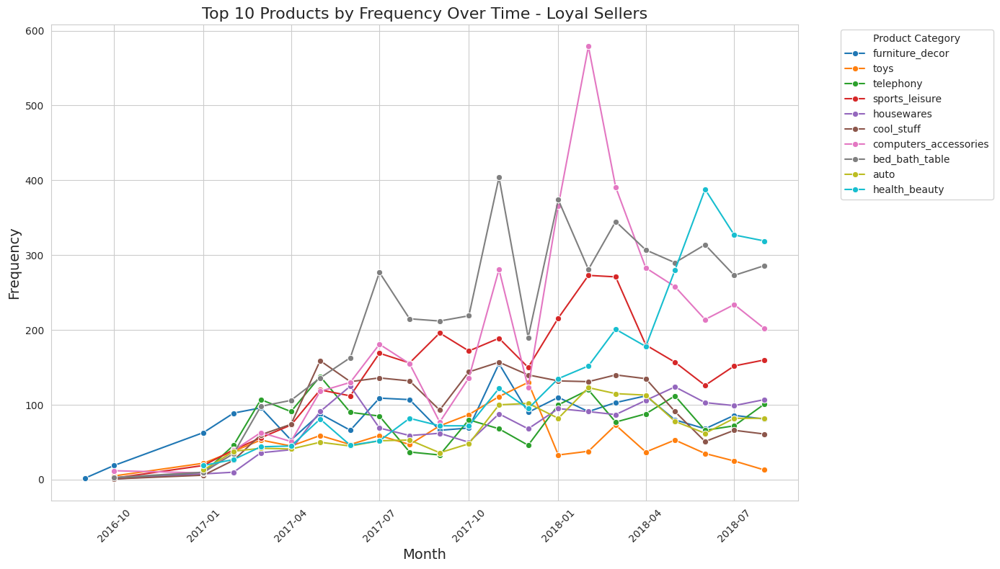

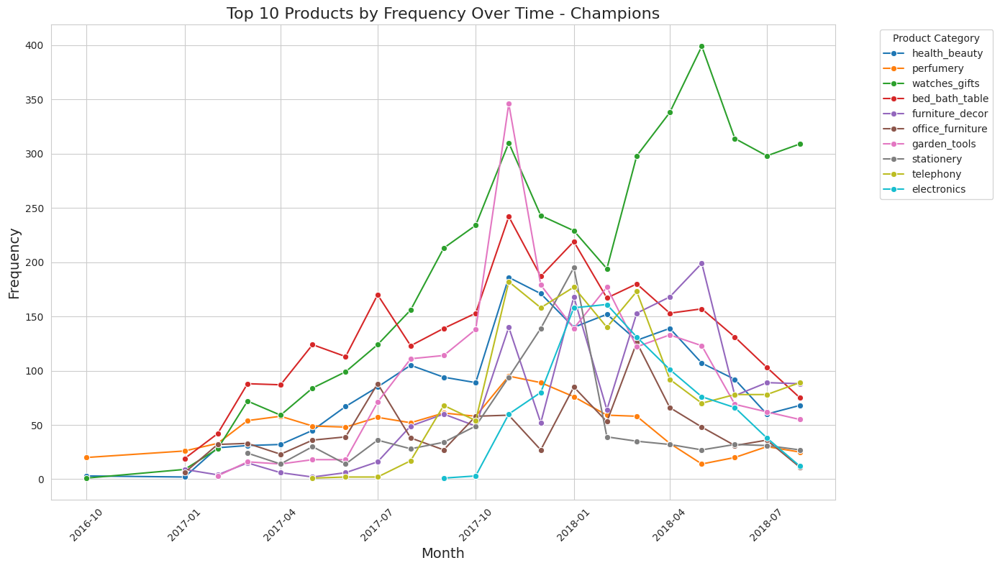

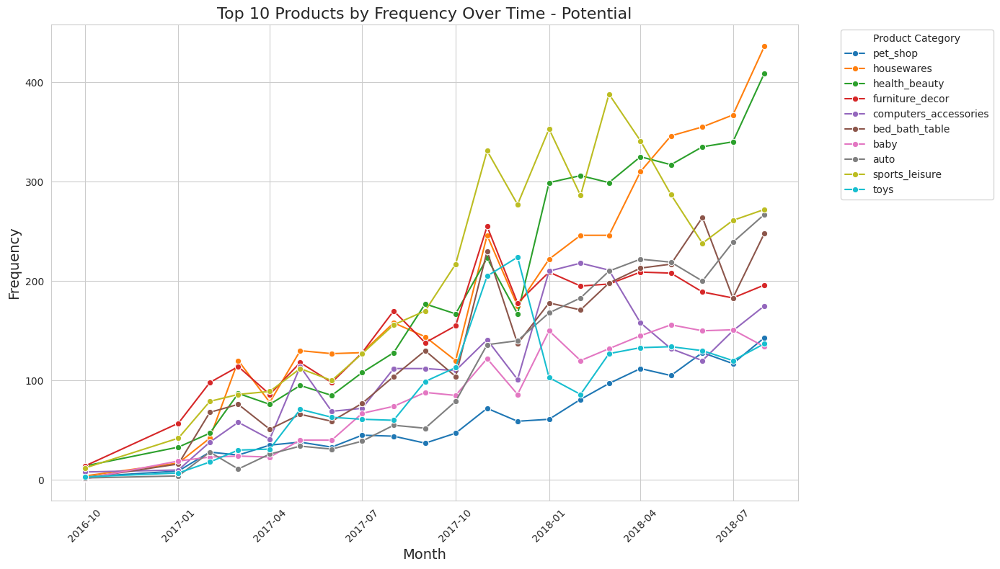

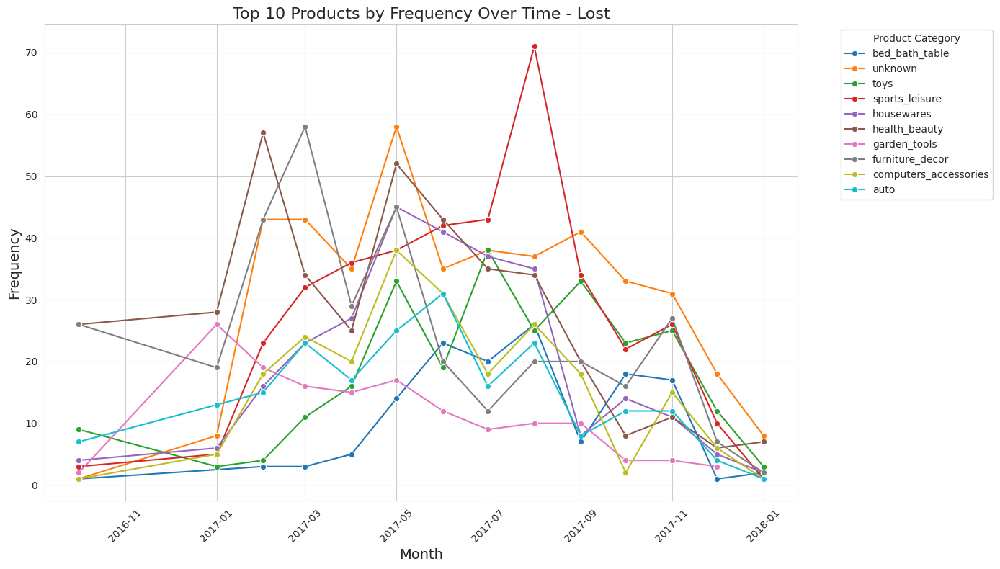

In [ ]:
# Step 1: Ensure 'order_year_month' is in the DataFrame
if 'order_year_month' not in Newdf.columns:
    Newdf['order_year_month'] = pd.to_datetime(Newdf['order_purchase_timestamp']).dt.to_period('M').astype(str)

# Step 2: Group data to calculate the frequency of products per cluster and month
product_frequency = Newdf.groupby(['Cluster Name K-Means', 'order_year_month', 'product_category_name_english']).agg(
    product_frequency=('order_id', 'count')
).reset_index()

# Step 3: Identify the top 10 products by frequency for each cluster
top_products_per_cluster = (
    product_frequency.groupby(['Cluster Name K-Means', 'product_category_name_english'])['product_frequency']
    .sum()
    .reset_index()
    .sort_values(by=['Cluster Name K-Means', 'product_frequency'], ascending=[True, False])
    .groupby('Cluster Name K-Means')
    .head(10)
)

# Step 4: Filter the dataset to include only the top products for each cluster
filtered_product_frequency = product_frequency.merge(
    top_products_per_cluster[['Cluster Name K-Means', 'product_category_name_english']],
    on=['Cluster Name K-Means', 'product_category_name_english'],
    how='inner'
)

# Step 5: Ensure 'order_year_month' is properly formatted as datetime
filtered_product_frequency['order_year_month'] = pd.to_datetime(
    filtered_product_frequency['order_year_month'], errors='coerce', format='%Y-%m'
)
filtered_product_frequency = filtered_product_frequency.sort_values(by='order_year_month')

# Step 6: Plot separate graphs for each cluster
clusters = filtered_product_frequency['Cluster Name K-Means'].unique()
for cluster in clusters:
    plt.figure(figsize=(14, 8))
    cluster_data = filtered_product_frequency[filtered_product_frequency['Cluster Name K-Means'] == cluster]
    sns.lineplot(
        data=cluster_data,
        x='order_year_month',
        y='product_frequency',
        hue='product_category_name_english',
        marker='o'
    )

    # Step 7: Customize the plot
    plt.title(f'Top 10 Products by Frequency Over Time - {cluster}', fontsize=16)
    plt.xlabel('Month', fontsize=14)
    plt.ylabel('Frequency', fontsize=14)
    plt.xticks(rotation=45)
    plt.legend(title='Product Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


**Observation**

As we know, the 'Potential' segment primarily consists of new sellers. The frequency of certain top products sold by the 'Champions' and 'Loyal Sellers' segments is declining due to the growing number of 'Potential' sellers. This decline is because 'Potential' sellers tend to sell the same product categories. However, these products are experiencing an increase in frequency specifically from 'Potential' sellers.

## Seasonality and Order Trends

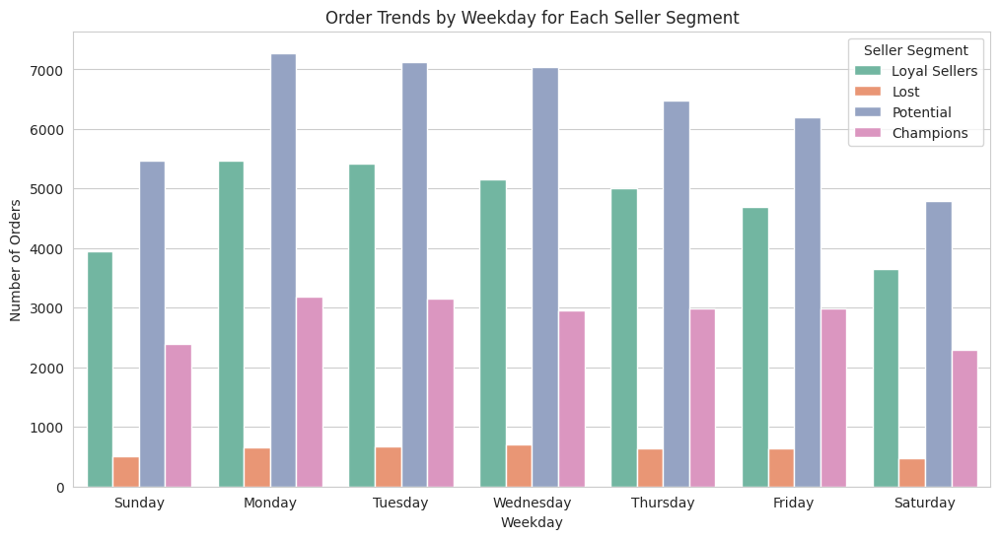

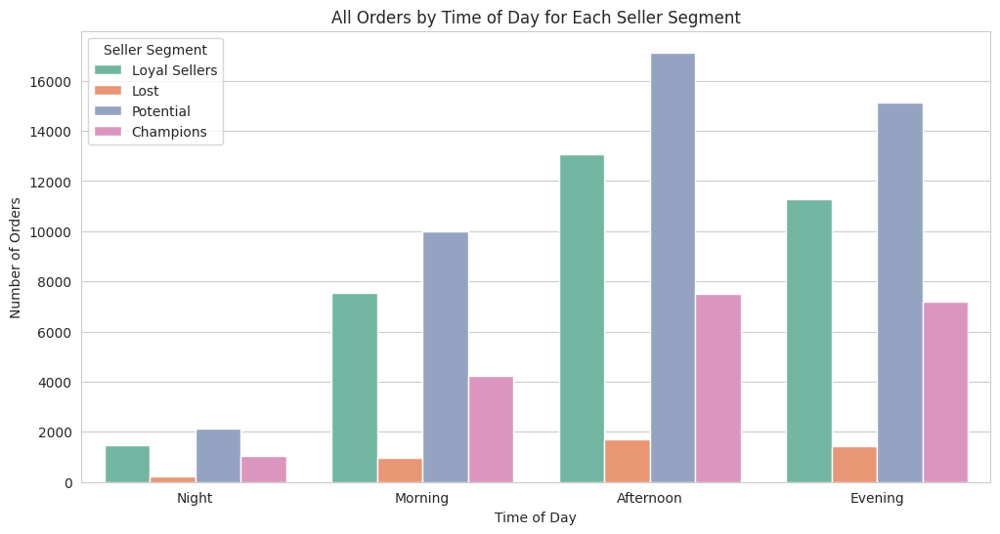

In [ ]:
# Step 1: Merge dfcleaned with CompleteRFM to get seller segments and cluster names
dfcleaned = dfcleaned.merge(CompleteRFM[['Seller ID', 'Seller_Segment_Manual_RFM', 'K-Means Cluster', 'Cluster Name K-Means']],
                            on='Seller ID', how='left')

# 1.1: Analyze Order Trends by Seller Segment (Order Trends Weekdays)

# Order Trends by Weekdays
plt.figure(figsize=(12, 6))
sns.countplot(data=dfcleaned, x='order_weekdays', hue='Cluster Name K-Means', palette='Set2')
plt.title('Order Trends by Weekday for Each Seller Segment')
plt.xlabel('Weekday')
plt.ylabel('Number of Orders')
plt.legend(title='Seller Segment')
plt.show()

# Step 2: Time of Day Analysis - Investigate how time of day correlates with high-value transactions

# Convert time_of_day to a categorical variable for easier interpretation (if not already)
dfcleaned['time_of_day'] = pd.cut(dfcleaned['order_hour'],
                                  bins=[0, 6, 12, 18, 24],
                                  labels=['Night', 'Morning', 'Afternoon', 'Evening'],
                                  right=False)

# Step 3: Time of Day Analysis - All Orders
plt.figure(figsize=(12, 6))
sns.countplot(data=dfcleaned, x='time_of_day', hue='Cluster Name K-Means', palette='Set2')
plt.title('All Orders by Time of Day for Each Seller Segment')
plt.xlabel('Time of Day')
plt.ylabel('Number of Orders')
plt.legend(title='Seller Segment')
plt.show()


**Observation**

As shown in the graphs above, most goods are purchased in the afternoon, with the majority of transactions occurring during the second quarter of the year. There is no significant difference in the purchase time trends between clusters; all clusters exhibit a tendency for purchases to occur in the afternoon and during Quarter 2.

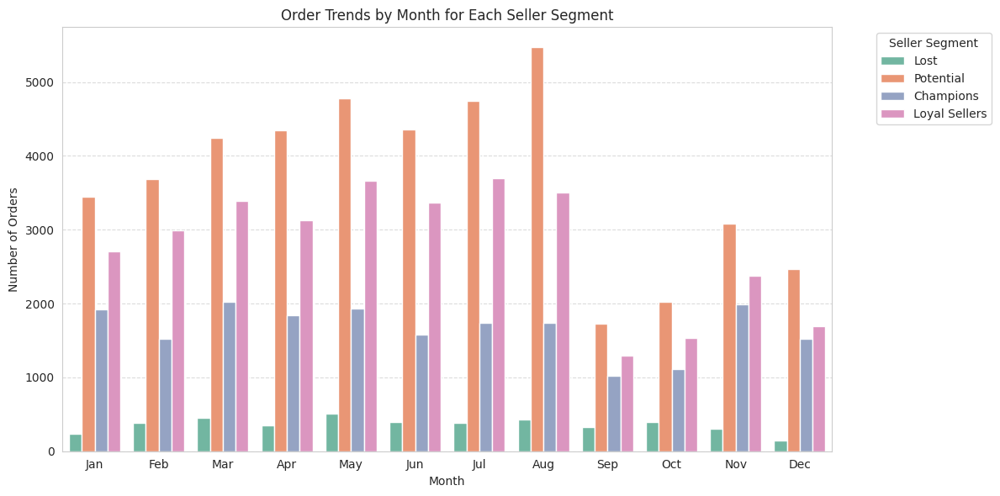

In [ ]:
# Step 1: Extract the month from the order timestamp
dfcleaned['order_month'] = pd.to_datetime(dfcleaned['order_purchase_timestamp']).dt.month

# Step 2: Create a count plot for orders by month
plt.figure(figsize=(12, 6))
sns.countplot(data=dfcleaned, x='order_month', hue='Cluster Name K-Means', palette='Set2')
plt.title('Order Trends by Month for Each Seller Segment')
plt.xlabel('Month')
plt.ylabel('Number of Orders')
plt.legend(title='Seller Segment', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(ticks=range(0, 12), labels=[
    'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
    'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'
])
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


## Order Value per Product vs Freight-to-Price Ratio

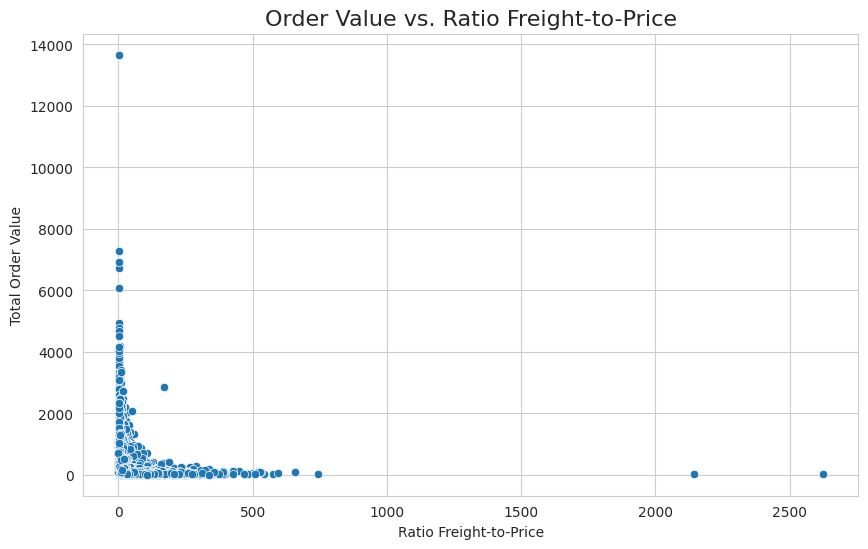

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Ratio Freight-to-Price', y='Order Value per Product', data=dfcleaned)
plt.title('Order Value vs. Ratio Freight-to-Price', fontsize=16)
plt.xlabel('Ratio Freight-to-Price')
plt.ylabel('Total Order Value')
plt.show()


**Observation**

Based on the graph above, there are low order values with a high Freight-to-Price Ratio, meaning that customers have to pay high freight costs relative to the actual value of the goods they purchased.

<ipython-input-135-a44164052f7e>:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




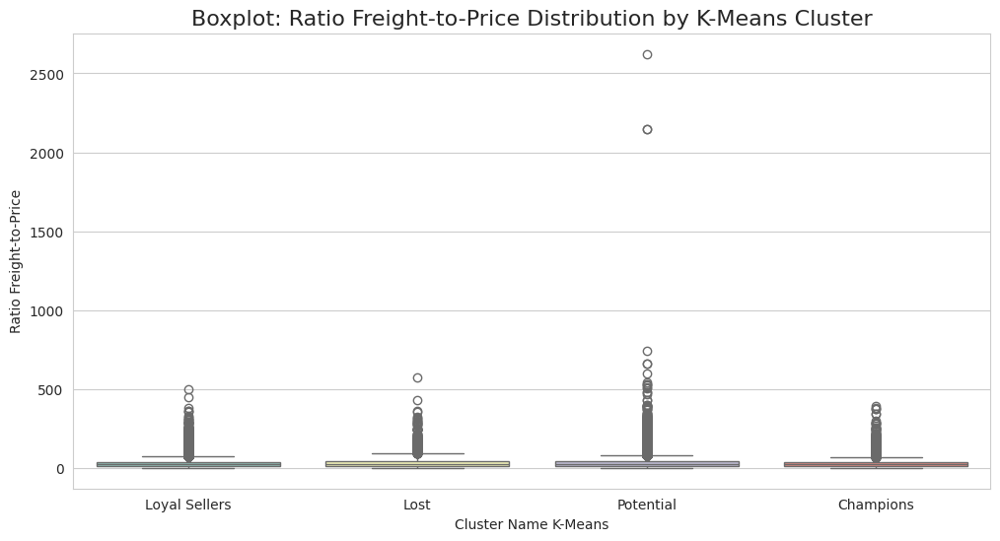

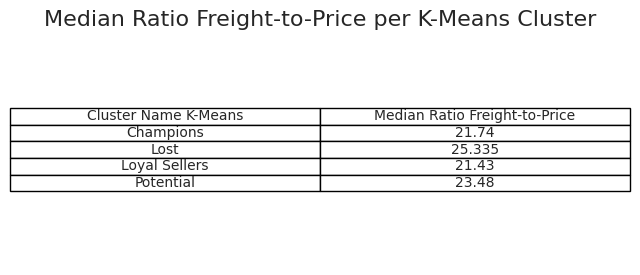

In [ ]:
# Calculate the median of Ratio Freight-to-Price for each cluster
medians = Newdf.groupby('Cluster Name K-Means')['Ratio Freight-to-Price'].median().reset_index()

# Plotting the boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(x='Cluster Name K-Means', y='Ratio Freight-to-Price', data=Newdf, palette='Set3')
plt.title('Boxplot: Ratio Freight-to-Price Distribution by K-Means Cluster', fontsize=16)
plt.xlabel('Cluster Name K-Means')
plt.ylabel('Ratio Freight-to-Price')

# Show the plot
plt.show()

# Create a figure for the median table
fig, ax = plt.subplots(figsize=(8, 3))

# Hide the axis and plot the table
ax.axis('off')
ax.table(cellText=medians.values, colLabels=['Cluster Name K-Means', 'Median Ratio Freight-to-Price'],
        cellLoc='center', loc='center')

# Set the title for the table
plt.title('Median Ratio Freight-to-Price per K-Means Cluster', fontsize=16)

# Display the table
plt.show()


**Observation**

As shown in the table above, the median Freight-to-Price ratio for the 'Potential' and 'Lost' segments is the highest. This means that 'Potential' and 'Lost' customers have to pay relatively high freight costs compared to the value of the goods they purchased. This could explain why these two segments have the lowest RFM scores, as high freight costs may reduce customer willingness to buy, subsequently decreasing the frequency and recency of orders from sellers.

<ipython-input-136-29c6caf58109>:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




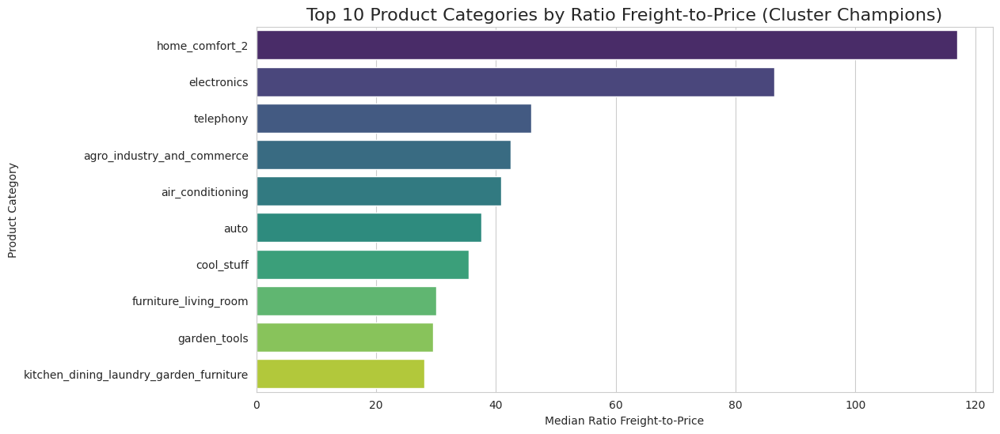

<ipython-input-136-29c6caf58109>:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




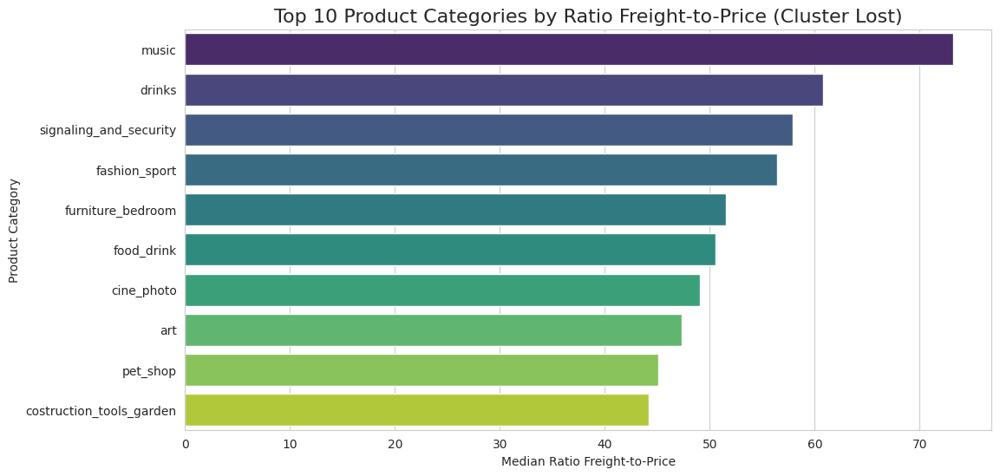

<ipython-input-136-29c6caf58109>:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




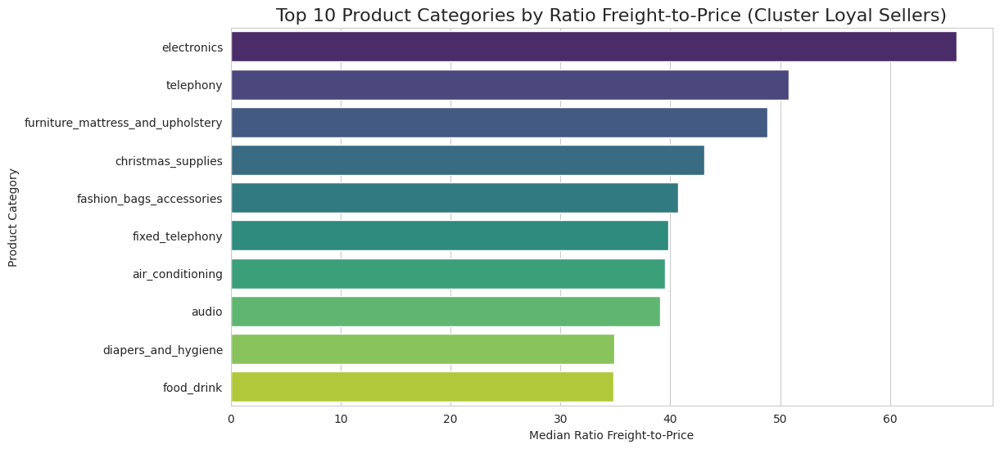

<ipython-input-136-29c6caf58109>:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




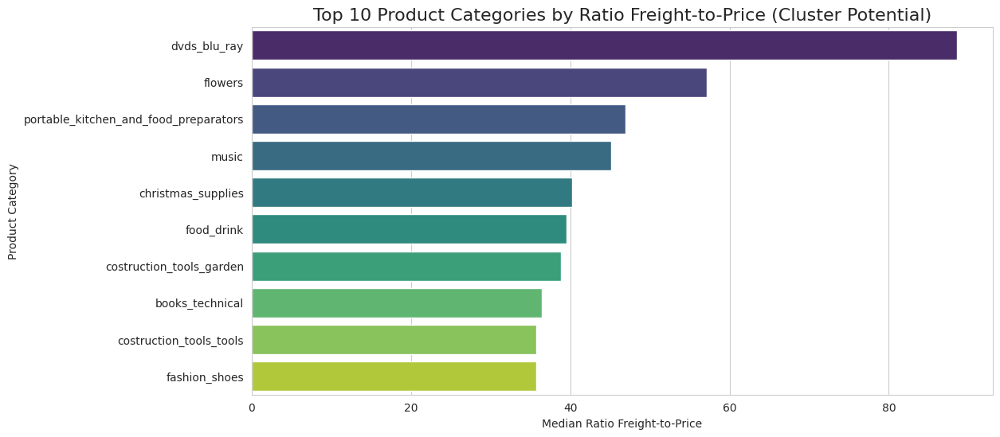

In [ ]:
# Iterate through each K-Means cluster and create a bar plot for the top 10 categories
kmeans_clusters = Newdf['Cluster Name K-Means'].unique()

for cluster in sorted(kmeans_clusters):
    # Filter the data for the current cluster
    cluster_data = Newdf[Newdf['Cluster Name K-Means'] == cluster]

    # Calculate the median Ratio Freight-to-Price for each category in the current cluster
    category_freight_ratio = cluster_data.groupby('product_category_name_english')['Ratio Freight-to-Price'].median().reset_index()

    # Sort the values and select the top 10 categories
    top_10_categories = category_freight_ratio.sort_values(by='Ratio Freight-to-Price', ascending=False).head(10)

    # Create the bar plot
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Ratio Freight-to-Price', y='product_category_name_english', data=top_10_categories, palette='viridis')
    plt.title(f'Top 10 Product Categories by Ratio Freight-to-Price (Cluster {cluster})', fontsize=16)
    plt.xlabel('Median Ratio Freight-to-Price')
    plt.ylabel('Product Category')
    plt.show()


**Observation**

Customers purchasing from Potential sellers face high freight costs relative to the value of smaller goods, such as DVDs, flowers, music, food and drinks, books, and shoes.


## At which RFM points do the sellers appear?

We think that it might also be useful to show at which point in the Recency, Frequency or Monetary Value Score do the sellers of different clusters show up, which can establish the cut-off points for each dimension as chosen by the K-Means clustering process.

<ipython-input-137-f9879eeee1c1>:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

<ipython-input-137-f9879eeee1c1>:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

<ipython-input-137-f9879eeee1c1>:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

<ipython-input-137-f9879eeee1c1>:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False

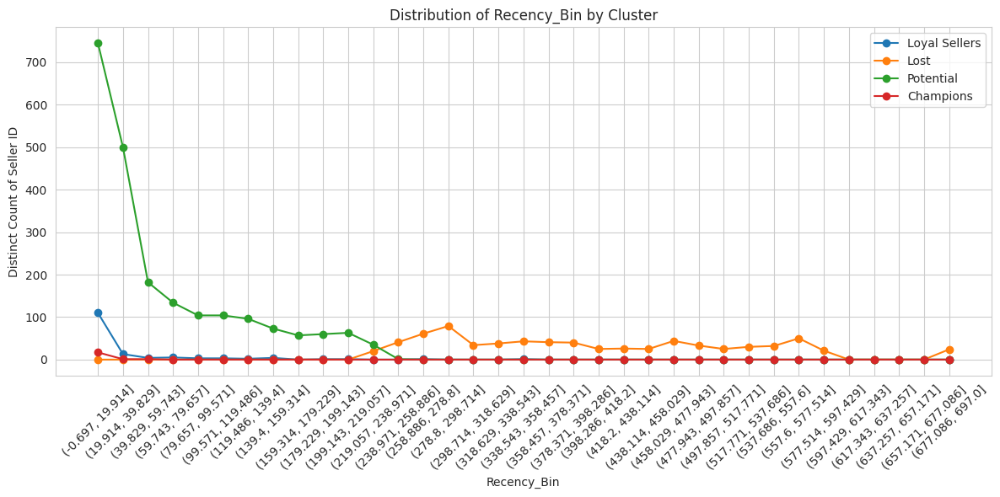

<ipython-input-137-f9879eeee1c1>:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

<ipython-input-137-f9879eeee1c1>:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

<ipython-input-137-f9879eeee1c1>:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

<ipython-input-137-f9879eeee1c1>:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False

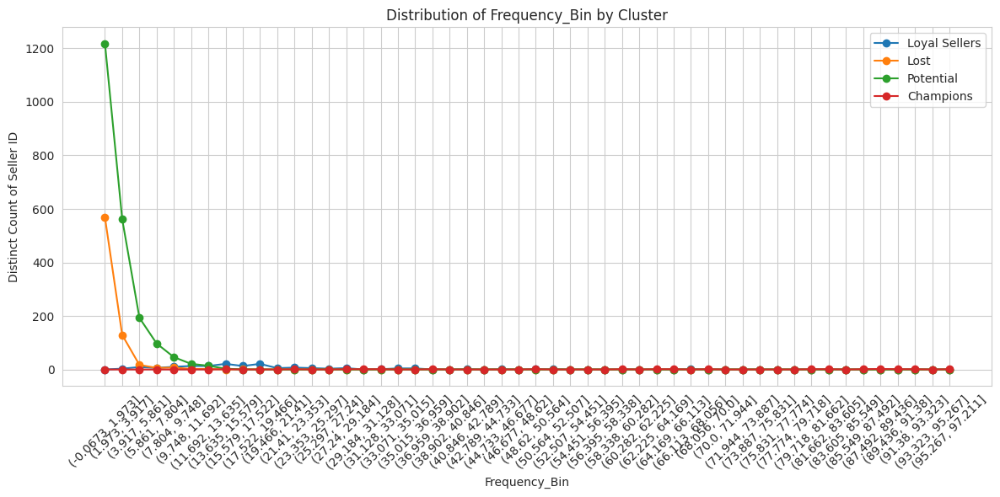

<ipython-input-137-f9879eeee1c1>:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

<ipython-input-137-f9879eeee1c1>:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

<ipython-input-137-f9879eeee1c1>:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

<ipython-input-137-f9879eeee1c1>:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False

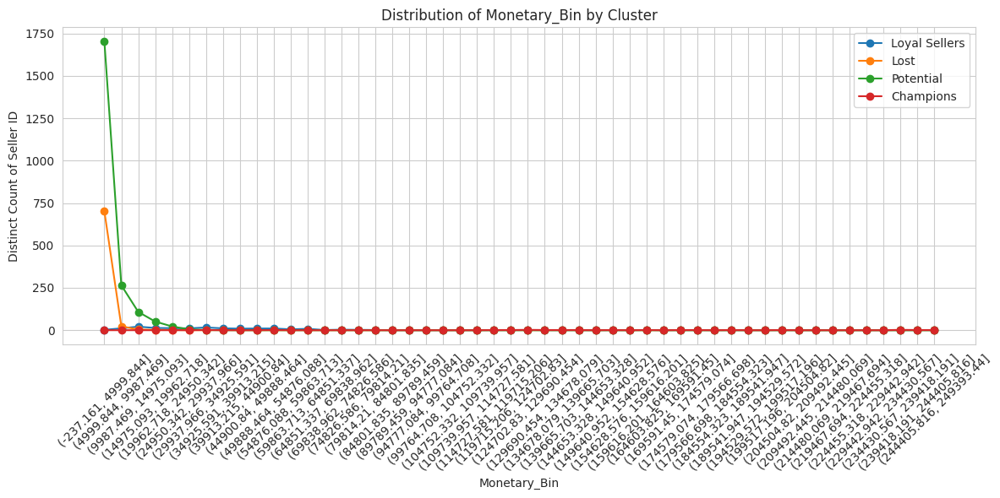

In [ ]:
# prompt: Make bins of Recency, Frequency and Monetary (bins of 20, 2 and 5000, respectively) and make a line graph for each of these three, with each Cluster Name K-Means as its own line, with distinct count of Seller ID in its Y-axis and the respective bins in the X-axis.

def plot_rfm_distributions(df, n_bins_recency=35, n_bins_frequency=50, n_bins_monetary=50):
    # Create bins for Recency, Frequency, and Monetary
    Newdf['Recency_Bin'] = pd.cut(Newdf['Recency'], bins=n_bins_recency)
    Newdf['Frequency_Bin'] = pd.cut(Newdf['Frequency'], bins=n_bins_frequency)
    Newdf['Monetary_Bin'] = pd.cut(Newdf['Total Monetary Value'], bins=n_bins_monetary)

    rfm_metrics = ['Recency_Bin', 'Frequency_Bin', 'Monetary_Bin']

    for metric in rfm_metrics:
      plt.figure(figsize=(12, 6))
      for cluster in Newdf['Cluster Name K-Means'].unique():
          cluster_data = Newdf[Newdf['Cluster Name K-Means'] == cluster]
          counts = cluster_data.groupby(metric)['Seller ID'].nunique()
          plt.plot(counts.index.astype(str), counts.values, label=cluster, marker='o')

      plt.xlabel(metric)
      plt.ylabel('Distinct Count of Seller ID')
      plt.title(f'Distribution of {metric} by Cluster')
      plt.xticks(rotation=45)
      plt.legend()
      plt.tight_layout()
      plt.show()

# Call the function with your DataFrame and desired bin sizes
plot_rfm_distributions(Newdf)

## Average Order Value

Since Potential sellers have lower monetary value, it is important to investigate this further by analyzing their Average Order Value (AOV). Understanding AOV can provide insights into pricing strategies, product offerings, and customer purchasing behavior among Potential sellers. This analysis can help identify potential areas for improvement to boost their monetary performance.

<ipython-input-138-18c3e925d48d>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-138-18c3e925d48d>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



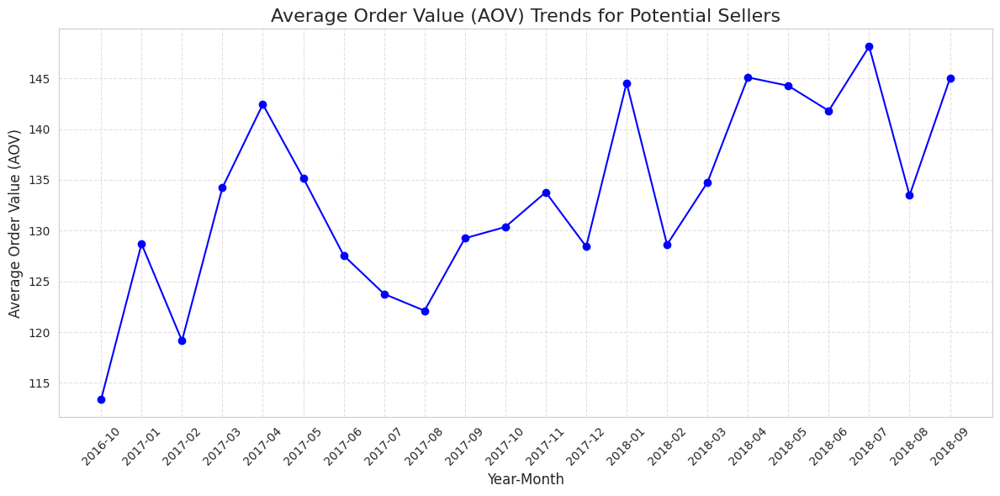

In [ ]:


# Filter for the 'Potential' seller segment
potential_sellers = Newdf[Newdf['Cluster Name K-Means'] == 'Potential']

# Ensure order_purchase_timestamp is in datetime format
potential_sellers['order_purchase_timestamp'] = pd.to_datetime(potential_sellers['order_purchase_timestamp'], errors='coerce')

# Extract Year-Month for AOV trend analysis
potential_sellers['YearMonth'] = potential_sellers['order_purchase_timestamp'].dt.to_period('M')

# Calculate AOV trends
aov_trends = potential_sellers.groupby('YearMonth').agg(
    TotalOrderValue=('price', 'sum'),
    TotalOrders=('order_id', 'nunique')
).reset_index()
aov_trends['AOV'] = aov_trends['TotalOrderValue'] / aov_trends['TotalOrders']

# Plot AOV trends over time
plt.figure(figsize=(12, 6))
plt.plot(aov_trends['YearMonth'].astype(str), aov_trends['AOV'], marker='o', linestyle='-', color='blue')
plt.title('Average Order Value (AOV) Trends for Potential Sellers', fontsize=16)
plt.xlabel('Year-Month', fontsize=12)
plt.ylabel('Average Order Value (AOV)', fontsize=12)
plt.xticks(rotation=45)
plt.grid(visible=True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


**Observation**

As seen in the analysis, the Average Order Value (AOV) for overall sellers shows an increasing trend. This suggests that while the monetary performance of individual segments like Potential sellers may be lower, the general market dynamics indicate a positive trajectory in terms of the value of each transaction.

We have to investigate it further the reason Potential sellers have lower monetary value.

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_mstats_common.py:182: RuntimeWarning:

invalid value encountered in scalar divide

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_mstats_common.py:196: RuntimeWarning:

invalid value encountered in sqrt

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_mstats_common.py:199: RuntimeWarning:

invalid value encountered in scalar divide

<ipython-input-139-17ef7f279264>:22: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



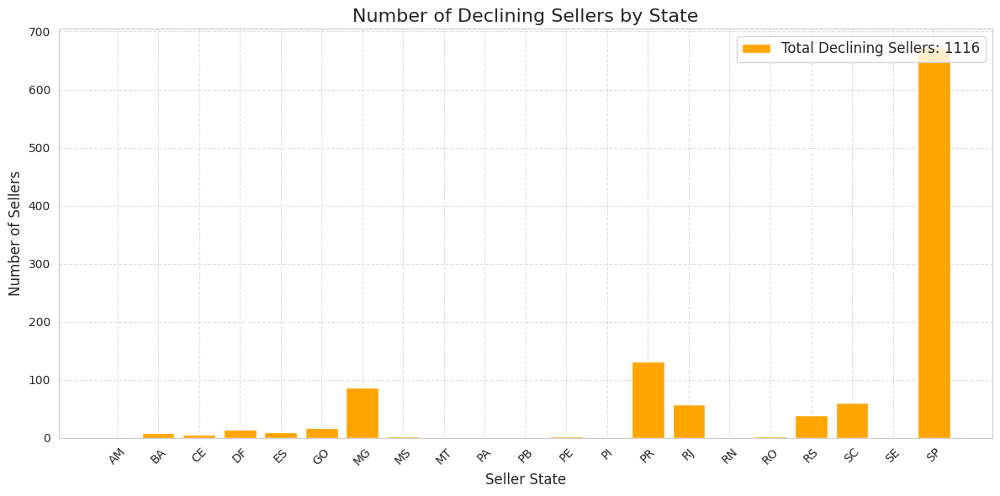

In [ ]:


# Ensure necessary datetime conversion
Newdf['order_purchase_timestamp'] = pd.to_datetime(Newdf['order_purchase_timestamp'], errors='coerce')

# Extract Year-Month for analysis
Newdf['YearMonth'] = Newdf['order_purchase_timestamp'].dt.to_period('M')

# Step 1: Calculate AOV per Seller per Month
seller_aov = Newdf.groupby(['Seller ID', 'YearMonth']).agg(
    TotalOrderValue=('price', 'sum'),
    TotalOrders=('order_id', 'nunique')
).reset_index()
seller_aov['AOV'] = seller_aov['TotalOrderValue'] / seller_aov['TotalOrders']

# Step 2: Analyze AOV Trends for Each Seller
def calculate_aov_trend(seller_data):
    """Calculate the slope of AOV over time for a seller."""
    time = np.arange(len(seller_data))  # Time as a sequence (e.g., 0, 1, 2,...)
    slope, _, _, _, _ = linregress(time, seller_data['AOV'])
    return slope

# Calculate the AOV trend (slope) for each seller
seller_trends = seller_aov.groupby('Seller ID').apply(calculate_aov_trend).reset_index()
seller_trends.columns = ['Seller ID', 'AOV_Slope']

# Step 3: Identify Sellers with Declining AOV
declining_sellers = seller_trends[seller_trends['AOV_Slope'] < 0]

# Step 4: Merge with Seller Information for Analysis
declining_seller_data = declining_sellers.merge(
    Newdf[['Seller ID', 'seller_city', 'seller_state']].drop_duplicates(),
    on='Seller ID',
    how='left'
)

# Step 5: Count Sellers by State
state_seller_count = declining_seller_data.groupby('seller_state').agg(
    NumberOfSellers=('Seller ID', 'nunique')
).reset_index()

# Step 6: Visualize Count of Sellers by State
plt.figure(figsize=(12, 6))
plt.bar(state_seller_count['seller_state'], state_seller_count['NumberOfSellers'], color='orange')
plt.title('Number of Declining Sellers by State', fontsize=16)
plt.xlabel('Seller State', fontsize=12)
plt.ylabel('Number of Sellers', fontsize=12)
plt.xticks(rotation=45)
plt.grid(visible=True, linestyle='--', alpha=0.6)

# Add legend for the total number of declining sellers
total_declining_sellers = len(declining_sellers)
plt.legend([f'Total Declining Sellers: {total_declining_sellers}'], loc='upper right', fontsize=12)

plt.tight_layout()
plt.show()


**Observation**

São Paulo has the highest proportion of sellers experiencing a decline in Average Order Value (AOV). This could indicate that despite the high volume of sellers in this urban area, there may be challenges in maintaining high-value transactions, possibly due to increased competition, price sensitivity, or changes in consumer purchasing behavior. Further investigation into pricing strategies and product categories would be valuable to understand the drivers of this decline.

                             Seller ID product_category_name_english  \
4     013900e863eace745d3ec7614cab5b1a                          baby   
5     013900e863eace745d3ec7614cab5b1a                 fashion_shoes   
6     013900e863eace745d3ec7614cab5b1a                    stationery   
18    0432ead42b6c8a0bdf68154add917fdf                consoles_games   
27    062ce95fa2ad4dfaedfc79260130565f                bed_bath_table   
...                                ...                           ...   
2943  ffc470761de7d0232558ba5e786e57b7                  garden_tools   
2944  ffc470761de7d0232558ba5e786e57b7                    housewares   
2946  ffc470761de7d0232558ba5e786e57b7                sports_leisure   
2947  ffc470761de7d0232558ba5e786e57b7                 watches_gifts   
2952  fffd5413c0700ac820c7069d66d98c89         furniture_living_room   

      AvgPrice  MedianPrice  PriceDifference  
4        54.00        79.90           -25.90  
5        56.80        79.90           -23

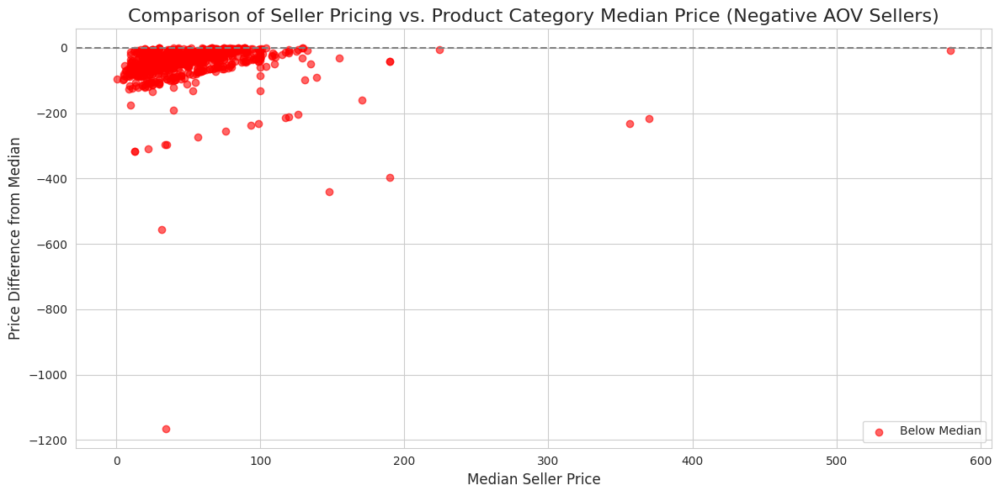

In [ ]:
# Step 1: Calculate Median Price by Product Category
category_median_price = Newdf.groupby('product_category_name_english').agg(
    MedianPrice=('price', 'median')
).reset_index()

# Step 2: Calculate the Average Price for Each Seller by Product Category
seller_avg_price = Newdf.groupby(['Seller ID', 'product_category_name_english']).agg(
    AvgPrice=('price', 'median')
).reset_index()

# Step 3: Merge Sellers with Declining AOV with Their Pricing and Median Pricing
declining_sellers_with_prices = declining_sellers.merge(
    seller_avg_price,
    on='Seller ID',
    how='left'
)

declining_sellers_with_prices = declining_sellers_with_prices.merge(
    category_median_price,
    on='product_category_name_english',
    how='left'
)

# Step 4: Compare Seller's Average Price with Category Median
declining_sellers_with_prices['PriceDifference'] = declining_sellers_with_prices['AvgPrice'] - declining_sellers_with_prices['MedianPrice']

# Step 5: Identify Sellers with Prices Below Median (or compare trends)
low_priced_sellers = declining_sellers_with_prices[declining_sellers_with_prices['PriceDifference'] < 0]

# Display low-priced sellers compared to median price
print(low_priced_sellers[['Seller ID', 'product_category_name_english', 'AvgPrice', 'MedianPrice', 'PriceDifference']])

# Step 6: Visualize Price Differences
plt.figure(figsize=(12, 6))
plt.scatter(low_priced_sellers['AvgPrice'], low_priced_sellers['PriceDifference'], color='red', alpha=0.6, label='Below Median')
plt.axhline(0, color='grey', linestyle='--')
plt.title('Comparison of Seller Pricing vs. Product Category Median Price (Negative AOV Sellers)', fontsize=16)
plt.xlabel('Median Seller Price', fontsize=12)
plt.ylabel('Price Difference from Median', fontsize=12)
plt.legend()
plt.tight_layout()
plt.show()


**Observation**

It is found that many sellers are selling goods at prices below the median price. This could suggest that these sellers are targeting price-sensitive customers or are using competitive pricing strategies to attract buyers. While this could increase sales volume, it may also indicate a potential challenge in maintaining profitability, especially if the lower prices lead to lower Average Order Value (AOV) and margins.

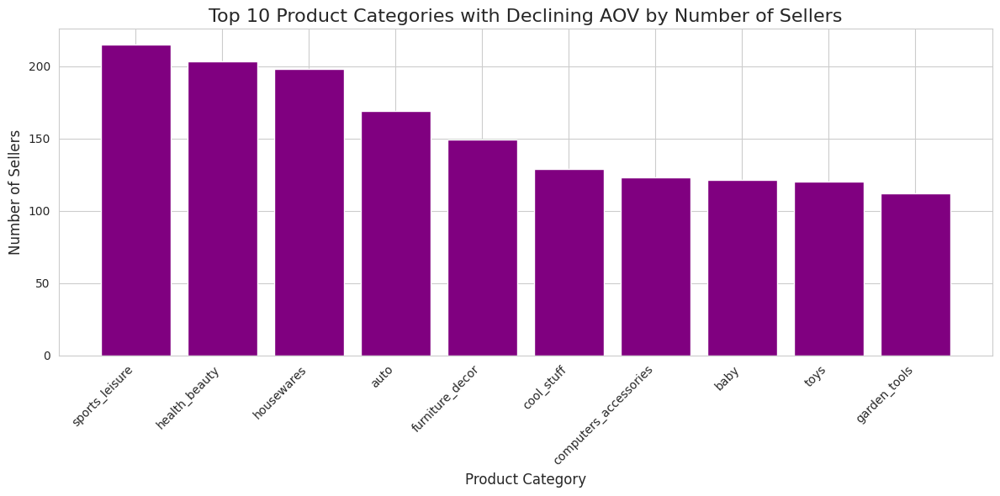

In [ ]:
# Step 1: Filter relevant columns and group by product category
declining_aov_categories = declining_sellers_with_prices[['Seller ID', 'product_category_name_english']]

# Step 2: Count the number of sellers offering each unique product category
category_seller_count = declining_aov_categories.groupby('product_category_name_english').agg(
    NumberOfSellers=('Seller ID', 'nunique')
).reset_index()

# Step 3: Sort the categories by the number of sellers and select the top 10
top_10_categories = category_seller_count.sort_values(by='NumberOfSellers', ascending=False).head(10)

# Step 4: Visualize the distribution of sellers for the top 10 product categories
plt.figure(figsize=(12, 6))
plt.bar(top_10_categories['product_category_name_english'], top_10_categories['NumberOfSellers'], color='purple')
plt.title('Top 10 Product Categories with Declining AOV by Number of Sellers', fontsize=16)
plt.xlabel('Product Category', fontsize=12)
plt.ylabel('Number of Sellers', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


**Observation**

The top 10 products sold are experiencing a declining Average Order Value (AOV). This trend suggests that while these products are frequently sold, the value per transaction is decreasing.

# Conclusion and Recommendation

**Conclusion**:

1. **K-Means Clustering Success**: K-Means effectively clustered sellers into four distinct groups based on their RFM scores. This segmentation provides valuable insights into sellers’ characteristics, which can be leveraged to optimize Olist's revenue and improve seller retention strategies.
2. **Potential Sellers' Performance**: Despite being the highest contributors to Olist's total order value, 'Potential' sellers are placed in the lower-end of the RFM score spectrum. These sellers have high recency, low transaction frequency, and low monetary value per seller, indicating they are less engaged or effective in terms of long-term sales consistency.
3. **Market Disruption by Potential Sellers**: Since 2018, 'Loyal Sellers' and 'Champions' have experienced a decline in transaction frequency and total order value. This downturn is largely due to market disruption by the growing number of new sellers in the 'Potential' segment, who are increasingly capturing market share with lower transaction volumes but higher overall sales volume.
4. **Lost Sellers' Activity**: 'Lost' sellers have not made any transactions since late 2017, indicating that they are no longer active in the market. This segment is essentially inactive, and strategies to either re-engage or formally exit these sellers from the platform could be beneficial.


**Recommendation**:

**Potential:**
1. Bundling and flash sales to increase AOV, especially on products with declining AOV:
- Find ways to convince the sellers in Olist to offer some smart discounts, focusing on top-selling products with declining AOV. These efforts can encourage higher-order values, especially during seasonal times, while ensuring the promotions align with profitability margins.

**The products** are sports_leisure, health_beauty, housewares, auto, furniture_decor, cool_stuff, computers_accessoris, baby, toys, garden_tools

2. Encourage bundling of smaller products to reduce freight-to-price ratio:
- Encourage sellers to bundle smaller, lighter items to minimize freight costs per unit. This strategy can improve customer satisfaction and increase order frequency and monetary value.
- Olist can try using a 'cargo-sharing' system, where goods from multiple sellers going to customers within close proximity go into a single cargo vehicle.
 - Given that this is a major shift in shipping strategy, a pilot plan should be performed by the second month after the publishing of this notebook. At least 33% of cargo transports should use this system within one year of this notebook's publishing.
- Offer "freight-free" promotions for bundles to further incentivize purchases.

**The products** are DVDs, flowers, music, food and drinks, books, and shoes.


**Loyal Sellers & Champions:**
1. Loyalty program with convertible points and exclusive access to new products:
- Introduce a loyalty program with rewards in the form of convertible points. Offer exclusive access to new and higher-end products to increase engagement and retention of high-value sellers.
- Implement tier-based loyalty rewards (e.g., Silver, Gold, Platinum), motivating sellers to increase sales and stay engaged with Olist.

2. Bundling and recommending higher-end products through seasonal marketing:
- Implement a bundling strategy that emphasizes higher-end products, recommended through seasonal marketing campaigns, to maintain the performance and profitability of Loyal Sellers and Champions.
- Run personalized email marketing campaigns that offer tailored product recommendations based on past sales, ensuring the higher-end products are effectively promoted.

**Higher-end products** are watches_gift, bed_bath_table, and furniture_decor


**Lost:**
1. Not investing in the Lost segment:
- Given the minimal contribution of Lost sellers to Olist’s total order value and their inactivity for over a year, focus on active and potential sellers. The resources may be better allocated elsewhere to boost retention and engagement with more promising segments.
- Sending low-cost re-engagement emails or small incentives to revive interest, such as offering discounted listing fees, just to keep the door open for possible returns.


#Downloadable Versions

In [ ]:
#For final dataframe:
!pip install openpyxl==3.0.10
Newdf.to_excel('Newdf.xlsx')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.1/242.1 kB 4.6 MB/s eta 0:00:00
  Attempting uninstall: openpyxl
    Found existing installation: openpyxl 3.1.5
    Uninstalling openpyxl-3.1.5:
      Successfully uninstalled openpyxl-3.1.5
